### Importing all the necessary libraries

In [5]:
!pip install pandas


In [6]:
# loading packages
# basic + dates
import numpy as np
import pandas as pd
# from pandas import datetime
from datetime import datetime

# data visualization
import matplotlib.pyplot as plt
import matplotlib.style
import seaborn as sns # advanced vizs
sns.set_style('darkgrid')
# plt.style.use('seaborn')
from pylab import rcParams
from sklearn import metrics #model performance metrics
import seaborn as sns # advanced vizs
%matplotlib inline

# statistics
from statsmodels.distributions.empirical_distribution import ECDF

# time series analysis
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

import warnings
warnings.filterwarnings("ignore")

# Problem 1: Rose Wine

For this particular assignment, the data of different types of wine sales in the 20th century is to be analysed. Both of these data are from the same company but of different wines. As an analyst in the ABC Estate Wines, you are tasked to analyse and forecast Wine Sales in the 20th century.

In [7]:
df = pd.read_csv('Rose.csv')

In [8]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 187 entries, 0 to 186
Data columns (total 2 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   YearMonth  187 non-null    object 
 1   Rose       185 non-null    float64
dtypes: float64(1), object(1)
memory usage: 3.1+ KB


In [9]:
df.shape

(187, 2)

In [10]:
df.head()

,YearMonth,Rose
0,1980-01,112.0
1,1980-02,118.0
2,1980-03,129.0
3,1980-04,99.0
4,1980-05,116.0


In [11]:
df.tail(5)

,YearMonth,Rose
182,1995-03,45.0
183,1995-04,52.0
184,1995-05,28.0
185,1995-06,40.0
186,1995-07,62.0


## 1. Read the data as an appropriate Time Series data and plot the data.

In [12]:
Time_Stamp= pd.date_range(start='1/1/1980',end='8/1/1995',freq='M')
Time_Stamp

DatetimeIndex(['1980-01-31', '1980-02-29', '1980-03-31', '1980-04-30',
               '1980-05-31', '1980-06-30', '1980-07-31', '1980-08-31',
               '1980-09-30', '1980-10-31',
               ...
               '1994-10-31', '1994-11-30', '1994-12-31', '1995-01-31',
               '1995-02-28', '1995-03-31', '1995-04-30', '1995-05-31',
               '1995-06-30', '1995-07-31'],
              dtype='datetime64[ns]', length=187, freq='ME')

In [13]:
df['Time_Stamp'] = Time_Stamp
df.head()

,YearMonth,Rose,Time_Stamp
0,1980-01,112.0,1980-01-31
1,1980-02,118.0,1980-02-29
2,1980-03,129.0,1980-03-31
3,1980-04,99.0,1980-04-30
4,1980-05,116.0,1980-05-31


In [14]:
df.set_index(keys='Time_Stamp', inplace=True)
df.drop(['YearMonth'], axis=1, inplace=True)
df.head()

,Rose
Time_Stamp,
1980-01-31,112.0
1980-02-29,118.0
1980-03-31,129.0
1980-04-30,99.0
1980-05-31,116.0


In [15]:
df.tail()

,Rose
Time_Stamp,
1995-03-31,45.0
1995-04-30,52.0
1995-05-31,28.0
1995-06-30,40.0
1995-07-31,62.0


### Renaming the column

In [16]:
df.rename(columns={'Rose':'Rose_Wine_Sales'}, inplace=True)
df.head()

,Rose_Wine_Sales
Time_Stamp,
1980-01-31,112.0
1980-02-29,118.0
1980-03-31,129.0
1980-04-30,99.0
1980-05-31,116.0


In [17]:
df.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 187 entries, 1980-01-31 to 1995-07-31
Data columns (total 1 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Rose_Wine_Sales  185 non-null    float64
dtypes: float64(1)
memory usage: 2.9 KB


### Checking for missing values

In [18]:
df.isnull().sum()

,0
Rose_Wine_Sales,2


In [19]:
df[df.isnull().values]

,Rose_Wine_Sales
Time_Stamp,
1994-07-31,NaN
1994-08-31,NaN


Since its a time series, we cannot remove the null values and hence it must be imputed.

### Plot the Time Series to understand the behaviour of the data.

Text(0, 0.5, 'Wine Units Sold')

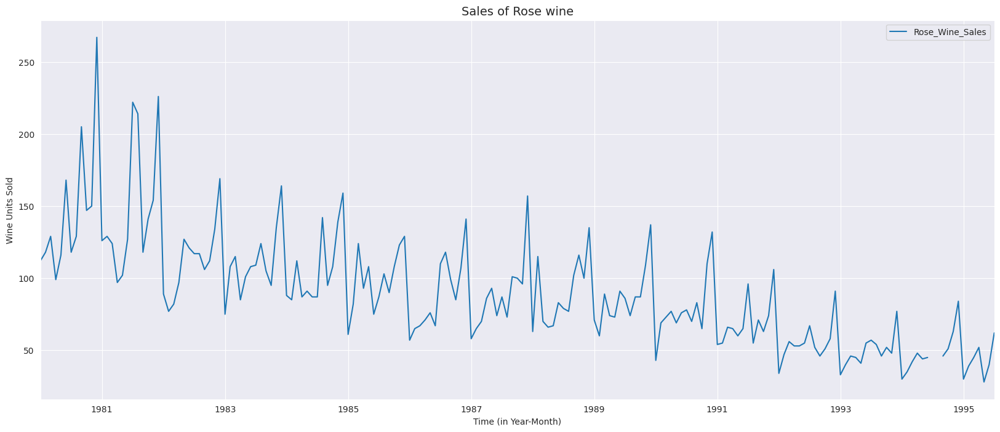

In [20]:
rcParams['figure.figsize'] = 20,8
df.plot(grid=True);
plt.title('Sales of Rose wine', fontsize=14)
plt.xlabel('Time (in Year-Month)',fontsize=10)
plt.ylabel('Wine Units Sold',fontsize=10)


## 2.2. Perform appropriate Exploratory Data Analysis to understand the data and also perform decomposition.

In [21]:
df.head()

,Rose_Wine_Sales
Time_Stamp,
1980-01-31,112.0
1980-02-29,118.0
1980-03-31,129.0
1980-04-30,99.0
1980-05-31,116.0


### Handling missing values

In [22]:
df.converted = df.Rose_Wine_Sales
temp = df.converted.resample('D').mean()
df.Rose_Wine_Sales = round(temp.interpolate(methods='linear'),2)
df.Rose_Wine_Sales['1994']

,Rose_Wine_Sales
Time_Stamp,
1994-01-31,30.00
1994-02-28,35.00
1994-03-31,42.00
1994-04-30,48.00
1994-05-31,44.00
1994-06-30,45.00
1994-07-31,45.34
1994-08-31,45.67
1994-09-30,46.00


The missing values for the months of July and August have been imputed with linear interpolation

In [23]:
df.isnull().sum()

,0
Rose_Wine_Sales,0


### Check the basic measures of descriptive statistics

In [24]:
df.describe()

,Rose_Wine_Sales
count,187.000000
mean,89.914492
std,39.238264
min,28.000000
25%,62.500000
50%,85.000000
75%,111.000000
max,267.000000


1. The average sales of Rose wine is around 90 units
2. The minimuim quantity of sales recorded is 28 and the max is 267 units
3. Around 50% of the sales recorded in a month are around 85 units
4. Only 25% of the sales recorded in a month are above 111 units

### Plot a boxplot to understand the spread of sales across different years and within different months across years.

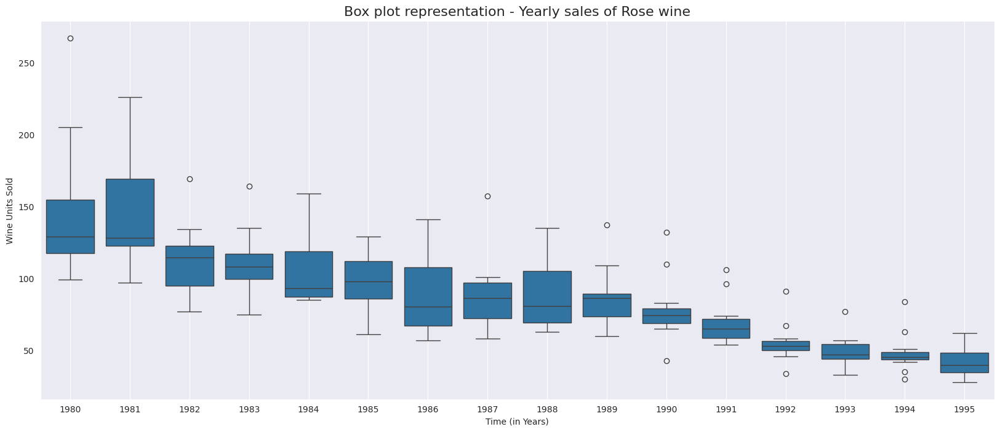

In [25]:
_, ax = plt.subplots(figsize=(20,8))
sns.boxplot(x = df.index.year,y = df.values[:,0],ax=ax)
plt.title('Box plot representation - Yearly sales of Rose wine', fontsize=16)
plt.xlabel('Time (in Years)')
plt.ylabel('Wine Units Sold')
plt.grid();

1. The sales of rose wine have gradually declined over the years
2. At the initial years, the sales were high with maximum sales happening in 1981.

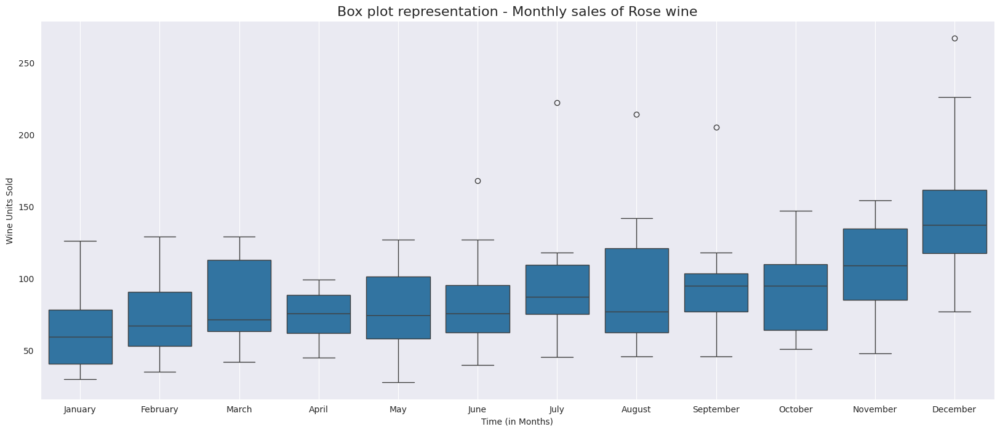

In [26]:
_, ax = plt.subplots(figsize=(20,8))
sns.boxplot(x = df.index.month_name(),y = df.values[:,0],ax=ax)
plt.title('Box plot representation - Monthly sales of Rose wine', fontsize=16)
plt.xlabel('Time (in Months)')
plt.ylabel('Wine Units Sold')
plt.grid();

1. December month records the highest average sales
2. The sales seems to usually pick in the last 4 months

Average order is greater in december and lowest in january

### Plot the empirical cumulative Distribution function

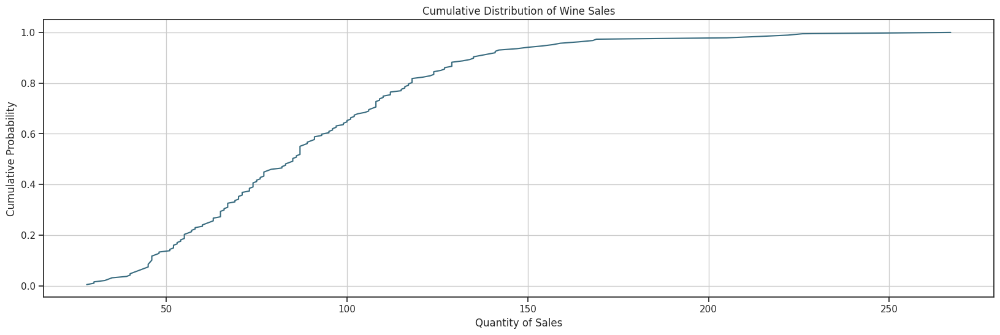

In [27]:
## Plot ECDF: Empirical Cumulative Distribution Function
#ECDF - Adds up the number of observations that are there for a certain value.
sns.set(style = "ticks")# to format into seaborn
c = '#386B7F' # basic color for plots
plt.figure(figsize = (20, 20))


plt.subplot(312)
cdf = ECDF(df['Rose_Wine_Sales'])
plt.plot(cdf.x, cdf.y, label = "statmodels", color = c)
plt.title('Cumulative Distribution of Wine Sales')
plt.xlabel('Quantity of Sales');
plt.ylabel('Cumulative Probability')
plt.grid(True)
plt.show()

1. Around 70 to 90% of the orders are within 100 to 150 units.

### Monthly sales across years.

In [28]:
monthly_sales_across_years = pd.pivot_table(df, values = 'Rose_Wine_Sales', columns = df.index.month_name(), index = df.index.year)
monthly_sales_across_years

Time_Stamp,April,August,December,February,January,July,June,March,May,November,October,September
Time_Stamp,,,,,,,,,,,,
1980,99.0,129.00,267.0,118.0,112.0,118.00,168.0,129.0,116.0,150.0,147.0,205.0
1981,97.0,214.00,226.0,129.0,126.0,222.00,127.0,124.0,102.0,154.0,141.0,118.0
1982,97.0,117.00,169.0,77.0,89.0,117.00,121.0,82.0,127.0,134.0,112.0,106.0
1983,85.0,124.00,164.0,108.0,75.0,109.00,108.0,115.0,101.0,135.0,95.0,105.0
1984,87.0,142.00,159.0,85.0,88.0,87.00,87.0,112.0,91.0,139.0,108.0,95.0
1985,93.0,103.00,129.0,82.0,61.0,87.00,75.0,124.0,108.0,123.0,108.0,90.0
1986,71.0,118.00,141.0,65.0,57.0,110.00,67.0,67.0,76.0,107.0,85.0,99.0
1987,86.0,73.00,157.0,65.0,58.0,87.00,74.0,70.0,93.0,96.0,100.0,101.0
1988,66.0,77.00,135.0,115.0,63.0,79.00,83.0,70.0,67.0,100.0,116.0,102.0


Text(0, 0.5, 'Wine Units Sold')

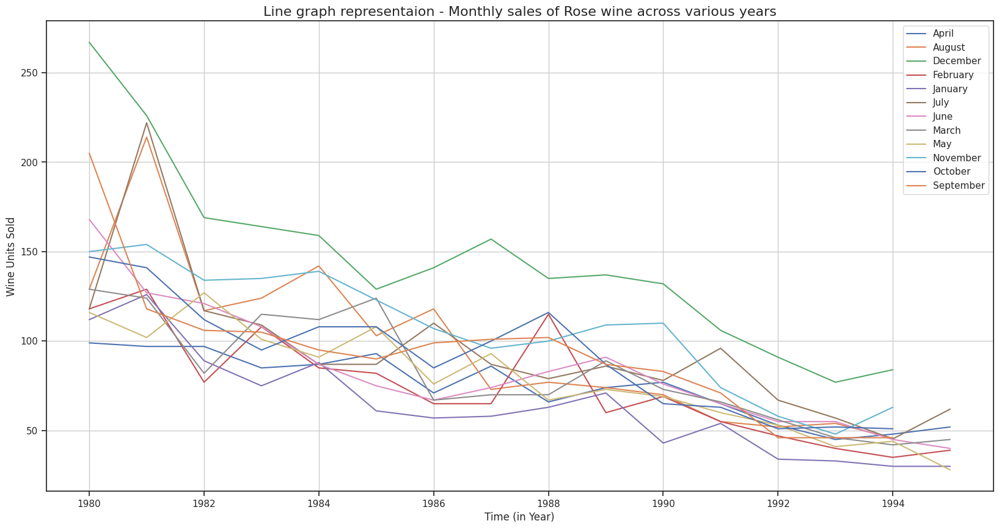

In [29]:
monthly_sales_across_years.plot(figsize=(20,10))
plt.grid();
plt.title('Line graph representaion - Monthly sales of Rose wine across various years', fontsize=16)
plt.legend(loc='best');
plt.xlabel('Time (in Year)')
plt.ylabel('Wine Units Sold')

1. December performed the best in terms of overall and average sales

### Resampling monthly data into a quarterly and yearly format

### Yearly plot

Let us try to resample or aggregate the Time Series from an annual perspective and sum up the observations of each month.

In [30]:
df_yearly_sum = df.resample('A').sum()
df_yearly_sum

,Rose_Wine_Sales
Time_Stamp,
1980-12-31,1758.00
1981-12-31,1780.00
1982-12-31,1348.00
1983-12-31,1324.00
1984-12-31,1280.00
1985-12-31,1183.00
1986-12-31,1063.00
1987-12-31,1060.00
1988-12-31,1073.00


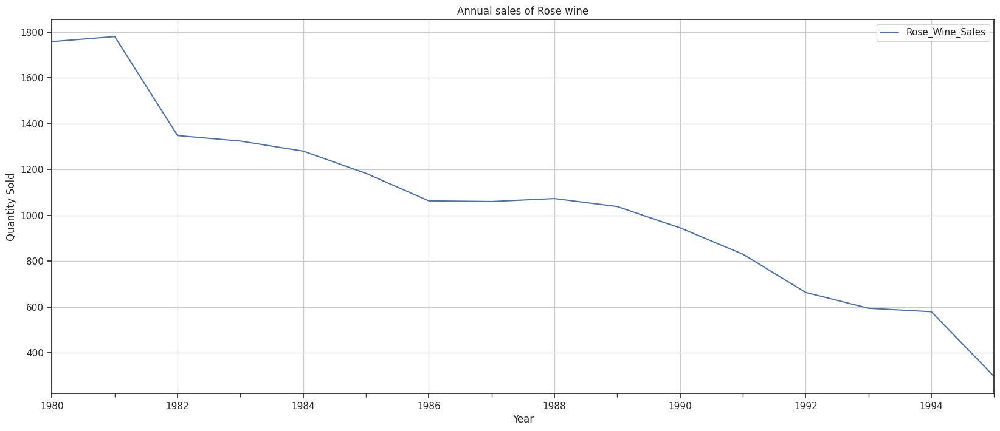

In [31]:
df_yearly_sum.plot();
plt.grid()
plt.title('Annual sales of Rose wine');
plt.xlabel('Year')
plt.ylabel('Quantity Sold');

Let us try to resample or aggregate the Time Series from an annual perspective and take the mean of the observations of the year considering each month as an observation.

### Quarterly Plot

In [32]:
df_quarterly_sum = df.resample('Q').sum()
df_quarterly_sum.head(10)

,Rose_Wine_Sales
Time_Stamp,
1980-03-31,359.0
1980-06-30,383.0
1980-09-30,452.0
1980-12-31,564.0
1981-03-31,379.0
1981-06-30,326.0
1981-09-30,554.0
1981-12-31,521.0
1982-03-31,248.0


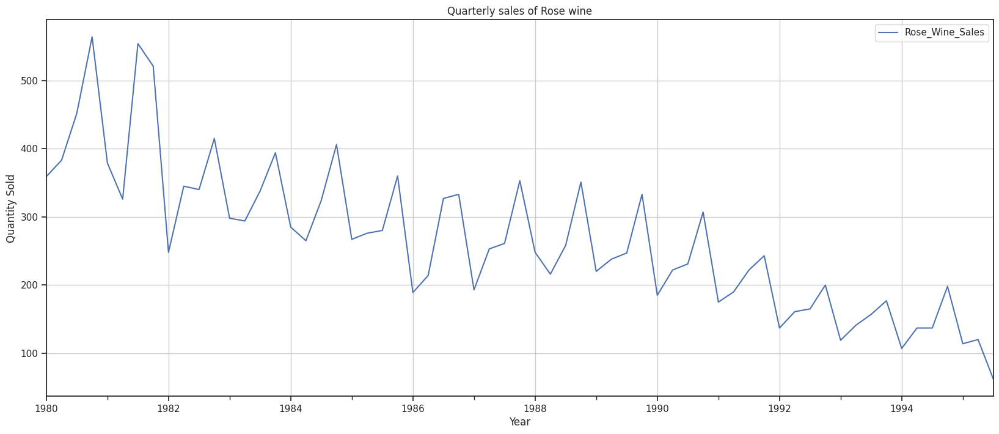

In [33]:
df_quarterly_sum.plot();
plt.grid()
plt.title('Quarterly sales of Rose wine');
plt.xlabel('Year')
plt.ylabel('Quantity Sold');

1. The sales are incresingly high in Q3 and Q4

### Month plot of times series

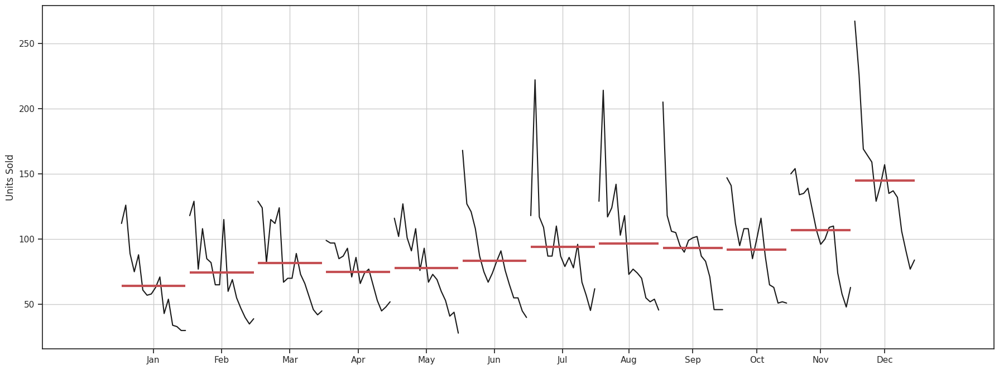

In [34]:
from statsmodels.graphics.tsaplots import month_plot

fig, ax = plt.subplots(figsize=(22,8))

month_plot(df,ylabel='Units Sold',ax=ax)
plt.grid();

### Plot the average sales per month and the month on month percentage change of sales.

In [35]:
df.groupby(by=df.index)["Rose_Wine_Sales"].mean()

,Rose_Wine_Sales
Time_Stamp,
1980-01-31,112.0
1980-02-29,118.0
1980-03-31,129.0
1980-04-30,99.0
1980-05-31,116.0
...,...
1995-03-31,45.0
1995-04-30,52.0
1995-05-31,28.0


In [36]:
df.groupby(by=df.index)["Rose_Wine_Sales"].sum().pct_change()

,Rose_Wine_Sales
Time_Stamp,
1980-01-31,NaN
1980-02-29,0.053571
1980-03-31,0.093220
1980-04-30,-0.232558
1980-05-31,0.171717
...,...
1995-03-31,0.153846
1995-04-30,0.155556
1995-05-31,-0.461538


Text(0, 0.5, '% Change')

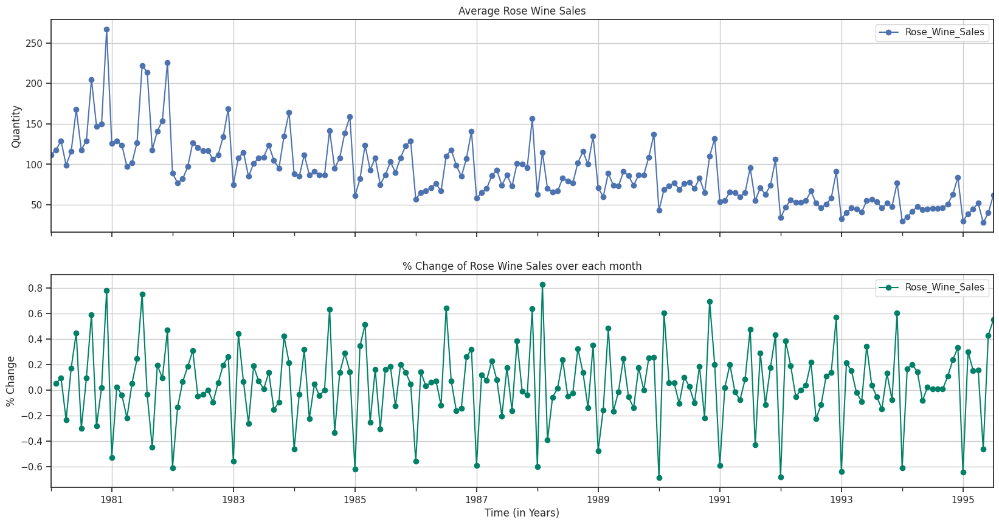

In [37]:
# group by date and get average RetailSales, and percent change
average    = df.groupby(by=df.index)["Rose_Wine_Sales"].mean()
pct_change = df.groupby(by=df.index)["Rose_Wine_Sales"].sum().pct_change()

fig, (axis1,axis2) = plt.subplots(2,1,sharex=True,figsize=(20,10))
# plot average RetailSales over time(year-month)
ax1 = average.plot(legend=True,ax=axis1,marker='o',title="Average Rose Wine Sales",grid=True)
ax1.set_xticks(range(len(average)))
ax1.set_xticklabels(average.index.tolist())
ax1.set_ylabel('Quantity')
# plot precent change for RetailSales over time(year-month)
ax2 = pct_change.plot(legend=True,ax=axis2,marker='o',colormap="summer",title="% Change of Rose Wine Sales over each month",grid=True)
plt.xlabel('Time (in Years)')
ax2.set_ylabel('% Change')


1. Average Rose wine sales graph shows us a downward trend along with yearly seasonality present in it
2. % change graph shows us the seasonality of the change in sales to be constant throghout the lifetime of sales

### Decomposition of the Time Series

### Additive decomposition

<Figure size 2000x800 with 0 Axes>

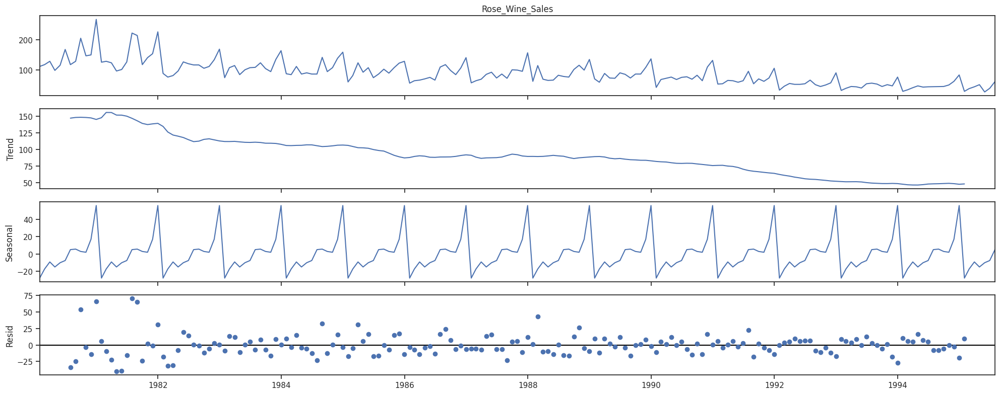

In [38]:
plt.figure(figsize=(20,8))
decomposition = seasonal_decompose(df['Rose_Wine_Sales'],model='additive')
decomposition.plot();
plt.show()

In [39]:
trend = decomposition.trend
seasonality = decomposition.seasonal
residual = decomposition.resid

print('Trend','\n',trend.head(12),'\n')
print('Seasonality','\n',seasonality.head(12),'\n')
print('Residual','\n',residual.head(12),'\n')

Trend 
 Time_Stamp
1980-01-31           NaN
1980-02-29           NaN
1980-03-31           NaN
1980-04-30           NaN
1980-05-31           NaN
1980-06-30           NaN
1980-07-31    147.083333
1980-08-31    148.125000
1980-09-30    148.375000
1980-10-31    148.083333
1980-11-30    147.416667
1980-12-31    145.125000
Name: trend, dtype: float64 

Seasonality 
 Time_Stamp
1980-01-31   -27.908702
1980-02-29   -17.435680
1980-03-31    -9.285889
1980-04-30   -15.098389
1980-05-31   -10.196603
1980-06-30    -7.678746
1980-07-31     4.897298
1980-08-31     5.499853
1980-09-30     2.774631
1980-10-31     1.871853
1980-11-30    16.846853
1980-12-31    55.713520
Name: seasonal, dtype: float64 

Residual 
 Time_Stamp
1980-01-31          NaN
1980-02-29          NaN
1980-03-31          NaN
1980-04-30          NaN
1980-05-31          NaN
1980-06-30          NaN
1980-07-31   -33.980631
1980-08-31   -24.624853
1980-09-30    53.850369
1980-10-31    -2.955187
1980-11-30   -14.263520
1980-12-31    66.16

### Multiplicative Decomposition

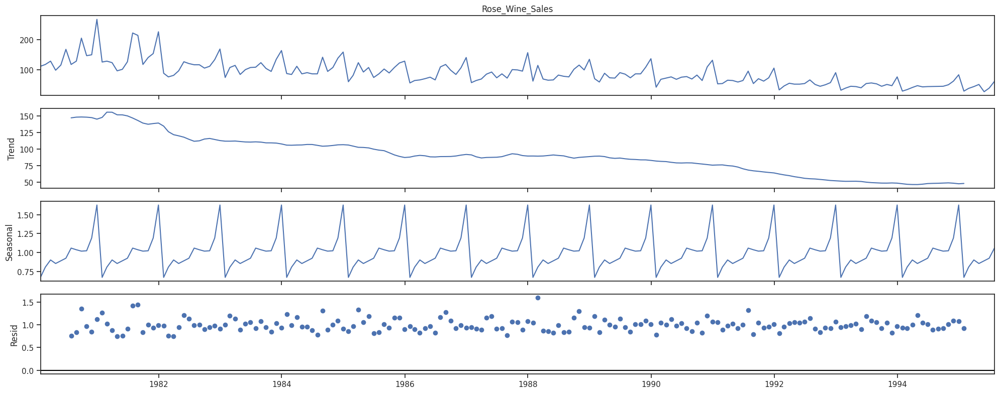

In [40]:
decomposition = seasonal_decompose(df['Rose_Wine_Sales'],model='multiplicative')
decomposition.plot();

In [41]:
trend = decomposition.trend
seasonality = decomposition.seasonal
residual = decomposition.resid

print('Trend','\n',trend.head(12),'\n')
print('Seasonality','\n',seasonality.head(12),'\n')
print('Residual','\n',residual.head(12),'\n')

Trend 
 Time_Stamp
1980-01-31           NaN
1980-02-29           NaN
1980-03-31           NaN
1980-04-30           NaN
1980-05-31           NaN
1980-06-30           NaN
1980-07-31    147.083333
1980-08-31    148.125000
1980-09-30    148.375000
1980-10-31    148.083333
1980-11-30    147.416667
1980-12-31    145.125000
Name: trend, dtype: float64 

Seasonality 
 Time_Stamp
1980-01-31    0.670111
1980-02-29    0.806163
1980-03-31    0.901163
1980-04-30    0.854023
1980-05-31    0.889414
1980-06-30    0.923984
1980-07-31    1.058046
1980-08-31    1.035885
1980-09-30    1.017647
1980-10-31    1.022572
1980-11-30    1.192347
1980-12-31    1.628644
Name: seasonal, dtype: float64 

Residual 
 Time_Stamp
1980-01-31         NaN
1980-02-29         NaN
1980-03-31         NaN
1980-04-30         NaN
1980-05-31         NaN
1980-06-30         NaN
1980-07-31    0.758253
1980-08-31    0.840717
1980-09-30    1.357675
1980-10-31    0.970772
1980-11-30    0.853379
1980-12-31    1.129647
Name: resid, dtype:

## 3. Split the data into training and test. The test data should start in 1991.

### Splitting the data into training and testing

In [42]:
train = df[df.index.year < 1991]
test = df[df.index.year >= 1991]

In [43]:
from IPython.display import display

In [44]:
print('First few rows of Training Data')
display(train.head(10))
print('Last few rows of Training Data')
display(train.tail(10))

First few rows of Training Data


,Rose_Wine_Sales
Time_Stamp,
1980-01-31,112.0
1980-02-29,118.0
1980-03-31,129.0
1980-04-30,99.0
1980-05-31,116.0
1980-06-30,168.0
1980-07-31,118.0
1980-08-31,129.0
1980-09-30,205.0


Last few rows of Training Data


,Rose_Wine_Sales
Time_Stamp,
1990-03-31,73.0
1990-04-30,77.0
1990-05-31,69.0
1990-06-30,76.0
1990-07-31,78.0
1990-08-31,70.0
1990-09-30,83.0
1990-10-31,65.0
1990-11-30,110.0


In [45]:
print('First few rows of Test Data')
display(test.head(10))
print('Last few rows of Test Data')
display(test.tail(10))

First few rows of Test Data


,Rose_Wine_Sales
Time_Stamp,
1991-01-31,54.0
1991-02-28,55.0
1991-03-31,66.0
1991-04-30,65.0
1991-05-31,60.0
1991-06-30,65.0
1991-07-31,96.0
1991-08-31,55.0
1991-09-30,71.0


Last few rows of Test Data


,Rose_Wine_Sales
Time_Stamp,
1994-10-31,51.0
1994-11-30,63.0
1994-12-31,84.0
1995-01-31,30.0
1995-02-28,39.0
1995-03-31,45.0
1995-04-30,52.0
1995-05-31,28.0
1995-06-30,40.0


In [46]:
print('-------------------------------------')
print('Number of observations in Train data   :  ',train.shape)
print('Number of observations in Test data    :  ',test.shape)
print('Total Observations                     :  ',test.shape[0]+train.shape[0])
print('-------------------------------------')

-------------------------------------
Number of observations in Train data   :   (132, 1)
Number of observations in Test data    :   (55, 1)
Total Observations                     :   187
-------------------------------------


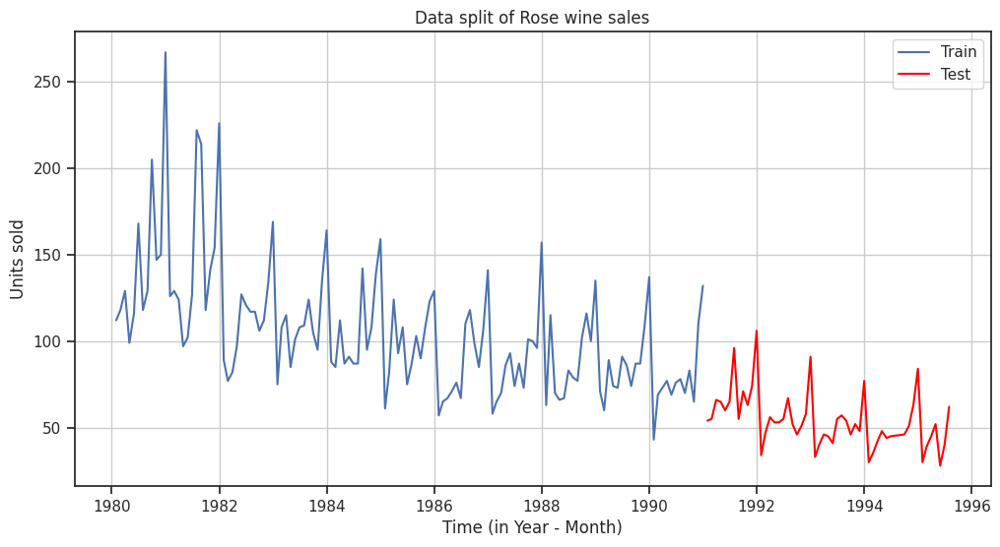

In [47]:
plt.figure(figsize = (12, 6))
plt.plot(train['Rose_Wine_Sales'], label = 'Train')
plt.plot(test['Rose_Wine_Sales'], label = 'Test', color='Red')
plt.legend(loc='best')
plt.xlabel('Time (in Year - Month)')
plt.ylabel('Units sold')
plt.title('Data split of Rose wine sales', fontsize = 12)
plt.show;
plt.grid();


## 4. Build all the exponential smoothing models on the training data and evaluate the model using RMSE on the test data. Other models such as regression,naïve forecast models and simple average models. should also be built on the training data and check the performance on the test data using RMSE.

## Model 1: Linear Regression

In [48]:
train_time = [i+1 for i in range(len(train))]
test_time = [i+len(train)+1 for i in range(len(test))]
print('Training Time instance','\n',train_time)
print('\n')
print('Test Time instance','\n',test_time)

Training Time instance 
 [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132]


Test Time instance 
 [133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187]


We see that we have successfully the generated the numerical time instance order for both the training and test set. Now we will add these values in the training and test set.

In [49]:
LinearRegression_train = train.copy()
LinearRegression_test = test.copy()

In [50]:
LinearRegression_train['Time'] = train_time
LinearRegression_test['Time'] = test_time

print('First few rows of Training Data','\n',LinearRegression_train.head(),'\n')
print('Last few rows of Training Data','\n',LinearRegression_train.tail(),'\n')
print('First few rows of Test Data','\n',LinearRegression_test.head(),'\n')
print('Last few rows of Test Data','\n',LinearRegression_test.tail(),'\n')

First few rows of Training Data 
             Rose_Wine_Sales  Time
Time_Stamp                       
1980-01-31            112.0     1
1980-02-29            118.0     2
1980-03-31            129.0     3
1980-04-30             99.0     4
1980-05-31            116.0     5 

Last few rows of Training Data 
             Rose_Wine_Sales  Time
Time_Stamp                       
1990-08-31             70.0   128
1990-09-30             83.0   129
1990-10-31             65.0   130
1990-11-30            110.0   131
1990-12-31            132.0   132 

First few rows of Test Data 
             Rose_Wine_Sales  Time
Time_Stamp                       
1991-01-31             54.0   133
1991-02-28             55.0   134
1991-03-31             66.0   135
1991-04-30             65.0   136
1991-05-31             60.0   137 

Last few rows of Test Data 
             Rose_Wine_Sales  Time
Time_Stamp                       
1995-03-31             45.0   183
1995-04-30             52.0   184
1995-05-31        

Now that our training and test data has been modified, let us go ahead use $\underline{Linear Regression}$ to build the model on the training data and test the model on the test data.

In [51]:
from sklearn.linear_model import LinearRegression

In [52]:
lr = LinearRegression()

In [53]:
lr.fit(LinearRegression_train[['Time']],LinearRegression_train['Rose_Wine_Sales'].values)

LinearRegression()

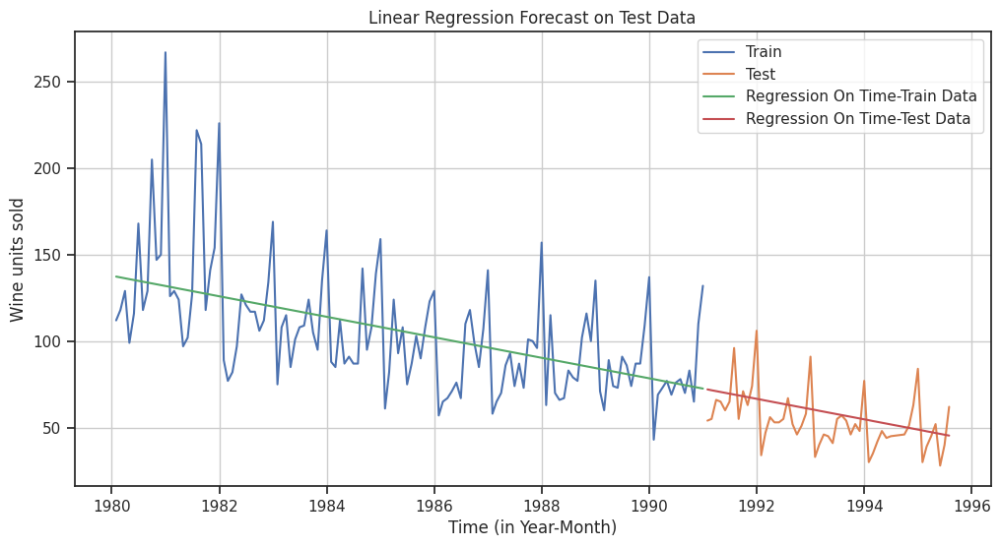

In [54]:
test_predictions_model1 = lr.predict(LinearRegression_test[['Time']])
LinearRegression_test['RegOnTime'] = test_predictions_model1

train_predictions_model1 = lr.predict(LinearRegression_train[['Time']])
LinearRegression_train['RegOnTime'] = train_predictions_model1

plt.figure(figsize=(12,6))
plt.title('Linear Regression Forecast on Test Data')
plt.xlabel('Time (in Year-Month)')
plt.ylabel('Wine units sold')
plt.plot( train['Rose_Wine_Sales'], label='Train')
plt.plot(test['Rose_Wine_Sales'], label='Test')
plt.plot(LinearRegression_train['RegOnTime'], label='Regression On Time-Train Data')
plt.plot(LinearRegression_test['RegOnTime'], label='Regression On Time-Test Data')
plt.legend(loc='best')
plt.grid();

### Model evaluation - Linear Regression

In [56]:
# Test Data - RMSE

# Remove the 'squared' argument
rmse_LR_test = metrics.mean_squared_error(test['Rose_Wine_Sales'], LinearRegression_test['RegOnTime']) ** 0.5
print("For RegressionOnTime forecast on the Test Data,  RMSE is %3.3f" %(rmse_LR_test))

For RegressionOnTime forecast on the Test Data,  RMSE is 15.269


In [58]:
# # Test Data - RMSE

# rmse_LR_test = metrics.mean_squared_error(test['Rose_Wine_Sales'],LinearRegression_test['RegOnTime'],squared=False)
# print("For RegressionOnTime forecast on the Test Data,  RMSE is %3.3f" %(rmse_LR_test))

In [59]:
resultsDf = pd.DataFrame({'Test RMSE': [rmse_LR_test]},index=['Linear Regression'])
resultsDf

,Test RMSE
Linear Regression,15.268887


## Model 2: Naive Forecast ($\hat{y}_{t+1} = y_t$)

#### For this particular naive model, we say that the prediction for tomorrow is the same as today and the prediction for day after tomorrow is tomorrow and since the prediction of tomorrow is same as today,therefore the prediction for day after tomorrow is also today.

In [60]:
NaiveModel_train = train.copy()
NaiveModel_test = test.copy()

In [61]:
#Taking the last value in the train data
NaiveModel_test['naive'] = np.asarray(train['Rose_Wine_Sales'])[len(np.asarray(train['Rose_Wine_Sales']))-1]
NaiveModel_test['naive'].head()

,naive
Time_Stamp,
1991-01-31,132.0
1991-02-28,132.0
1991-03-31,132.0
1991-04-30,132.0
1991-05-31,132.0


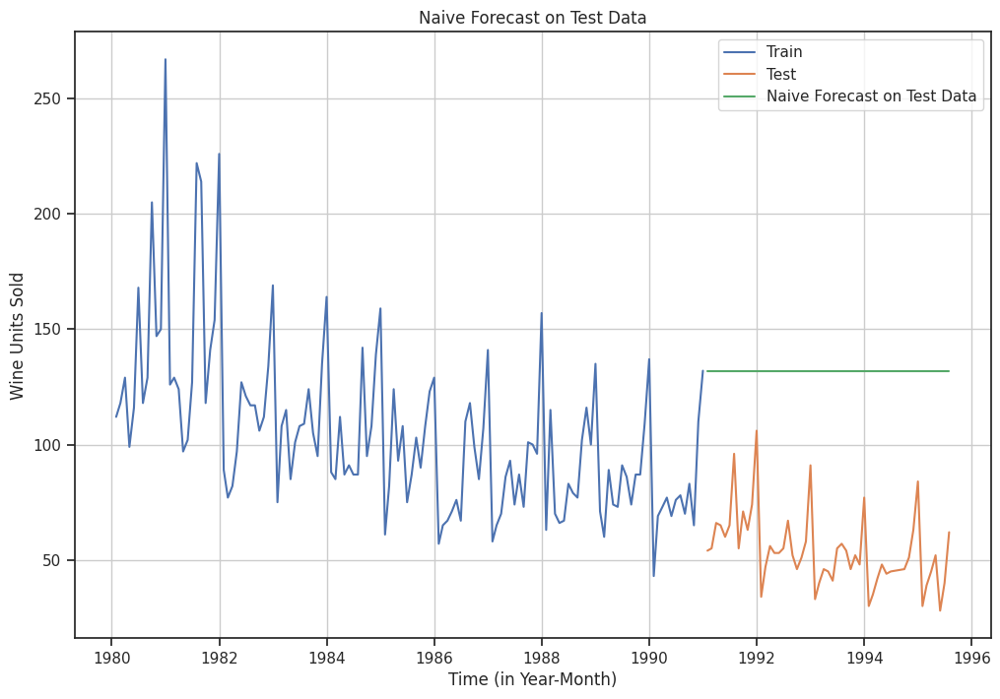

In [62]:
plt.figure(figsize=(12,8))
plt.title('Naive Forecast on Test Data')
plt.xlabel('Time (in Year-Month)')
plt.ylabel('Wine Units Sold')
plt.plot(NaiveModel_train['Rose_Wine_Sales'], label='Train')
plt.plot(test['Rose_Wine_Sales'], label='Test')
plt.plot(NaiveModel_test['naive'], label='Naive Forecast on Test Data')
plt.legend(loc='best')
plt.grid();

### Model Evauation - Naive Forecast Model

In [73]:
# Testing Data - RMSE and MAPE

# Remove the 'squared' argument and take the square root to get RMSE
rmse_Naive_test = metrics.mean_squared_error(test['Rose_Wine_Sales'],NaiveModel_test['naive']) ** 0.5
print("For Naive forecast on the Testing Data:  RMSE is %3.3f " %(rmse_Naive_test))

For Naive forecast on the Testing Data:  RMSE is 79.719 


In [74]:
resultsDf2 = pd.DataFrame({'Test RMSE': [rmse_Naive_test]},index=['Naive Model'])

resultsDf = pd.concat([resultsDf, resultsDf2])
resultsDf

,Test RMSE
Linear Regression,15.268887
Naive Model,79.718576


## Method 3: Simple Average

### For this particular simple average method, we will forecast by using the average of the training values.

In [76]:
SimpleAverage_train = train.copy()
SimpleAverage_test = test.copy()

In [77]:
SimpleAverage_test['mean_forecast'] = train['Rose_Wine_Sales'].mean()
SimpleAverage_test.head()

,Rose_Wine_Sales,mean_forecast
Time_Stamp,,
1991-01-31,54.0,104.939394
1991-02-28,55.0,104.939394
1991-03-31,66.0,104.939394
1991-04-30,65.0,104.939394
1991-05-31,60.0,104.939394


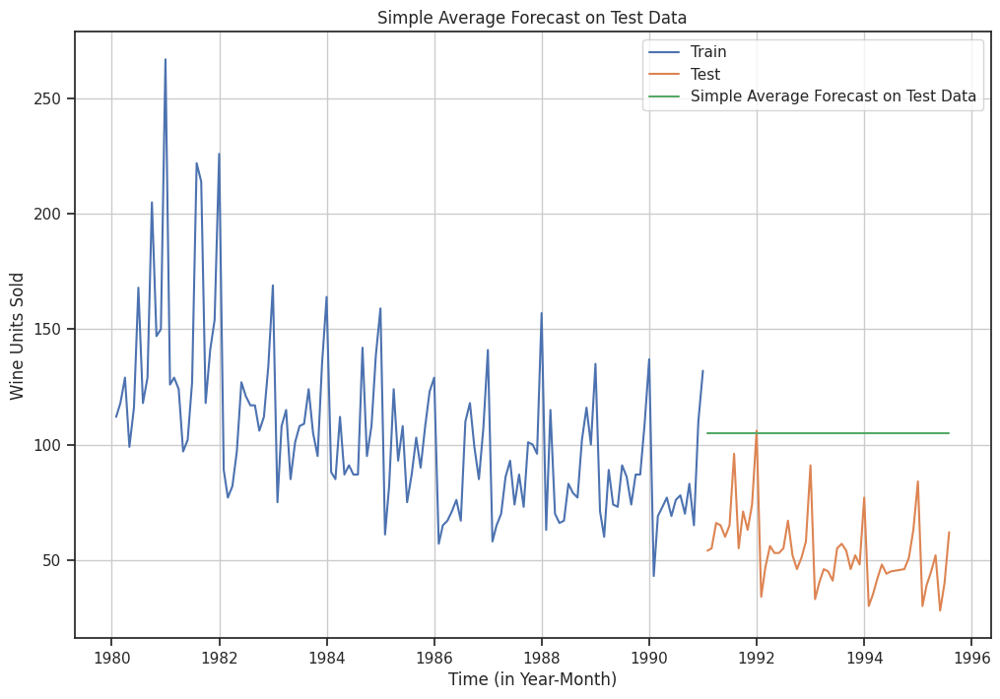

In [78]:
plt.figure(figsize=(12,8))
plt.title('Simple Average Forecast on Test Data')
plt.xlabel('Time (in Year-Month)')
plt.ylabel('Wine Units Sold')
plt.plot(SimpleAverage_train['Rose_Wine_Sales'], label='Train')
plt.plot(SimpleAverage_test['Rose_Wine_Sales'], label='Test')
plt.plot(SimpleAverage_test['mean_forecast'], label='Simple Average Forecast on Test Data')
plt.legend(loc='best')
plt.grid();

### Model Evauation - Simple Average Model

In [90]:
## Test Data - RMSE

# Remove the 'squared' argument and take the square root to get RMSE
rmse_simple_average_test = metrics.mean_squared_error(test['Rose_Wine_Sales'],SimpleAverage_test['mean_forecast']) ** 0.5
print("For Simple Average forecast on the Test Data,  RMSE is %3.3f" %(rmse_simple_average_test))

For Simple Average forecast on the Test Data,  RMSE is 53.460


In [92]:
resultsDf3 = pd.DataFrame({'Test RMSE': [rmse_simple_average_test]},index=['Simple Average'])

resultsDf = pd.concat([resultsDf, resultsDf3])
resultsDf

,Test RMSE
Linear Regression,15.268887
Naive Model,79.718576
Simple Average,53.460367
Simple Average,53.460367


## Model 4: Moving Average (MA)

### For the moving average model, we are going to calculate rolling means (or moving averages) for different intervals. The best interval can be determined by the maximum accuracy (or the minimum error) over here.

#### For Moving Average, we are going to average over the entire data.

In [93]:
MovingAverage = df.copy()
MovingAverage.head()

,Rose_Wine_Sales
Time_Stamp,
1980-01-31,112.0
1980-02-29,118.0
1980-03-31,129.0
1980-04-30,99.0
1980-05-31,116.0


#### Trailing moving averages

In [94]:
MovingAverage['Trailing_2'] = MovingAverage['Rose_Wine_Sales'].rolling(2).mean()
MovingAverage['Trailing_4'] = MovingAverage['Rose_Wine_Sales'].rolling(4).mean()
MovingAverage['Trailing_6'] = MovingAverage['Rose_Wine_Sales'].rolling(6).mean()
MovingAverage['Trailing_9'] = MovingAverage['Rose_Wine_Sales'].rolling(9).mean()

MovingAverage.head(9)

,Rose_Wine_Sales,Trailing_2,Trailing_4,Trailing_6,Trailing_9
Time_Stamp,,,,,
1980-01-31,112.0,NaN,NaN,NaN,NaN
1980-02-29,118.0,115.0,NaN,NaN,NaN
1980-03-31,129.0,123.5,NaN,NaN,NaN
1980-04-30,99.0,114.0,114.50,NaN,NaN
1980-05-31,116.0,107.5,115.50,NaN,NaN
1980-06-30,168.0,142.0,128.00,123.666667,NaN
1980-07-31,118.0,143.0,125.25,124.666667,NaN
1980-08-31,129.0,123.5,132.75,126.500000,NaN
1980-09-30,205.0,167.0,155.00,139.166667,132.666667


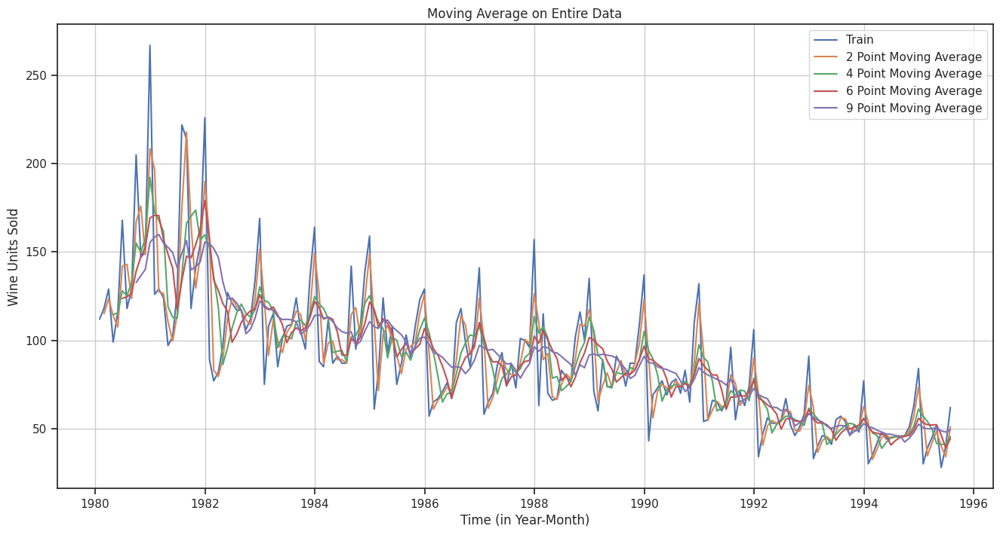

In [95]:
#Plotting on the whole data

plt.figure(figsize=(16,8))
plt.plot(MovingAverage['Rose_Wine_Sales'], label='Train')
plt.plot(MovingAverage['Trailing_2'], label='2 Point Moving Average')
plt.plot(MovingAverage['Trailing_4'], label='4 Point Moving Average')
plt.plot(MovingAverage['Trailing_6'],label = '6 Point Moving Average')
plt.plot(MovingAverage['Trailing_9'],label = '9 Point Moving Average')
plt.title('Moving Average on Entire Data')
plt.xlabel('Time (in Year-Month)')
plt.ylabel('Wine Units Sold')
plt.legend(loc = 'best')
plt.grid();

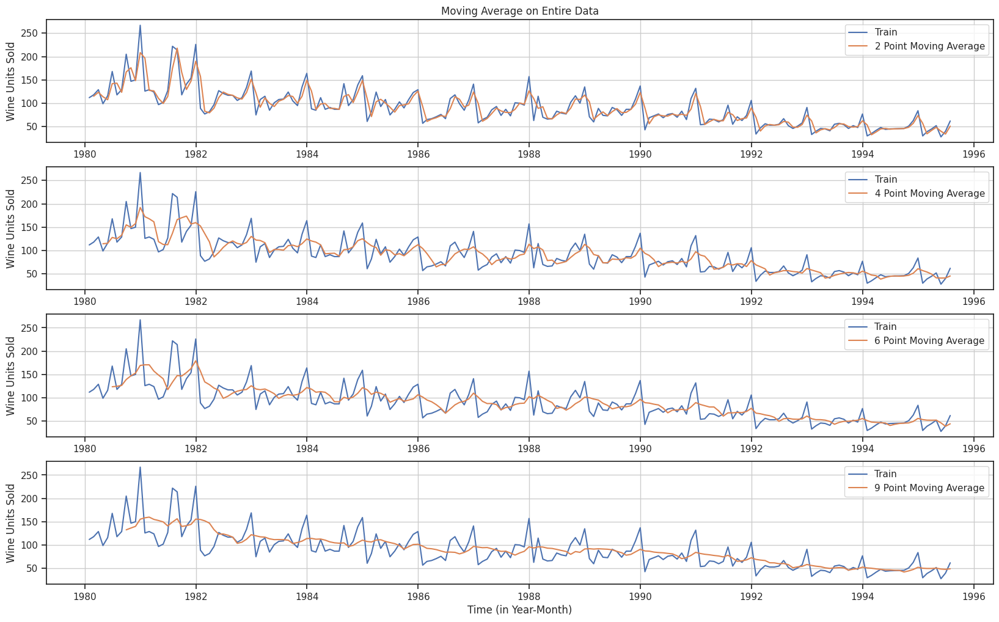

In [96]:
#Plotting on the whole data separately

plt.figure(figsize=(20,12))


plt.subplot(4,1,1)
plt.plot(MovingAverage['Rose_Wine_Sales'], label='Train')
plt.plot(MovingAverage['Trailing_2'], label='2 Point Moving Average')
plt.title('Moving Average on Entire Data')
plt.ylabel('Wine Units Sold')
plt.legend(loc = 'best')
plt.grid();

plt.subplot(4,1,2)
plt.plot(MovingAverage['Rose_Wine_Sales'], label='Train')
plt.plot(MovingAverage['Trailing_4'], label='4 Point Moving Average')
plt.ylabel('Wine Units Sold')
plt.legend(loc = 'best')
plt.grid();

plt.subplot(4,1,3)
plt.plot(MovingAverage['Rose_Wine_Sales'], label='Train')
plt.plot(MovingAverage['Trailing_6'],label = '6 Point Moving Average')
plt.ylabel('Wine Units Sold')
plt.legend(loc = 'best')
plt.grid();

plt.subplot(4,1,4)
plt.plot(MovingAverage['Rose_Wine_Sales'], label='Train')
plt.plot(MovingAverage['Trailing_9'],label = '9 Point Moving Average')
plt.ylabel('Wine Units Sold')
plt.xlabel('Time (in Year-Month)')
plt.legend(loc = 'best')

plt.grid();

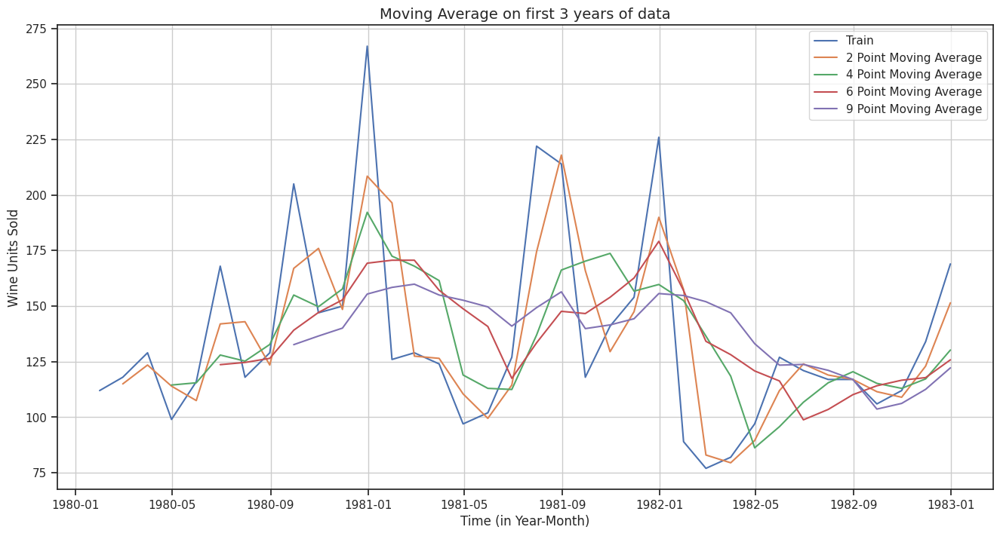

In [97]:
#Plotting on the first 3 years of data

plt.figure(figsize=(16,8))
plt.plot(MovingAverage['Rose_Wine_Sales'].iloc[:-151], label='Train')
plt.plot(MovingAverage['Trailing_2'].iloc[:-151], label='2 Point Moving Average')
plt.plot(MovingAverage['Trailing_4'].iloc[:-151], label='4 Point Moving Average')
plt.plot(MovingAverage['Trailing_6'].iloc[:-151],label = '6 Point Moving Average')
plt.plot(MovingAverage['Trailing_9'].iloc[:-151],label = '9 Point Moving Average')
plt.title('Moving Average on first 3 years of data',fontsize=14)
plt.xlabel('Time (in Year-Month)')
plt.ylabel('Wine Units Sold')
plt.legend(loc = 'best')
plt.grid();

In [98]:
#Creating train and test set
trailing_MovingAverage_train = MovingAverage[MovingAverage.index.year < 1991]
trailing_MovingAverage_test = MovingAverage[MovingAverage.index.year >= 1991]

Text(0.5, 1.0, 'Trailing Moving Average Forecast on Rose Wine Sales')

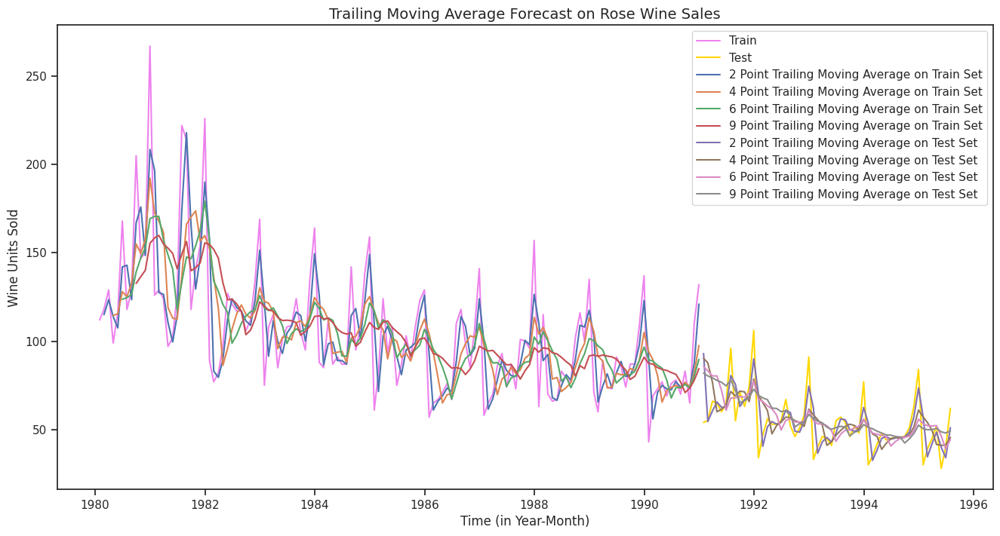

In [99]:
# Plotting on both the Training and Test data

plt.figure(figsize=(16,8))
plt.plot(trailing_MovingAverage_train['Rose_Wine_Sales'], label='Train', color = 'violet')
plt.plot(trailing_MovingAverage_test['Rose_Wine_Sales'], label='Test', color = 'gold')

plt.plot(trailing_MovingAverage_train['Trailing_2'], label='2 Point Trailing Moving Average on Train Set')
plt.plot(trailing_MovingAverage_train['Trailing_4'], label='4 Point Trailing Moving Average on Train Set')
plt.plot(trailing_MovingAverage_train['Trailing_6'],label = '6 Point Trailing Moving Average on Train Set')
plt.plot(trailing_MovingAverage_train['Trailing_9'],label = '9 Point Trailing Moving Average on Train Set')

plt.plot(trailing_MovingAverage_test['Trailing_2'], label='2 Point Trailing Moving Average on Test Set')
plt.plot(trailing_MovingAverage_test['Trailing_4'], label='4 Point Trailing Moving Average on Test Set')
plt.plot(trailing_MovingAverage_test['Trailing_6'],label = '6 Point Trailing Moving Average on Test Set')
plt.plot(trailing_MovingAverage_test['Trailing_9'],label = '9 Point Trailing Moving Average on Test Set')
plt.legend(loc = 'best')
plt.xlabel('Time (in Year-Month)')
plt.ylabel('Wine Units Sold')

plt.title("Trailing Moving Average Forecast on Rose Wine Sales", fontsize=14)

Text(0.5, 1.0, 'Trailing Moving Average Forecast on Rose Wine Sales')

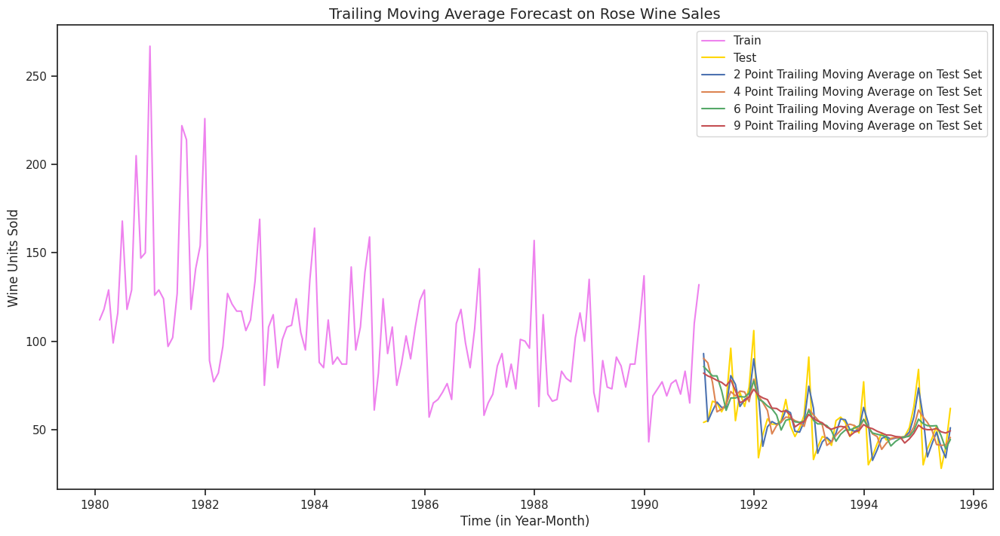

In [100]:
# Plotting on both the Training and Test data

plt.figure(figsize=(16,8))
plt.plot(trailing_MovingAverage_train['Rose_Wine_Sales'], label='Train', color = 'violet')
plt.plot(trailing_MovingAverage_test['Rose_Wine_Sales'], label='Test', color = 'gold')

plt.plot(trailing_MovingAverage_test['Trailing_2'], label='2 Point Trailing Moving Average on Test Set')
plt.plot(trailing_MovingAverage_test['Trailing_4'], label='4 Point Trailing Moving Average on Test Set')
plt.plot(trailing_MovingAverage_test['Trailing_6'],label = '6 Point Trailing Moving Average on Test Set')
plt.plot(trailing_MovingAverage_test['Trailing_9'],label = '9 Point Trailing Moving Average on Test Set')
plt.legend(loc = 'best')
plt.xlabel('Time (in Year-Month)')
plt.ylabel('Wine Units Sold')

plt.title("Trailing Moving Average Forecast on Rose Wine Sales", fontsize=14)

Text(0.5, 1.0, 'Trailing Moving Average Forecast on Rose Wine Sales')

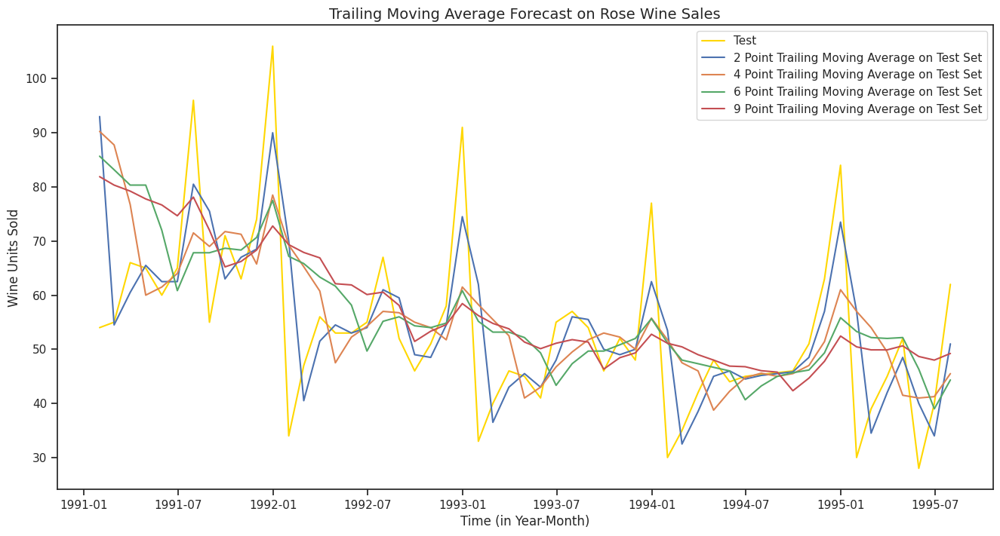

In [101]:
# Plotting on both the Training and Test data

plt.figure(figsize=(16,8))
plt.plot(trailing_MovingAverage_test['Rose_Wine_Sales'], label='Test', color = 'gold')

plt.plot(trailing_MovingAverage_test['Trailing_2'], label='2 Point Trailing Moving Average on Test Set')
plt.plot(trailing_MovingAverage_test['Trailing_4'], label='4 Point Trailing Moving Average on Test Set')
plt.plot(trailing_MovingAverage_test['Trailing_6'],label = '6 Point Trailing Moving Average on Test Set')
plt.plot(trailing_MovingAverage_test['Trailing_9'],label = '9 Point Trailing Moving Average on Test Set')
plt.legend(loc = 'best')
plt.xlabel('Time (in Year-Month)')
plt.ylabel('Wine Units Sold')

plt.title("Trailing Moving Average Forecast on Rose Wine Sales", fontsize=14)

### Model Evauation - Moving Average

In [103]:
## Test Data - RMSE --> 2 point Trailing MA

# Calculate MSE and then take the square root to get RMSE
rmse_MA_test_2 = metrics.mean_squared_error(test['Rose_Wine_Sales'],trailing_MovingAverage_test['Trailing_2']) ** 0.5
print("For 2 point Moving Average Model forecast on the Training Data,  RMSE is %3.3f" %(rmse_MA_test_2))

## Test Data - RMSE --> 4 point Trailing MA

# Calculate MSE and then take the square root to get RMSE
rmse_MA_test_4 = metrics.mean_squared_error(test['Rose_Wine_Sales'],trailing_MovingAverage_test['Trailing_4']) ** 0.5
print("For 4 point Moving Average Model forecast on the Training Data,  RMSE is %3.3f" %(rmse_MA_test_4))

## Test Data - RMSE --> 6 point Trailing MA

# Calculate MSE and then take the square root to get RMSE
rmse_MA_test_6 = metrics.mean_squared_error(test['Rose_Wine_Sales'],trailing_MovingAverage_test['Trailing_6']) ** 0.5
print("For 6 point Moving Average Model forecast on the Training Data,  RMSE is %3.3f" %(rmse_MA_test_6))

## Test Data - RMSE --> 9 point Trailing MA

# Calculate MSE and then take the square root to get RMSE
rmse_MA_test_9 = metrics.mean_squared_error(test['Rose_Wine_Sales'],trailing_MovingAverage_test['Trailing_9']) ** 0.5
print("For 9 point Moving Average Model forecast on the Training Data,  RMSE is %3.3f" %(rmse_MA_test_9))

For 2 point Moving Average Model forecast on the Training Data,  RMSE is 11.529
For 4 point Moving Average Model forecast on the Training Data,  RMSE is 14.451
For 6 point Moving Average Model forecast on the Training Data,  RMSE is 14.566
For 9 point Moving Average Model forecast on the Training Data,  RMSE is 14.728


In [105]:
resultsDf4 = pd.DataFrame({'Test RMSE': [rmse_MA_test_2,rmse_MA_test_4
                                          ,rmse_MA_test_6,rmse_MA_test_9]
                            }
                           ,index=['2 point TMA','4 point TMA'
                                   ,'6 point TMA','9 point TMA'])

resultsDf = pd.concat([resultsDf, resultsDf4])
resultsDf

,Test RMSE
Linear Regression,15.268887
Naive Model,79.718576
Simple Average,53.460367
Simple Average,53.460367
2 point TMA,11.529278
4 point TMA,14.451376
6 point TMA,14.566262
9 point TMA,14.727596


### Before we go on to build the various Exponential Smoothing models, let us plot all the models and compare the Time Series plots.

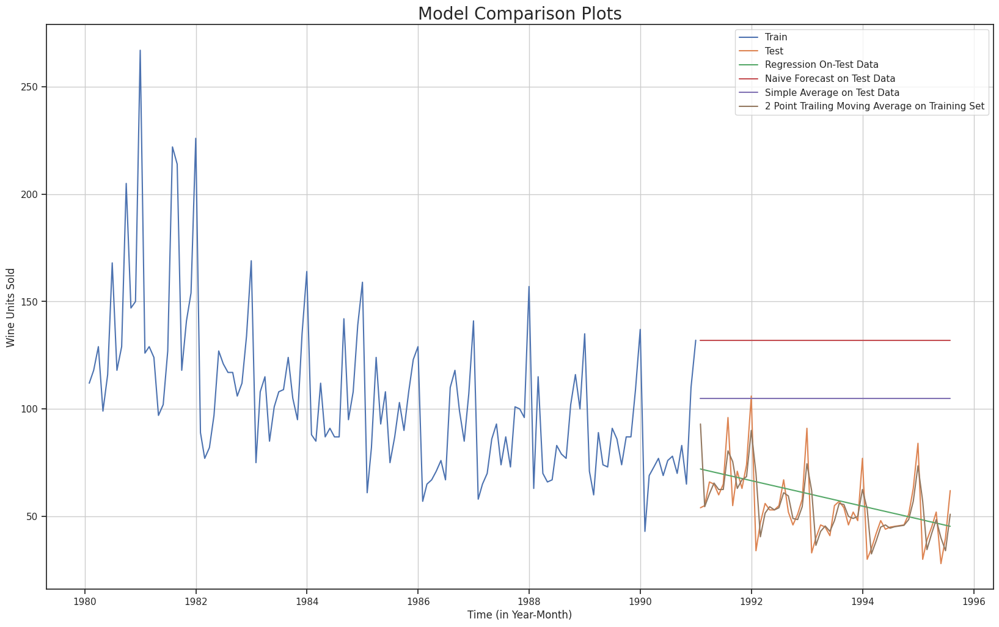

In [106]:
## Plotting on both Training and Test data

plt.figure(figsize=(20,12))
plt.plot(train['Rose_Wine_Sales'], label='Train')
plt.plot(test['Rose_Wine_Sales'], label='Test')

plt.plot(LinearRegression_test['RegOnTime'], label='Regression On-Test Data')

plt.plot(NaiveModel_test['naive'], label='Naive Forecast on Test Data')

plt.plot(SimpleAverage_test['mean_forecast'], label='Simple Average on Test Data')

plt.plot(trailing_MovingAverage_test['Trailing_2'], label='2 Point Trailing Moving Average on Training Set')


plt.legend(loc='best')
plt.title("Model Comparison Plots",fontsize=20)
plt.xlabel('Time (in Year-Month)')
plt.ylabel('Wine Units Sold')
plt.grid();

## Model 5: Simple Exponential Smoothing

In [107]:
from statsmodels.tsa.api import ExponentialSmoothing, SimpleExpSmoothing, Holt

In [108]:
SES_train = train.copy()
SES_test = test.copy()

In [109]:
model_SES = SimpleExpSmoothing(SES_train['Rose_Wine_Sales'])

In [110]:
# Fitting the Simple Exponential Smoothing model and asking python to choose the optimal parameters
model_SES_autofit = model_SES.fit(optimized=True)

In [111]:
model_SES_autofit.params

{'smoothing_level': np.float64(0.12362013466760018),
 'smoothing_trend': np.float64(nan),
 'smoothing_seasonal': np.float64(nan),
 'damping_trend': nan,
 'initial_level': np.float64(112.0),
 'initial_trend': np.float64(nan),
 'initial_seasons': array([], dtype=float64),
 'use_boxcox': False,
 'lamda': None,
 'remove_bias': False}

In [112]:
SES_test['predict'] = model_SES_autofit.forecast(steps=len(test))
SES_test.head()

,Rose_Wine_Sales,predict
Time_Stamp,,
1991-01-31,54.0,87.983765
1991-02-28,55.0,87.983765
1991-03-31,66.0,87.983765
1991-04-30,65.0,87.983765
1991-05-31,60.0,87.983765


Text(0, 0.5, 'Wine Units Sold')

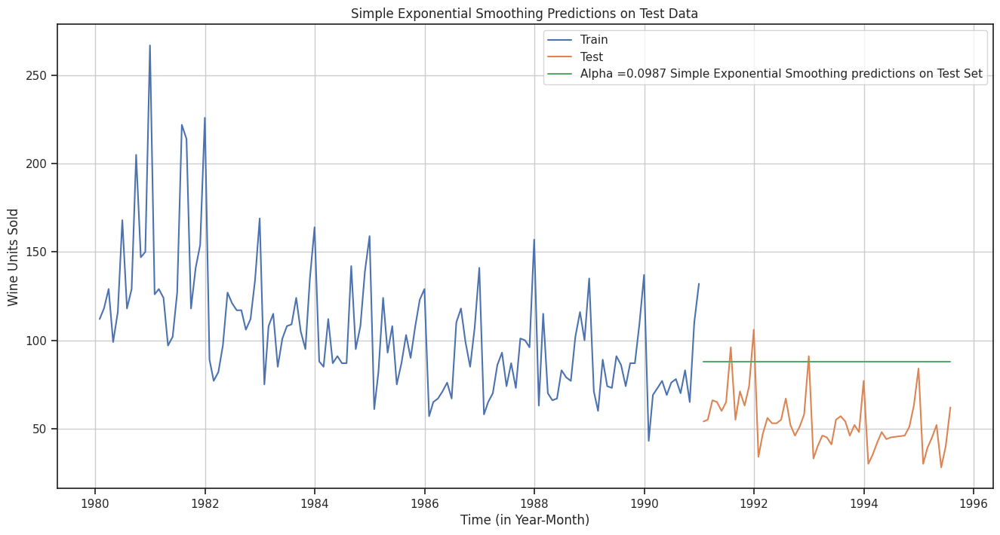

In [113]:
## Plotting on both the Training and Test data

plt.figure(figsize=(16,8))
plt.plot(SES_train['Rose_Wine_Sales'], label='Train')
plt.plot(SES_test['Rose_Wine_Sales'], label='Test')

plt.plot(SES_test['predict'], label='Alpha =0.0987 Simple Exponential Smoothing predictions on Test Set')

plt.legend(loc='best')
plt.grid()
plt.title('Simple Exponential Smoothing Predictions on Test Data');
plt.xlabel('Time (in Year-Month)')
plt.ylabel('Wine Units Sold')

### Model Evaluation for $\alpha$ = 0.0987 : Simple Exponential Smoothing

In [115]:
## Test Data

# Calculate MSE and then take the square root to get RMSE
rmse_model5_test_1 = metrics.mean_squared_error(SES_test['Rose_Wine_Sales'],SES_test['predict']) ** 0.5
print("For Alpha =0.0987 Simple Exponential Smoothing Model forecast on the Test Data, RMSE is %3.3f" %(rmse_model5_test_1))

For Alpha =0.0987 Simple Exponential Smoothing Model forecast on the Test Data, RMSE is 37.592


In [116]:
resultsDf_5 = pd.DataFrame({'Test RMSE': [rmse_model5_test_1]},index=['Alpha=0.0987,SimpleExponentialSmoothing'])

resultsDf = pd.concat([resultsDf, resultsDf_5])
resultsDf

,Test RMSE
Linear Regression,15.268887
Naive Model,79.718576
Simple Average,53.460367
Simple Average,53.460367
2 point TMA,11.529278
4 point TMA,14.451376
6 point TMA,14.566262
9 point TMA,14.727596
"Alpha=0.0987,SimpleExponentialSmoothing",37.592007


#### Setting different alpha values.

###### Remember, the higher the alpha value more weightage is given to the more recent observation. That means, what happened recently will happen again.


#### We will run a loop with different alpha values to understand which particular value works best for alpha on the test set.

In [117]:
## First we will define an empty dataframe to store our values from the loop

resultsDf_6 = pd.DataFrame({'Alpha Values':[],'Train RMSE':[],'Test RMSE': []})
resultsDf_6

,Alpha Values,Train RMSE,Test RMSE


In [123]:
for i in np.arange(0.1,1,0.05):
    model_SES_alpha_i = model_SES.fit(smoothing_level=i,optimized=False,use_brute=True)
    SES_train['predict',i] = model_SES_alpha_i.fittedvalues
    SES_test['predict',i] = model_SES_alpha_i.forecast(steps=len(test))

    rmse_model5_train_i = metrics.mean_squared_error(SES_train['Rose_Wine_Sales'],SES_train['predict',i]) ** 0.5 # Taking the square root to get RMSE
    rmse_model5_test_i = metrics.mean_squared_error(SES_test['Rose_Wine_Sales'],SES_test['predict',i]) ** 0.5 # Taking the square root to get RMSE #This line was incorrectly indented

    # Create a temporary DataFrame for the current iteration's results
    temp_df = pd.DataFrame({'Alpha Values': [i], 'Train RMSE': [rmse_model5_train_i], 'Test RMSE': [rmse_model5_test_i]})
    # Concatenate the temporary DataFrame with the main results DataFrame
    resultsDf_6 = pd.concat([resultsDf_6, temp_df], ignore_index=True)

In [125]:
resultsDf_6.sort_values(by=['Test RMSE'],ascending=True)

,Alpha Values,Train RMSE,Test RMSE
0,0.10,31.815610,36.827827
1,0.15,31.809845,38.721920
2,0.20,31.979391,41.361671
3,0.25,32.211871,44.360591
4,0.30,32.470164,47.504617
5,0.35,32.744341,50.665469
6,0.40,33.035130,53.767204
7,0.45,33.346578,56.766932
8,0.50,33.682839,59.641585
9,0.55,34.047042,62.378789


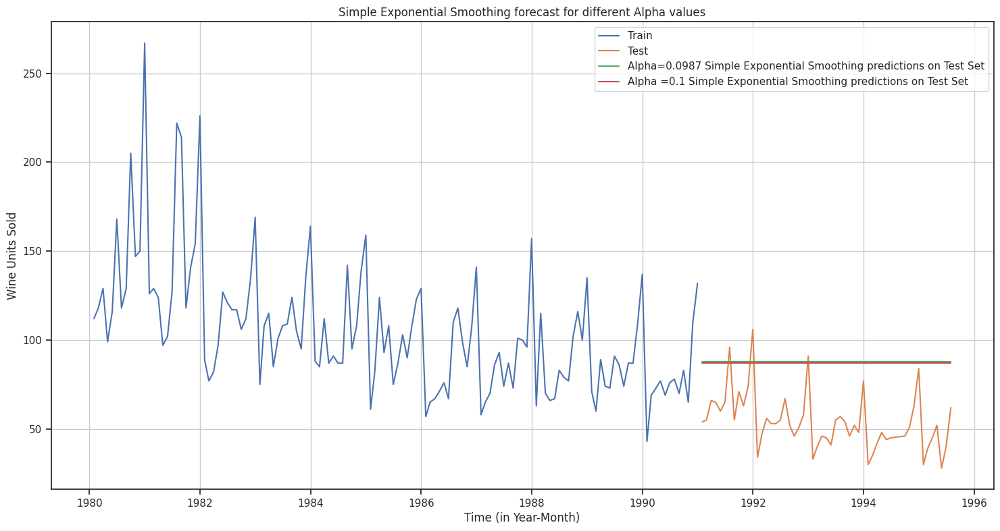

In [126]:
## Plotting on both the Training and Test data
model_SES_alpha_i = model_SES.fit(smoothing_level=0.1,optimized=False,use_brute=True)
SES_train['predict',0.1] = model_SES_alpha_i.fittedvalues
SES_test['predict',0.1] = model_SES_alpha_i.forecast(steps=len(test))

plt.figure(figsize=(18,9))
plt.plot(SES_train['Rose_Wine_Sales'], label='Train')
plt.plot(SES_test['Rose_Wine_Sales'], label='Test')

plt.plot(SES_test['predict'], label='Alpha=0.0987 Simple Exponential Smoothing predictions on Test Set')

plt.plot(SES_test['predict',0.1], label='Alpha =0.1 Simple Exponential Smoothing predictions on Test Set')

plt.legend(loc='best')
plt.title('Simple Exponential Smoothing forecast for different Alpha values')
plt.xlabel('Time (in Year-Month)')
plt.ylabel('Wine Units Sold')
plt.grid();

## Method 6: Double Exponential Smoothing (Holt's Model)

### Two parameters $\alpha$ and $\beta$ are estimated in this model. Level and Trend are accounted for in this model.

In [127]:
DES_train = train.copy()
DES_test = test.copy()

In [128]:
# Initializing the Double Exponential Smoothing Model
model_DES = Holt(DES_train,initialization_method='estimated')
# Fitting the model
model_DES = model_DES.fit()

In [129]:
model_DES.params

{'smoothing_level': np.float64(1.4901161193847656e-08),
 'smoothing_trend': np.float64(5.448169774560283e-09),
 'smoothing_seasonal': np.float64(nan),
 'damping_trend': nan,
 'initial_level': np.float64(137.81762949544608),
 'initial_trend': np.float64(-0.4943507283995123),
 'initial_seasons': array([], dtype=float64),
 'use_boxcox': False,
 'lamda': None,
 'remove_bias': False}

In [130]:
# Forecasting using this model for the test set
DES_test['predict'] =  model_DES.forecast(len(test))
DES_test['predict']

,predict
Time_Stamp,
1991-01-31,72.068983
1991-02-28,71.574632
1991-03-31,71.080281
1991-04-30,70.585930
1991-05-31,70.091580
1991-06-30,69.597229
1991-07-31,69.102878
1991-08-31,68.608528
1991-09-30,68.114177


Text(0, 0.5, 'Wine Units Sold')

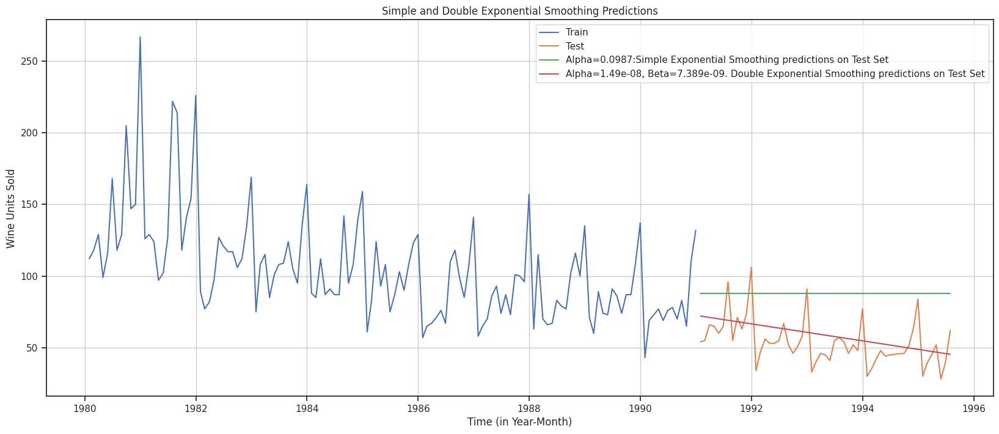

In [131]:
## Plotting the Training data, Test data and the forecasted values

plt.plot(DES_train, label='Train')
plt.plot(DES_test['Rose_Wine_Sales'], label='Test')

plt.plot(SES_test['predict'], label='Alpha=0.0987:Simple Exponential Smoothing predictions on Test Set')
plt.plot(DES_test['predict'], label='Alpha=1.49e-08, Beta=7.389e-09. Double Exponential Smoothing predictions on Test Set')

plt.legend(loc='best')
plt.grid()
plt.title('Simple and Double Exponential Smoothing Predictions');
plt.xlabel('Time (in Year-Month)')
plt.ylabel('Wine Units Sold')

### Model Evaluation - Double Exponential Smoothing(Holt's Model)

In [134]:
# Remove the 'squared' argument and take the square root to get RMSE
rmse_DES_test = metrics.mean_squared_error(DES_test['Rose_Wine_Sales'],DES_test['predict']) ** 0.5
print("For DES forecast on the Rose Testing Data:  RMSE is %3.3f" %(rmse_DES_test))

For DES forecast on the Rose Testing Data:  RMSE is 15.271


In [135]:
resultsDf_6 = pd.DataFrame({'Test RMSE': [rmse_DES_test]},index=['Alpha=1.49e-08, Beta=7.389e-09, Double Exponential Smoothing'])

resultsDf = pd.concat([resultsDf, resultsDf_6])
resultsDf

,Test RMSE
Linear Regression,15.268887
Naive Model,79.718576
Simple Average,53.460367
Simple Average,53.460367
2 point TMA,11.529278
4 point TMA,14.451376
6 point TMA,14.566262
9 point TMA,14.727596
"Alpha=0.0987,SimpleExponentialSmoothing",37.592007
"Alpha=1.49e-08, Beta=7.389e-09, Double Exponential Smoothing",15.270901


In [136]:
## First we will define an empty dataframe to store our values from the loop

resultsDf_6 = pd.DataFrame({'Alpha':[],'Beta':[],'Train RMSE':[],'Test RMSE': []})
resultsDf_6

,Alpha,Beta,Train RMSE,Test RMSE


In [140]:
model_DES = Holt(DES_train['Rose_Wine_Sales'])
for i in np.arange(0.05,1.05,0.05):
    for j in np.arange(0.05,1.05,0.05):
        model_DES_alpha_i_j = model_DES.fit(smoothing_level=i,smoothing_trend=j,optimized=False,use_brute=True)
        DES_train['predict',i,j] = model_DES_alpha_i_j.fittedvalues
        DES_test['predict',i,j] = model_DES_alpha_i_j.forecast(len(test))

        rmse_model6_train = metrics.mean_squared_error(DES_train['Rose_Wine_Sales'],DES_train['predict',i,j]) ** 0.5 # Taking the square root to get RMSE
        rmse_model6_test = metrics.mean_squared_error(DES_test['Rose_Wine_Sales'],DES_test['predict',i,j]) ** 0.5 # Taking the square root to get RMSE

        # Instead of append, use concat to add a new row to resultsDf_6
        resultsDf_6 = pd.concat([resultsDf_6, pd.DataFrame({'Alpha': [i], 'Beta': [j], 'Train RMSE': [rmse_model6_train], 'Test RMSE': [rmse_model6_test]})], ignore_index=True)

In [141]:
resultsDf_6

,Alpha,Beta,Train RMSE,Test RMSE
0,0.05,0.05,49.734056,31.526698
1,0.05,0.10,42.089518,34.791118
2,0.05,0.15,39.106563,23.716787
3,0.05,0.20,37.692373,37.795273
4,0.05,0.25,37.009649,33.598305
...,...,...,...,...
795,1.00,0.80,57.365879,853.965294
796,1.00,0.85,58.887365,848.483242
797,1.00,0.90,60.474309,834.710693
798,1.00,0.95,62.133606,812.112707


In [142]:
resultsDf_6.sort_values(by=['Test RMSE']).head()

,Alpha,Beta,Train RMSE,Test RMSE
6,0.05,0.35,36.233997,16.328994
406,0.05,0.35,36.233997,16.328994
405,0.05,0.30,36.616877,18.624520
5,0.05,0.30,36.616877,18.624520
2,0.05,0.15,39.106563,23.716787


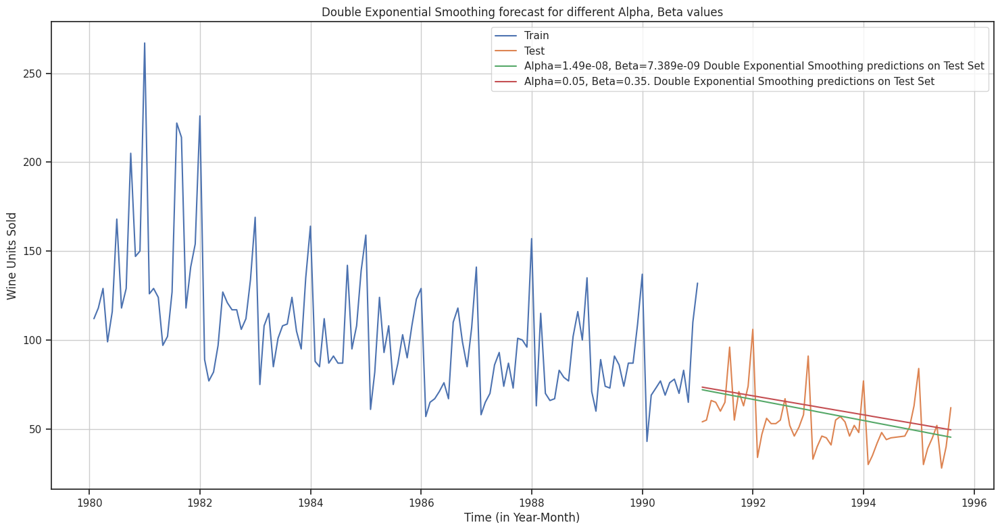

In [143]:
## Plotting on both the Training and Test data
model_DES_alpha_i_j = model_DES.fit(smoothing_level=0.05,smoothing_trend=0.35,optimized=False,use_brute=True)
DES_train['predict',0.05,0.35] = model_DES_alpha_i_j.fittedvalues
DES_test['predict',0.05,0.35] = model_DES_alpha_i_j.forecast(len(test))

plt.figure(figsize=(18,9))
plt.plot(DES_train['Rose_Wine_Sales'], label='Train')
plt.plot(DES_test['Rose_Wine_Sales'], label='Test')

plt.plot(DES_test['predict'], label='Alpha=1.49e-08, Beta=7.389e-09 Double Exponential Smoothing predictions on Test Set')

plt.plot(DES_test['predict',0.05,0.35], label='Alpha=0.05, Beta=0.35. Double Exponential Smoothing predictions on Test Set')

plt.legend(loc='best')
plt.title('Double Exponential Smoothing forecast for different Alpha, Beta values')
plt.xlabel('Time (in Year-Month)')
plt.ylabel('Wine Units Sold')
plt.grid();

## Method 7: Triple Exponential Smoothing (Holt - Winter's Model)

##### Three parameters $\alpha$, $\beta$ and $\gamma$ are estimated in this model. Level, Trend and Seasonality are accounted for in this model.

In [144]:
TES_train = train.copy()
TES_test = test.copy()

In [145]:
model_TES = ExponentialSmoothing(TES_train['Rose_Wine_Sales'],trend='additive',seasonal='multiplicative',freq='M')

In [146]:
model_TES_autofit = model_TES.fit()

The above fit of the model is by the best parameters that Python thinks for the model. It uses a brute force method to choose the parameters.

In [147]:
model_TES_autofit.params

{'smoothing_level': np.float64(0.07736040004765096),
 'smoothing_trend': np.float64(0.03936496779735522),
 'smoothing_seasonal': np.float64(0.0008375039104357999),
 'damping_trend': nan,
 'initial_level': np.float64(156.90674503596637),
 'initial_trend': np.float64(-0.9061396720042346),
 'initial_seasons': array([0.7142168 , 0.80982439, 0.88543128, 0.77363782, 0.87046319,
        0.94699283, 1.04196135, 1.11012703, 1.04835489, 1.0276963 ,
        1.19783562, 1.6514144 ]),
 'use_boxcox': False,
 'lamda': None,
 'remove_bias': False}

In [148]:
## Prediction on the test data

TES_test['auto_predict'] = model_TES_autofit.forecast(steps=len(test))
TES_test.head()

,Rose_Wine_Sales,auto_predict
Time_Stamp,,
1991-01-31,54.0,55.942246
1991-02-28,55.0,63.240624
1991-03-31,66.0,68.899674
1991-04-30,65.0,60.007486
1991-05-31,60.0,67.257150


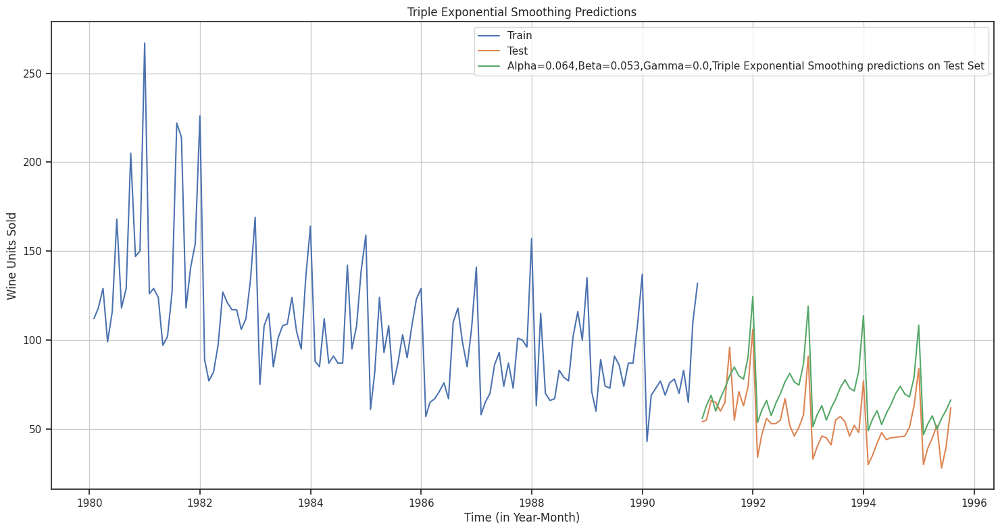

In [149]:
## Plotting on both the Training and Test using autofit

plt.figure(figsize=(18,9))
plt.plot(TES_train['Rose_Wine_Sales'], label='Train')
plt.plot(TES_test['Rose_Wine_Sales'], label='Test')

plt.plot(TES_test['auto_predict'], label='Alpha=0.064,Beta=0.053,Gamma=0.0,Triple Exponential Smoothing predictions on Test Set')


plt.legend(loc='best')
plt.title('Triple Exponential Smoothing Predictions');
plt.xlabel('Time (in Year-Month)')
plt.ylabel('Wine Units Sold')
plt.grid();

In [151]:
rmse_tes_test = metrics.mean_squared_error(TES_test['Rose_Wine_Sales'],TES_test['auto_predict']) ** 0.5  # Remove the 'squared' argument and take the square root to get RMSE
print("For Alpha=0.064,Beta=0.053,Gamma=0.0, Triple Exponential Smoothing Model forecast on the Test Data,  RMSE is %3.3f" %(rmse_tes_test))

For Alpha=0.064,Beta=0.053,Gamma=0.0, Triple Exponential Smoothing Model forecast on the Test Data,  RMSE is 19.113


In [152]:
resultsDf_7 = pd.DataFrame({'Test RMSE': [rmse_tes_test]}
                           ,index=['Alpha=0.064,Beta=0.053,Gamma=0.0,Triple Exponential Smoothing'])

resultsDf = pd.concat([resultsDf, resultsDf_7])
resultsDf

,Test RMSE
Linear Regression,15.268887
Naive Model,79.718576
Simple Average,53.460367
Simple Average,53.460367
2 point TMA,11.529278
4 point TMA,14.451376
6 point TMA,14.566262
9 point TMA,14.727596
"Alpha=0.0987,SimpleExponentialSmoothing",37.592007
"Alpha=1.49e-08, Beta=7.389e-09, Double Exponential Smoothing",15.270901


Calculating the performance metrics for different values of alpha, beta and gamma

In [153]:
## First we will define an empty dataframe to store our values from the loop

resultsDf_8_2 = pd.DataFrame({'Alpha':[],'Beta':[],'Gamma':[],'Train RMSE':[],'Test RMSE': []})
resultsDf_8_2

,Alpha,Beta,Gamma,Train RMSE,Test RMSE


In [155]:
for i in np.arange(0.1, 1.05, 0.05):
    for j in np.arange(0.1, 1.05, 0.05):
        for k in np.arange(0.1, 1.05, 0.05):
            model_TES_alpha_i_j_k = model_TES.fit(smoothing_level=i, smoothing_trend=j, smoothing_seasonal=k, optimized=False, use_brute=True)
            TES_train['predict', i, j, k] = model_TES_alpha_i_j_k.fittedvalues
            TES_test['predict', i, j, k] = model_TES_alpha_i_j_k.forecast(steps=len(test))

            # Calculate MSE and then take the square root to get RMSE
            rmse_model8_train = metrics.mean_squared_error(TES_train['Rose_Wine_Sales'], TES_train['predict', i, j, k]) ** 0.5
            rmse_model8_test = metrics.mean_squared_error(TES_test['Rose_Wine_Sales'], TES_test['predict', i, j, k]) ** 0.5

            # Use concat instead of append to avoid the warning
            resultsDf_8_2 = pd.concat([resultsDf_8_2, pd.DataFrame({'Alpha': [i], 'Beta': [j], 'Gamma': [k], 'Train RMSE': [rmse_model8_train], 'Test RMSE': [rmse_model8_test]})], ignore_index=True)

In [ ]:
resultsDf_8_2

In [156]:
resultsDf_8_2.sort_values(by=['Test RMSE']).head()

,Alpha,Beta,Gamma,Train RMSE,Test RMSE
38,0.1,0.20,0.10,19.770392,9.223385
19,0.1,0.15,0.10,19.647564,9.280630
20,0.1,0.15,0.15,19.879642,9.313311
39,0.1,0.20,0.15,19.993053,9.337492
21,0.1,0.15,0.20,20.148043,9.406805


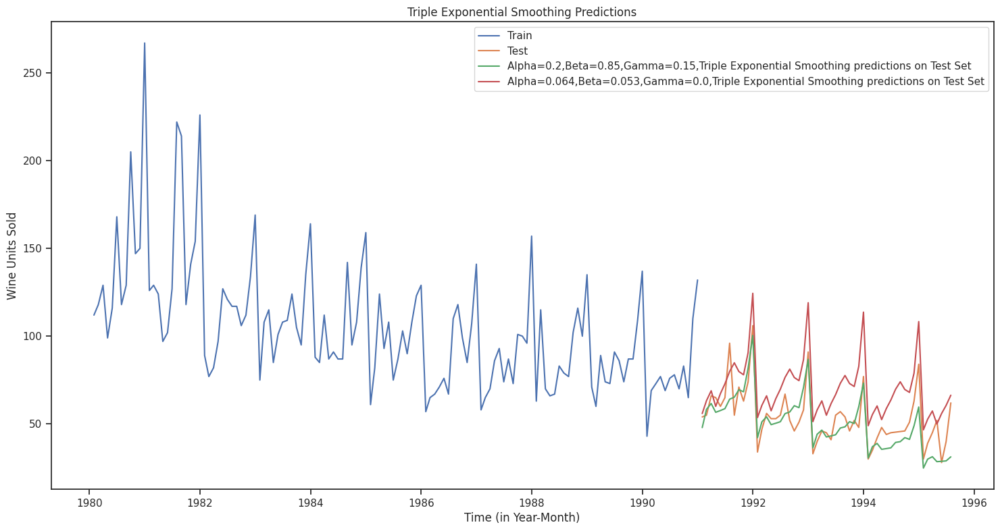

In [158]:
## Plotting on both the Training and Test data using brute force alpha, beta and gamma determination
model_TES_alpha_i_j_k = model_TES.fit(smoothing_level=0.2,smoothing_trend=0.85,smoothing_seasonal=0.15,optimized=False,use_brute=True)
TES_train['predict',0.2,0.85,0.15] = model_TES_alpha_i_j_k.fittedvalues
TES_test['predict',0.2,0.85,0.15] = model_TES_alpha_i_j_k.forecast(steps=len(test))
rmse_tes_test_lowest = metrics.mean_squared_error(TES_test['Rose_Wine_Sales'],TES_test['predict',0.2,0.85,0.15]) ** 0.5  # Remove the 'squared' argument and take the square root to get RMSE
plt.figure(figsize=(18,9))
plt.plot(TES_train['Rose_Wine_Sales'], label='Train')
plt.plot(TES_test['Rose_Wine_Sales'], label='Test')

#The value of alpha and beta is taken like that by python
plt.plot(TES_test['predict', 0.2,0.85,0.15], label='Alpha=0.2,Beta=0.85,Gamma=0.15,Triple Exponential Smoothing predictions on Test Set')

plt.plot(TES_test['auto_predict'], label='Alpha=0.064,Beta=0.053,Gamma=0.0,Triple Exponential Smoothing predictions on Test Set')

plt.legend(loc='best')
plt.title('Triple Exponential Smoothing Predictions');
plt.xlabel('Time (in Year-Month)')
plt.ylabel('Wine Units Sold')
plt.grid();
plt.grid();

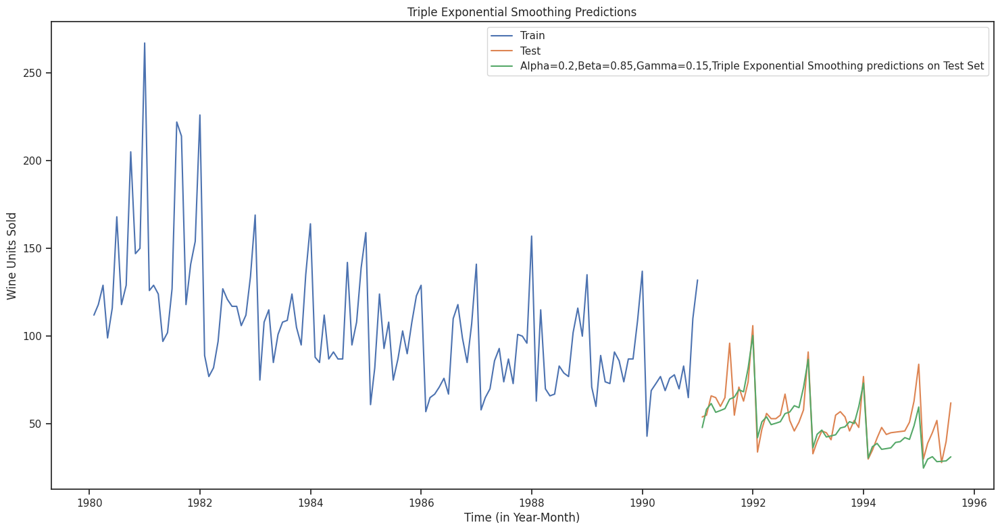

In [160]:
## Plotting on both the Training and Test data using brute force alpha, beta and gamma determination
model_TES_alpha_i_j_k = model_TES.fit(smoothing_level=0.2,smoothing_trend=0.85,smoothing_seasonal=0.15,optimized=False,use_brute=True)
TES_train['predict',0.2,0.85,0.15] = model_TES_alpha_i_j_k.fittedvalues
TES_test['predict',0.2,0.85,0.15] = model_TES_alpha_i_j_k.forecast(steps=len(test))

# Calculate RMSE by taking the square root of MSE
rmse_tes_test_lowest = metrics.mean_squared_error(TES_test['Rose_Wine_Sales'],TES_test['predict',0.2,0.85,0.15]) ** 0.5

plt.figure(figsize=(18,9))
plt.plot(TES_train['Rose_Wine_Sales'], label='Train')
plt.plot(TES_test['Rose_Wine_Sales'], label='Test')

#The value of alpha and beta is taken like that by python
plt.plot(TES_test['predict', 0.2,0.85,0.15], label='Alpha=0.2,Beta=0.85,Gamma=0.15,Triple Exponential Smoothing predictions on Test Set')

plt.legend(loc='best')
plt.title('Triple Exponential Smoothing Predictions');
plt.xlabel('Time (in Year-Month)')
plt.ylabel('Wine Units Sold')
plt.grid();
plt.grid();

In [161]:
resultsDf_8 = pd.DataFrame({'Test RMSE': [rmse_tes_test_lowest]}
                           ,index=['Alpha=0.2,Beta=0.85,Gamma=0.15,Triple Exponential Smoothing'])

resultsDf = pd.concat([resultsDf, resultsDf_8])
resultsDf

,Test RMSE
Linear Regression,15.268887
Naive Model,79.718576
Simple Average,53.460367
Simple Average,53.460367
2 point TMA,11.529278
4 point TMA,14.451376
6 point TMA,14.566262
9 point TMA,14.727596
"Alpha=0.0987,SimpleExponentialSmoothing",37.592007
"Alpha=1.49e-08, Beta=7.389e-09, Double Exponential Smoothing",15.270901


In [162]:
print('Sorted by RMSE values on the Test Data:','\n',)
resultsDf.sort_values(by=['Test RMSE'])

Sorted by RMSE values on the Test Data: 



,Test RMSE
"Alpha=0.2,Beta=0.85,Gamma=0.15,Triple Exponential Smoothing",10.279876
2 point TMA,11.529278
4 point TMA,14.451376
6 point TMA,14.566262
9 point TMA,14.727596
Linear Regression,15.268887
"Alpha=1.49e-08, Beta=7.389e-09, Double Exponential Smoothing",15.270901
"Alpha=0.064,Beta=0.053,Gamma=0.0,Triple Exponential Smoothing",19.112866
"Alpha=0.0987,SimpleExponentialSmoothing",37.592007
Simple Average,53.460367


For this data, we had both trend and seasonality so by definition Triple Exponential Smoothing is supposed to work better than the Simple Exponential Smoothing as well as the Double Exponential Smoothing. However, since this was a model building exercise we had gone on to build different models on the data and have compared these model with the best RMSE value on the test data.

### We see that the best model is the Triple Exponential Smoothing with multiplicative seasonality with the parameters $\alpha$ = 0.2, $\beta$ = 0.85 and $\gamma$ = 0.15.

Text(0, 0.5, 'Wine Units Sold')

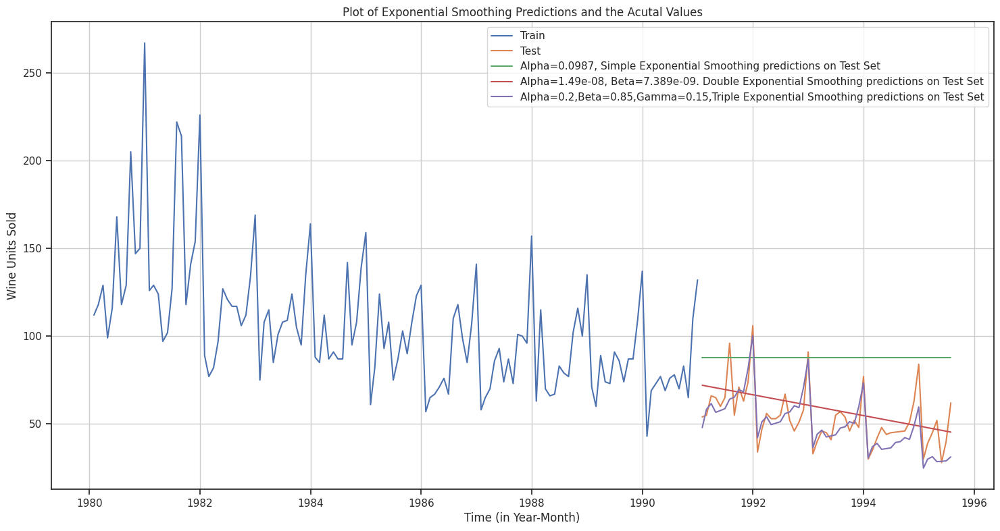

In [163]:
## Plotting on both the Training and Test data

plt.figure(figsize=(18,9))
plt.plot(train['Rose_Wine_Sales'], label='Train')
plt.plot(test['Rose_Wine_Sales'], label='Test')

plt.plot(SES_test['predict'], label='Alpha=0.0987, Simple Exponential Smoothing predictions on Test Set')

plt.plot(DES_test['predict'], label='Alpha=1.49e-08, Beta=7.389e-09. Double Exponential Smoothing predictions on Test Set')

plt.plot(TES_test['predict', 0.2,0.85,0.15], label='Alpha=0.2,Beta=0.85,Gamma=0.15,Triple Exponential Smoothing predictions on Test Set')

plt.legend(loc='best')
plt.grid();
plt.title('Plot of Exponential Smoothing Predictions and the Acutal Values');
plt.xlabel('Time (in Year-Month)')
plt.ylabel('Wine Units Sold')

## 5. Check for the stationarity of the data on which the model is being built on using appropriate statistical tests and also mention the hypothesis for the statistical test. If the data is found to be non-stationary, take appropriate steps to make it stationary. Check the new data for stationarity and comment. Note: Stationarity should be checked at alpha = 0.05.

### Check for stationarity of the whole Time Series data.

The Augmented Dickey-Fuller test is an unit root test which determines whether there is a unit root and subsequently whether the series is non-stationary.

The hypothesis in a simple form for the ADF test is:
* $H_0$ : The Time Series has a unit root and is thus non-stationary.
* $H_1$ : The Time Series does not have a unit root and is thus stationary.

We would want the series to be stationary for building ARIMA models and thus we would want the p-value of this test to be less than the $\alpha$ value.

In [164]:
from statsmodels.tsa.stattools import adfuller

In [165]:
print('Results of Dicky-Fuller Test')
dftest = adfuller(df,regression='ct')
print('DF test statistic is %3.3f' %dftest[0])
print('DF test p-value is' ,dftest[1])
print('Number of lags used' ,dftest[2])

Results of Dicky-Fuller Test
DF test statistic is -2.240
DF test p-value is 0.46713505298059127
Number of lags used 13


We see that at 5% significant level the Time Series is non-stationary.Let us take one level of differencing to see whether the series becomes stationary.

In [166]:
print('Results of Dicky-Fuller Test with differencing')
dftest = adfuller(df.diff().dropna(),regression='ct')
print('DF test statistic is %3.3f' %dftest[0])
print('DF test p-value is' ,dftest[1])
print('Number of lags used' ,dftest[2])

Results of Dicky-Fuller Test with differencing
DF test statistic is -8.162
DF test p-value is 3.0158926765633234e-11
Number of lags used 12


Now, let us go ahead and plot the stationary series.

Text(0.5, 0, 'Time (in Year-Month)')

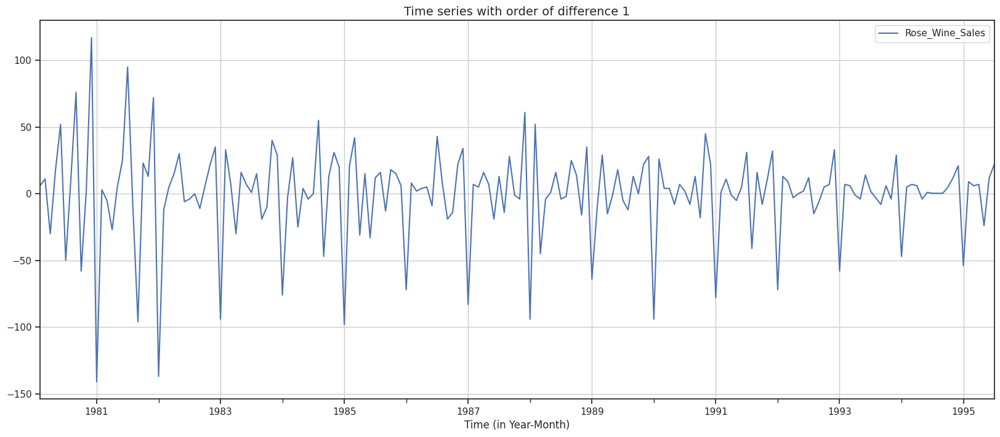

In [167]:
df.diff().dropna().plot(grid=True);
plt.title('Time series with order of difference 1', fontsize=14)
plt.xlabel('Time (in Year-Month)')

### Plot the Autocorrelation and the Partial Autocorrelation function plots on the whole data.

### ACF plot

Text(0, 0.5, 'Correlation')

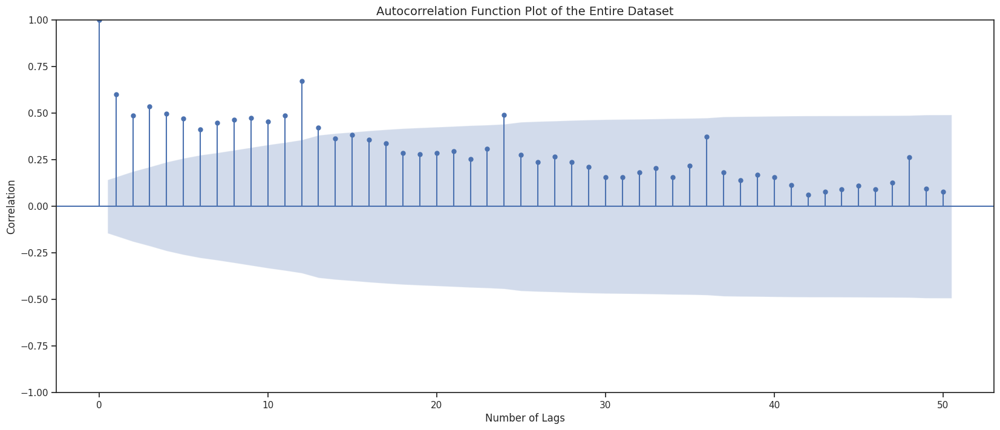

In [168]:
plot_acf(df,alpha=0.05,lags=50);
plt.title('Autocorrelation Function Plot of the Entire Dataset', fontsize=14)
plt.xlabel('Number of Lags')
plt.ylabel('Correlation')

Text(0, 0.5, 'Correlation')

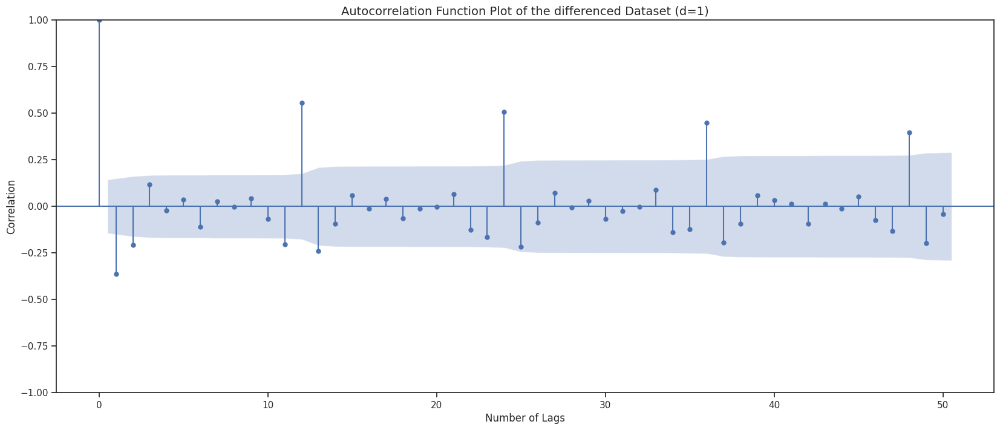

In [169]:
plot_acf(df.diff().dropna(),alpha=0.05,lags=50);
plt.title('Autocorrelation Function Plot of the differenced Dataset (d=1)', fontsize=14)
plt.xlabel('Number of Lags')
plt.ylabel('Correlation')

### PACF plot

Text(0, 0.5, 'Correlation')

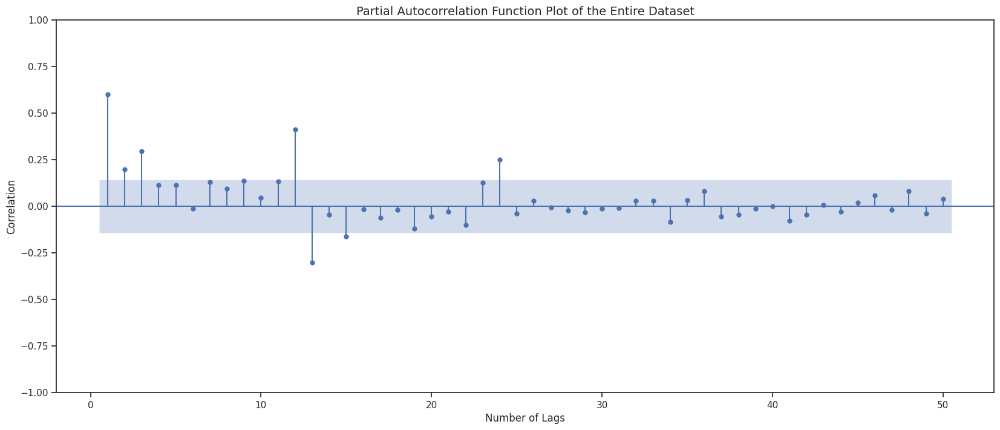

In [170]:
plot_pacf(df,zero=False,alpha=0.05,lags=50);
plt.title('Partial Autocorrelation Function Plot of the Entire Dataset', fontsize=14)
plt.xlabel('Number of Lags')
plt.ylabel('Correlation')

Text(0, 0.5, 'Correlation')

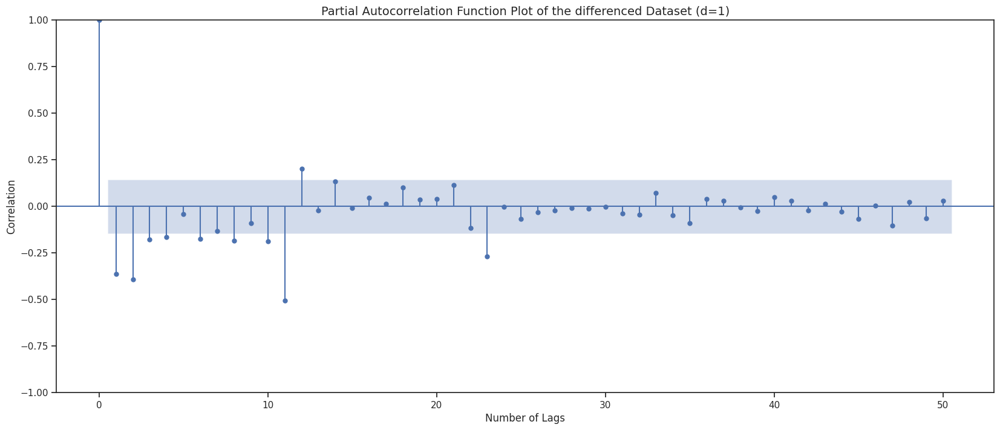

In [171]:
plot_pacf(df.diff().dropna(),alpha=0.05,lags=50);
plt.title('Partial Autocorrelation Function Plot of the differenced Dataset (d=1)', fontsize=14)
plt.xlabel('Number of Lags')
plt.ylabel('Correlation')

From the above plots, we can say that there seems to be a seasonality in the data.

In [172]:
print('First few rows of Training Data')
display(train.head())
print('Last few rows of Training Data')
display(train.tail())
print('First few rows of Test Data')
display(test.head())
print('Last few rows of Test Data')
display(test.tail())

First few rows of Training Data


,Rose_Wine_Sales
Time_Stamp,
1980-01-31,112.0
1980-02-29,118.0
1980-03-31,129.0
1980-04-30,99.0
1980-05-31,116.0


Last few rows of Training Data


,Rose_Wine_Sales
Time_Stamp,
1990-08-31,70.0
1990-09-30,83.0
1990-10-31,65.0
1990-11-30,110.0
1990-12-31,132.0


First few rows of Test Data


,Rose_Wine_Sales
Time_Stamp,
1991-01-31,54.0
1991-02-28,55.0
1991-03-31,66.0
1991-04-30,65.0
1991-05-31,60.0


Last few rows of Test Data


,Rose_Wine_Sales
Time_Stamp,
1995-03-31,45.0
1995-04-30,52.0
1995-05-31,28.0
1995-06-30,40.0
1995-07-31,62.0


### Check for stationarity of the Training Data Time Series.

Let us plot the training data once.

Text(0, 0.5, 'Wine units sold')

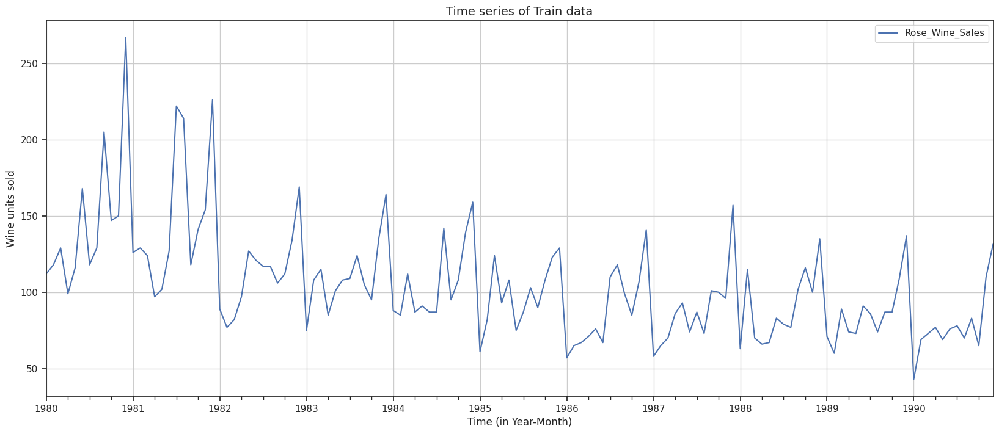

In [173]:
train.plot(grid=True);
plt.title('Time series of Train data', fontsize=14)
plt.xlabel('Time (in Year-Month)')
plt.ylabel('Wine units sold')

In [174]:
print('Results of Dicky-Fuller Test on Train data')
dftest = adfuller(train,regression='ct')
print('DF test statistic is %3.3f' %dftest[0])
print('DF test p-value is' ,dftest[1])
print('Number of lags used' ,dftest[2])

Results of Dicky-Fuller Test on Train data
DF test statistic is -1.686
DF test p-value is 0.7569093051047069
Number of lags used 13


The training data is non-stationary at 95% confidence level. Let us take a first level of differencing to stationarize the Time Series.

In [175]:
print('Results of Dicky-Fuller Test on Train data with differencing')
dftest = adfuller(train.diff().dropna(),regression='ct')
print('DF test statistic is %3.3f' %dftest[0])
print('DF test p-value is' ,dftest[1])
print('Number of lags used' ,dftest[2])

Results of Dicky-Fuller Test on Train data with differencing
DF test statistic is -6.804
DF test p-value is 3.894831356782642e-08
Number of lags used 12


Now, let us go ahead and plot the differenced training data.

Text(0, 0.5, 'Wine units sold')

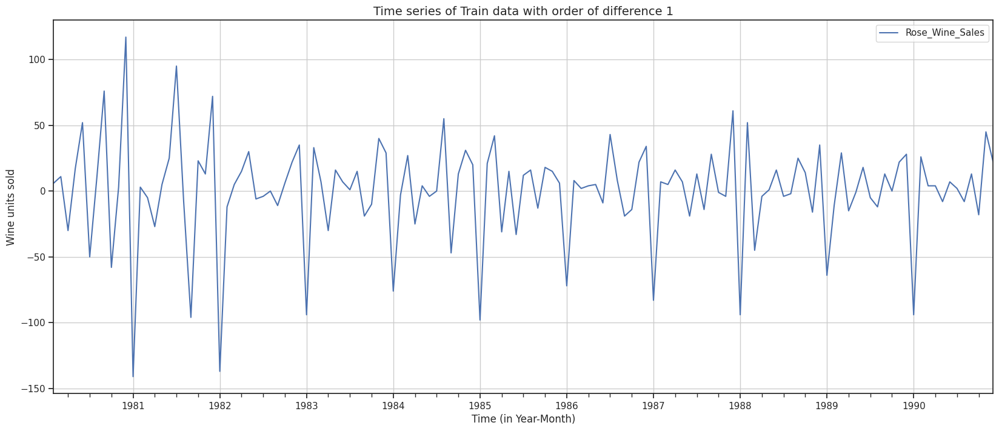

In [176]:
train.diff().dropna().plot(grid=True);
plt.title('Time series of Train data with order of difference 1', fontsize=14)
plt.xlabel('Time (in Year-Month)')
plt.ylabel('Wine units sold')

In [177]:
train.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 132 entries, 1980-01-31 to 1990-12-31
Data columns (total 1 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Rose_Wine_Sales  132 non-null    float64
dtypes: float64(1)
memory usage: 2.1 KB


## 6. Build an automated version of the ARIMA/SARIMA model in which the parameters are selected using the lowest Akaike Information Criteria (AIC) on the training data and evaluate this model on the test data using RMSE.

### ARIMA Model

In [178]:
## The following loop helps us in getting a combination of different parameters of p and q in the range of 0 and 5
## We have kept the value of d as 1 as we need to take a difference of the series to make it stationary.

import itertools
p = q = range(0, 5)
d= range(1,2)
pdq = list(itertools.product(p, d, q))
print('Examples of the parameter combinations for the Model')
for i in range(0,len(pdq)):
    print('Model: {}'.format(pdq[i]))

Examples of the parameter combinations for the Model
Model: (0, 1, 0)
Model: (0, 1, 1)
Model: (0, 1, 2)
Model: (0, 1, 3)
Model: (0, 1, 4)
Model: (1, 1, 0)
Model: (1, 1, 1)
Model: (1, 1, 2)
Model: (1, 1, 3)
Model: (1, 1, 4)
Model: (2, 1, 0)
Model: (2, 1, 1)
Model: (2, 1, 2)
Model: (2, 1, 3)
Model: (2, 1, 4)
Model: (3, 1, 0)
Model: (3, 1, 1)
Model: (3, 1, 2)
Model: (3, 1, 3)
Model: (3, 1, 4)
Model: (4, 1, 0)
Model: (4, 1, 1)
Model: (4, 1, 2)
Model: (4, 1, 3)
Model: (4, 1, 4)


In [179]:
# Creating an empty Dataframe with column names only
ARIMA_AIC = pd.DataFrame(columns=['param', 'AIC'])
ARIMA_AIC

,param,AIC


In [181]:
from statsmodels.tsa.arima.model import ARIMA

for param in pdq:# running a loop within the pdq parameters defined by itertools
    ARIMA_model = ARIMA(train['Rose_Wine_Sales'].values,order=param).fit()#fitting the ARIMA model
    #using the parameters from the loop
    print('ARIMA{} - AIC:{}'.format(param,ARIMA_model.aic))#printing the parameters and the AIC
    #from the fitted models
    # Instead of append, use concat to add a new row to ARIMA_AIC
    ARIMA_AIC = pd.concat([ARIMA_AIC, pd.DataFrame({'param': [param], 'AIC': [ARIMA_model.aic]})], ignore_index=True)
    #appending the AIC values and the model parameters to the previously created data frame
    #for easier understanding and sorting of the AIC values

ARIMA(0, 1, 0) - AIC:1333.1546729124348
ARIMA(0, 1, 1) - AIC:1282.309831974831
ARIMA(0, 1, 2) - AIC:1279.6715288535768
ARIMA(0, 1, 3) - AIC:1280.5453761734657
ARIMA(0, 1, 4) - AIC:1281.6766982143947
ARIMA(1, 1, 0) - AIC:1317.350310538146
ARIMA(1, 1, 1) - AIC:1280.5742295380066
ARIMA(1, 1, 2) - AIC:1279.8707234231927
ARIMA(1, 1, 3) - AIC:1281.870722330997
ARIMA(1, 1, 4) - AIC:1279.6052628202858
ARIMA(2, 1, 0) - AIC:1298.6110341604967
ARIMA(2, 1, 1) - AIC:1281.507862186856
ARIMA(2, 1, 2) - AIC:1281.8707222264661
ARIMA(2, 1, 3) - AIC:1274.6948343352535
ARIMA(2, 1, 4) - AIC:1278.7690096450388
ARIMA(3, 1, 0) - AIC:1297.4810917271684
ARIMA(3, 1, 1) - AIC:1282.419277627198
ARIMA(3, 1, 2) - AIC:1283.720740597713
ARIMA(3, 1, 3) - AIC:1278.6670248711753
ARIMA(3, 1, 4) - AIC:1287.7190768609312
ARIMA(4, 1, 0) - AIC:1296.3266569004463
ARIMA(4, 1, 1) - AIC:1283.7931715123077
ARIMA(4, 1, 2) - AIC:1285.7182485632707
ARIMA(4, 1, 3) - AIC:1278.4514096395753
ARIMA(4, 1, 4) - AIC:1282.3371724386477


In [182]:
## Sort the above AIC values in the ascending order to get the parameters for the minimum AIC value

ARIMA_AIC.sort_values(by='AIC',ascending=True).head()

,param,AIC
13,"(2, 1, 3)",1274.694834
23,"(4, 1, 3)",1278.451410
18,"(3, 1, 3)",1278.667025
14,"(2, 1, 4)",1278.769010
9,"(1, 1, 4)",1279.605263


In [183]:
auto_ARIMA = ARIMA(train, order=(2,1,3))

results_auto_ARIMA = auto_ARIMA.fit()

print(results_auto_ARIMA.summary())

                               SARIMAX Results                                
Dep. Variable:        Rose_Wine_Sales   No. Observations:                  132
Model:                 ARIMA(2, 1, 3)   Log Likelihood                -631.347
Date:                Sat, 03 May 2025   AIC                           1274.695
Time:                        07:28:58   BIC                           1291.946
Sample:                    01-31-1980   HQIC                          1281.705
                         - 12-31-1990                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -1.6781      0.084    -20.030      0.000      -1.842      -1.514
ar.L2         -0.7289      0.084     -8.700      0.000      -0.893      -0.565
ma.L1          1.0451      0.711      1.469      0.1

#### Diagnostics plot

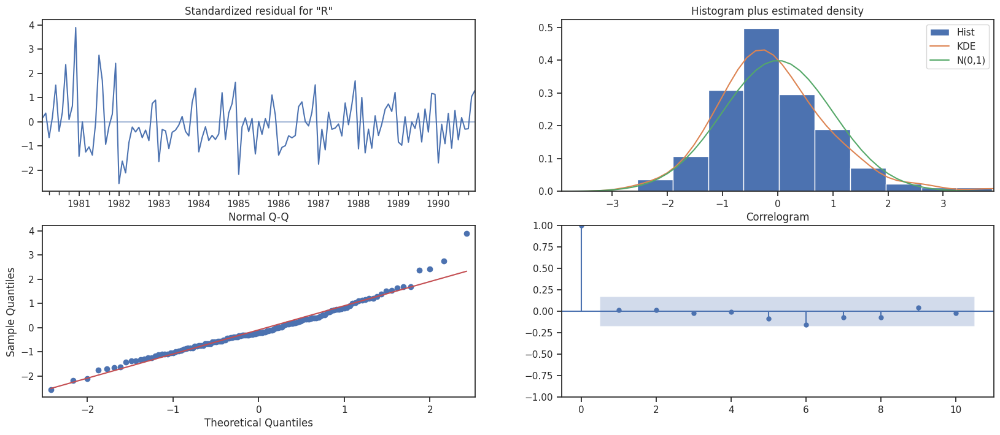

In [184]:
results_auto_ARIMA.plot_diagnostics();

#### Predict on the Test Set using this model and evaluate the model.

In [185]:
predicted_auto_ARIMA = results_auto_ARIMA.forecast(steps=len(test))

In [186]:
predicted_auto_ARIMA

,predicted_mean
1991-01-31,85.613847
1991-02-28,90.532741
1991-03-31,81.974943
1991-04-30,92.750692
1991-05-31,80.905322
1991-06-30,92.928994
1991-07-31,81.385754
1991-08-31,91.992800
1991-09-30,82.606626
1991-10-31,90.626406


Text(0, 0.5, 'Wine Units Sold')

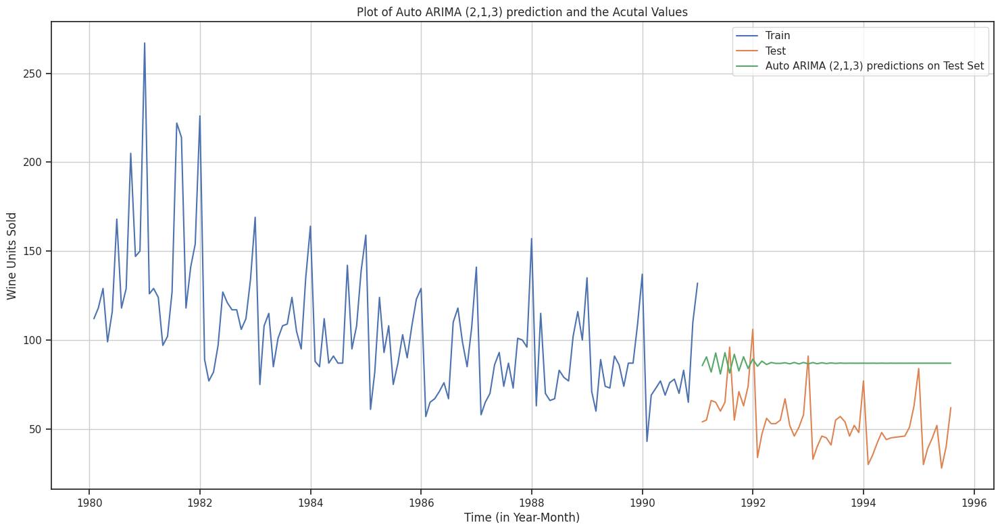

In [187]:
## Plotting on both the Training and Test data

plt.figure(figsize=(18,9))
plt.plot(train['Rose_Wine_Sales'], label='Train')
plt.plot(test['Rose_Wine_Sales'], label='Test')

plt.plot(predicted_auto_ARIMA, label='Auto ARIMA (2,1,3) predictions on Test Set')

plt.legend(loc='best')
plt.grid();
plt.title('Plot of Auto ARIMA (2,1,3) prediction and the Acutal Values');
plt.xlabel('Time (in Year-Month)')
plt.ylabel('Wine Units Sold')

In [188]:
## Mean Absolute Percentage Error (MAPE) - Function Definition

def mean_absolute_percentage_error(y_true, y_pred):
    return np.mean((np.abs(y_true-y_pred))/(y_true))*100

## Importing the mean_squared_error function from sklearn to calculate the RMSE

from sklearn.metrics import mean_squared_error

In [190]:
rmse = mean_squared_error(test['Rose_Wine_Sales'],predicted_auto_ARIMA) ** 0.5 # Remove the 'squared' argument and take the square root to get RMSE
mape = mean_absolute_percentage_error(test['Rose_Wine_Sales'],predicted_auto_ARIMA)
print('RMSE:',rmse,'\nMAPE:',mape)

RMSE: 36.8169146419244 
MAPE: 75.84685520971229


In [191]:
resultsDf_2 = pd.DataFrame({'Test RMSE': rmse,'MAPE':mape}
                           ,index=['Auto ARIMA (2,1,3)'])

resultsDf_2

,Test RMSE,MAPE
"Auto ARIMA (2,1,3)",36.816915,75.846855


### SARIMA Model

Let us look at the ACF plot once more to understand the seasonal parameter for the SARIMA model.

Text(0, 0.5, 'Correlation')

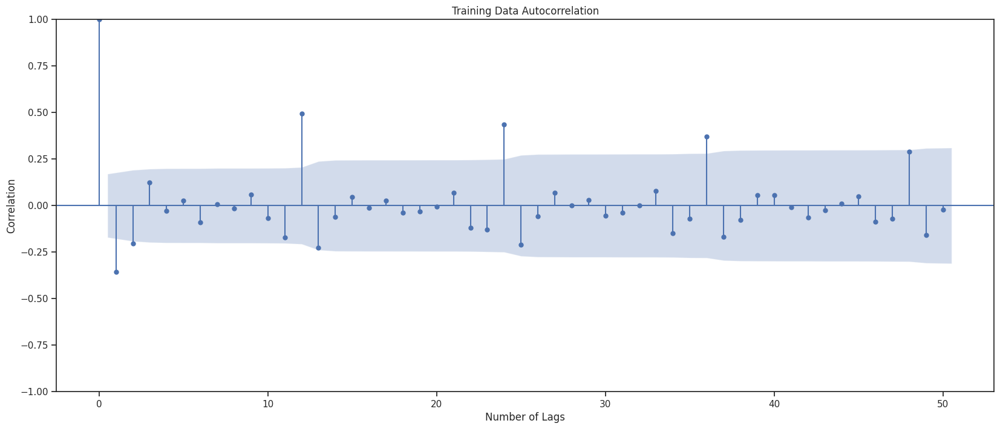

In [192]:
plot_acf(train.diff(),title='Training Data Autocorrelation',missing='drop',lags=50);
plt.xlabel('Number of Lags')
plt.ylabel('Correlation')

We can see that there is a seasonality.

In [193]:
import itertools
p = q = range(0, 4)
d= range(1,2)
D = range(0,1)
pdq = list(itertools.product(p, d, q))
PDQ = [(x[0], x[1], x[2], 12) for x in list(itertools.product(p, D, q))]
print('Examples of the parameter combinations for the Model are')
for i in range(1,len(pdq)):
    print('Model: {}{}'.format(pdq[i], PDQ[i]))

Examples of the parameter combinations for the Model are
Model: (0, 1, 1)(0, 0, 1, 12)
Model: (0, 1, 2)(0, 0, 2, 12)
Model: (0, 1, 3)(0, 0, 3, 12)
Model: (1, 1, 0)(1, 0, 0, 12)
Model: (1, 1, 1)(1, 0, 1, 12)
Model: (1, 1, 2)(1, 0, 2, 12)
Model: (1, 1, 3)(1, 0, 3, 12)
Model: (2, 1, 0)(2, 0, 0, 12)
Model: (2, 1, 1)(2, 0, 1, 12)
Model: (2, 1, 2)(2, 0, 2, 12)
Model: (2, 1, 3)(2, 0, 3, 12)
Model: (3, 1, 0)(3, 0, 0, 12)
Model: (3, 1, 1)(3, 0, 1, 12)
Model: (3, 1, 2)(3, 0, 2, 12)
Model: (3, 1, 3)(3, 0, 3, 12)


In [194]:
SARIMA_AIC = pd.DataFrame(columns=['param','seasonal', 'AIC'])
SARIMA_AIC

,param,seasonal,AIC


In [196]:
import statsmodels.api as sm

for param in pdq:
    for param_seasonal in PDQ:
        SARIMA_model = sm.tsa.statespace.SARIMAX(train['Rose_Wine_Sales'].values,
                                            order=param,
                                            seasonal_order=param_seasonal,
                                            enforce_stationarity=False,
                                            enforce_invertibility=False)

        results_SARIMA = SARIMA_model.fit(maxiter=1000)
        print('SARIMA{}x{} - AIC:{}'.format(param, param_seasonal, results_SARIMA.aic))
        # Instead of append, use concat to add a new row to SARIMA_AIC
        SARIMA_AIC = pd.concat([SARIMA_AIC, pd.DataFrame([{'param':param,'seasonal':param_seasonal ,'AIC': results_SARIMA.aic}])], ignore_index=True)

SARIMA(0, 1, 0)x(0, 0, 0, 12) - AIC:1323.9657875279158
SARIMA(0, 1, 0)x(0, 0, 1, 12) - AIC:1145.4230827207366
SARIMA(0, 1, 0)x(0, 0, 2, 12) - AIC:976.4375296380903
SARIMA(0, 1, 0)x(0, 0, 3, 12) - AIC:3537.579168905919
SARIMA(0, 1, 0)x(1, 0, 0, 12) - AIC:1139.921738995602
SARIMA(0, 1, 0)x(1, 0, 1, 12) - AIC:1116.020786938629
SARIMA(0, 1, 0)x(1, 0, 2, 12) - AIC:969.6913635751788
SARIMA(0, 1, 0)x(1, 0, 3, 12) - AIC:4554.32909051064
SARIMA(0, 1, 0)x(2, 0, 0, 12) - AIC:960.8812220353041
SARIMA(0, 1, 0)x(2, 0, 1, 12) - AIC:962.8794540697559
SARIMA(0, 1, 0)x(2, 0, 2, 12) - AIC:955.5735408945628
SARIMA(0, 1, 0)x(2, 0, 3, 12) - AIC:4397.822817992214
SARIMA(0, 1, 0)x(3, 0, 0, 12) - AIC:850.7535403931095
SARIMA(0, 1, 0)x(3, 0, 1, 12) - AIC:851.7482702731063
SARIMA(0, 1, 0)x(3, 0, 2, 12) - AIC:850.5304136127919
SARIMA(0, 1, 0)x(3, 0, 3, 12) - AIC:3467.855628476979
SARIMA(0, 1, 1)x(0, 0, 0, 12) - AIC:1263.5369097383966
SARIMA(0, 1, 1)x(0, 0, 1, 12) - AIC:1098.5554825918332
SARIMA(0, 1, 1)x(0, 0, 2,

In [197]:
SARIMA_AIC.sort_values(by=['AIC']).head()

,param,seasonal,AIC
222,"(3, 1, 1)","(3, 0, 2, 12)",774.400286
238,"(3, 1, 2)","(3, 0, 2, 12)",774.880937
220,"(3, 1, 1)","(3, 0, 0, 12)",775.426699
221,"(3, 1, 1)","(3, 0, 1, 12)",775.495330
252,"(3, 1, 3)","(3, 0, 0, 12)",775.561018


In [198]:
import statsmodels.api as sm

auto_SARIMA = sm.tsa.statespace.SARIMAX(train['Rose_Wine_Sales'],
                                order=(3,1,1),
                                seasonal_order=(3, 0, 2, 12),
                                enforce_stationarity=False,
                                enforce_invertibility=False)
results_auto_SARIMA = auto_SARIMA.fit(maxiter=1000)
print(results_auto_SARIMA.summary())

                                        SARIMAX Results                                        
Dep. Variable:                         Rose_Wine_Sales   No. Observations:                  132
Model:             SARIMAX(3, 1, 1)x(3, 0, [1, 2], 12)   Log Likelihood                -377.200
Date:                                 Sat, 03 May 2025   AIC                            774.400
Time:                                         07:43:59   BIC                            799.618
Sample:                                     01-31-1980   HQIC                           784.578
                                          - 12-31-1990                                         
Covariance Type:                                   opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.0464      0.126      0.367      0.714      -0.202       0

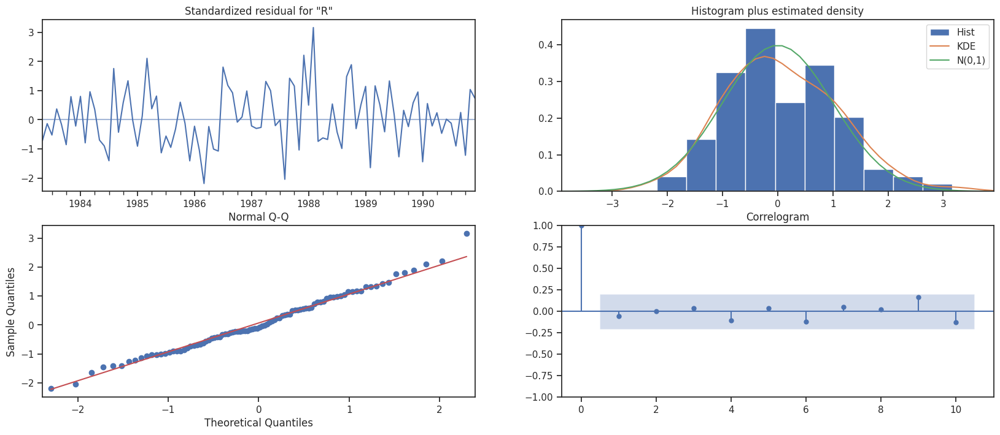

In [199]:
results_auto_SARIMA.plot_diagnostics();

#### Predict on the Test Set using this model and evaluate the model.

In [200]:
predicted_auto_SARIMA = results_auto_SARIMA.get_forecast(steps=len(test))

In [201]:
predicted_auto_SARIMA.predicted_mean

,predicted_mean
1991-01-31,55.235804
1991-02-28,68.122717
1991-03-31,67.908796
1991-04-30,66.786275
1991-05-31,69.760396
1991-06-30,70.329027
1991-07-31,75.359554
1991-08-31,76.492004
1991-09-30,78.971473
1991-10-31,76.538751


Text(0, 0.5, 'Wine Units Sold')

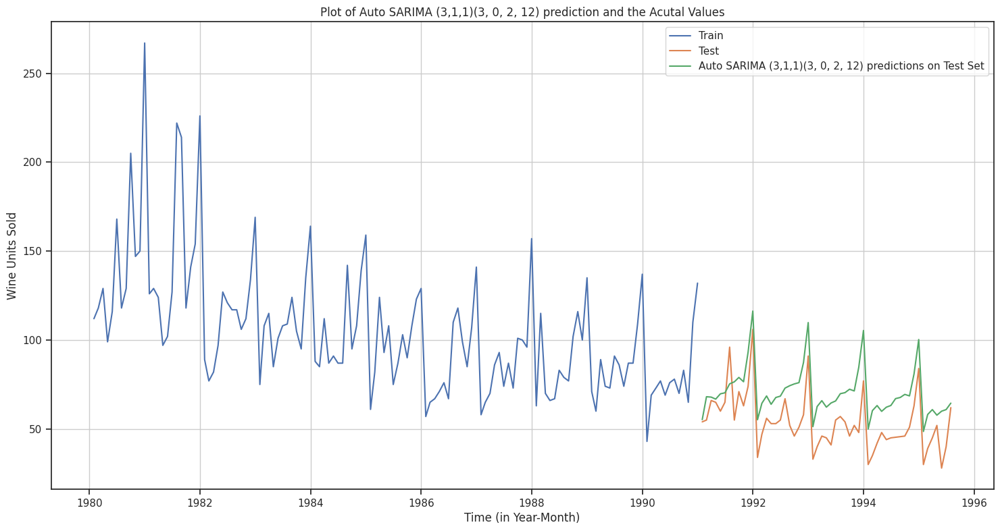

In [202]:
## Plotting on both the Training and Test data

plt.figure(figsize=(18,9))
plt.plot(train['Rose_Wine_Sales'], label='Train')
plt.plot(test['Rose_Wine_Sales'], label='Test')

plt.plot(predicted_auto_SARIMA.predicted_mean, label='Auto SARIMA (3,1,1)(3, 0, 2, 12) predictions on Test Set')

plt.legend(loc='best')
plt.grid();
plt.title('Plot of Auto SARIMA (3,1,1)(3, 0, 2, 12) prediction and the Acutal Values');
plt.xlabel('Time (in Year-Month)')
plt.ylabel('Wine Units Sold')

In [203]:
predicted_auto_SARIMA.summary_frame(alpha=0.05).head()

Rose_Wine_Sales,mean,mean_se,mean_ci_lower,mean_ci_upper
1991-01-31,55.235804,13.907560,27.977487,82.494121
1991-02-28,68.122717,13.990998,40.700864,95.544570
1991-03-31,67.908796,14.012050,40.445683,95.371909
1991-04-30,66.786275,14.099371,39.152016,94.420535
1991-05-31,69.760396,14.108731,42.107791,97.413001


In [205]:
rmse = mean_squared_error(test['Rose_Wine_Sales'],predicted_auto_SARIMA.predicted_mean) ** 0.5  # Calculate MSE and then take the square root to get RMSEmape = mean_absolute_percentage_error(test['Rose_Wine_Sales'],predicted_auto_SARIMA.predicted_mean)
print('RMSE:',rmse,'\nMAPE:',mape)

RMSE: 18.8818485219433 
MAPE: 75.84685520971229


In [206]:
temp_resultsDf = pd.DataFrame({'Test RMSE': rmse,'MAPE':mape}
                           ,index=['Auto SARIMA (3,1,1)(3,0,2,12)'])


resultsDf_2 = pd.concat([resultsDf_2,temp_resultsDf])

resultsDf_2

,Test RMSE,MAPE
"Auto ARIMA (2,1,3)",36.816915,75.846855
"Auto SARIMA (3,1,1)(3,0,2,12)",18.881849,75.846855


## 7. Build ARIMA/SARIMA models based on the cut-off points of ACF and PACF on the training data and evaluate this model on the test data using RMSE.

## Manual ARIMA Model

Let us look at the ACF and the PACF plots once more.

### ACF plot

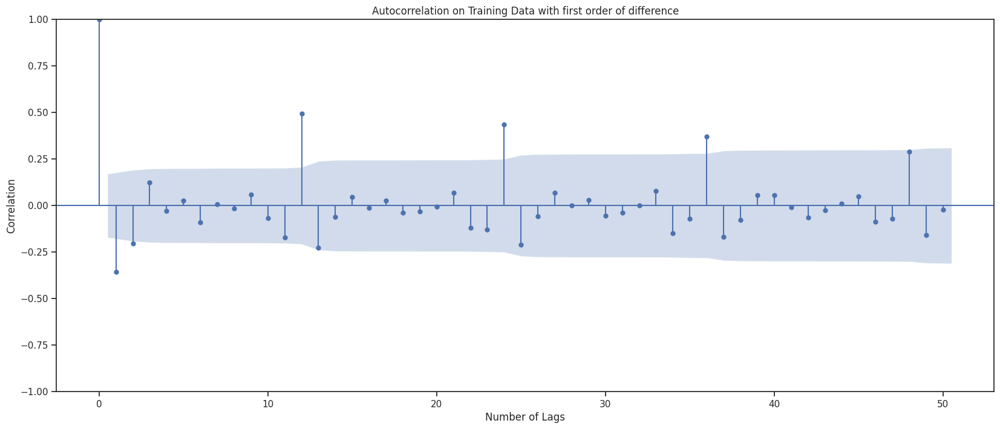

In [207]:
plot_acf(train.diff(),title='Autocorrelation on Training Data with first order of difference',missing='drop',lags=50)
plt.xlabel('Number of Lags')
plt.ylabel('Correlation')
plt.show()

### PACF plot

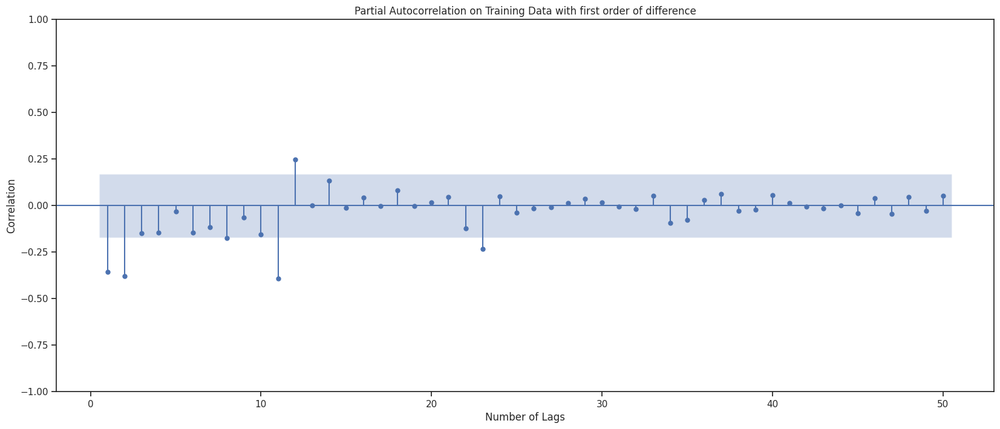

In [208]:
plot_pacf(train.diff().dropna(),title='Partial Autocorrelation on Training Data with first order of difference',lags=50,zero=False,method='ywmle')
plt.xlabel('Number of Lags')
plt.ylabel('Correlation')
plt.show()

Here, we have taken alpha=0.05.

* The Auto-Regressive parameter in an ARIMA model is 'p' which comes from the significant lag after which the PACF plot cuts-off to 0.
* The Moving-Average parameter in an ARIMA model is 'q' which comes from the significant lag after which the ACF plot cuts-off to 0.

By looking at the above plots, we will take the value of p and q to be 2 and 2 respectively.

In [209]:
manual_ARIMA = ARIMA(train['Rose_Wine_Sales'], order=(2,1,2),freq='M')

results_manual_ARIMA = manual_ARIMA.fit()

print(results_manual_ARIMA.summary())

                               SARIMAX Results                                
Dep. Variable:        Rose_Wine_Sales   No. Observations:                  132
Model:                 ARIMA(2, 1, 2)   Log Likelihood                -635.935
Date:                Sat, 03 May 2025   AIC                           1281.871
Time:                        07:45:16   BIC                           1296.247
Sample:                    01-31-1980   HQIC                          1287.712
                         - 12-31-1990                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.4540      0.469     -0.969      0.333      -1.372       0.464
ar.L2          0.0001      0.170      0.001      0.999      -0.334       0.334
ma.L1         -0.2541      0.459     -0.554      0.5

Let us analyse the residuals from the various diagnostics plot.

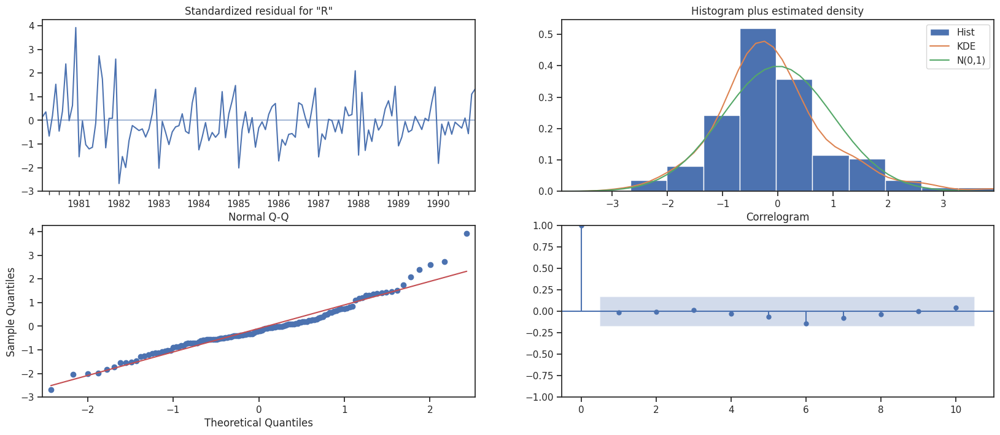

In [210]:
results_manual_ARIMA.plot_diagnostics();

#### Predict on the Test Set using this model and evaluate the model.

In [211]:
predicted_manual_ARIMA = results_manual_ARIMA.forecast(steps=len(test))

In [212]:
predicted_manual_ARIMA

,predicted_mean
1991-01-31,91.159512
1991-02-28,85.314628
1991-03-31,87.962468
1991-04-30,86.759563
1991-05-31,87.306038
1991-06-30,87.057777
1991-07-31,87.170561
1991-08-31,87.119324
1991-09-30,87.142601
1991-10-31,87.132026


Text(0, 0.5, 'Wine Units Sold')

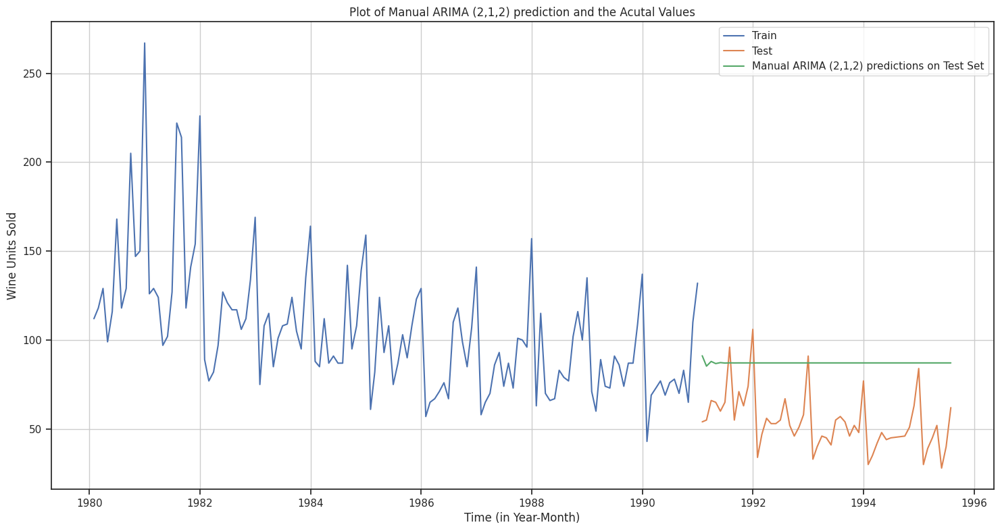

In [213]:
## Plotting on both the Training and Test data

plt.figure(figsize=(18,9))
plt.plot(train['Rose_Wine_Sales'], label='Train')
plt.plot(test['Rose_Wine_Sales'], label='Test')

plt.plot(predicted_manual_ARIMA, label='Manual ARIMA (2,1,2) predictions on Test Set')

plt.legend(loc='best')
plt.grid();
plt.title('Plot of Manual ARIMA (2,1,2) prediction and the Acutal Values');
plt.xlabel('Time (in Year-Month)')
plt.ylabel('Wine Units Sold')

In [215]:
rmse = metrics.mean_squared_error(test['Rose_Wine_Sales'], predicted_manual_ARIMA) ** 0.5  # Take the square root to get RMSEmape = mean_absolute_percentage_error(test['Rose_Wine_Sales'],predicted_manual_ARIMA)
print('RMSE:',rmse,'\nMAPE:',mape)

RMSE: 36.870991041964494 
MAPE: 75.84685520971229


In [216]:
temp_resultsDf = pd.DataFrame({'Test RMSE': rmse,'MAPE':mape}
                           ,index=['Manual ARIMA(2,1,2)'])


resultsDf_2 = pd.concat([resultsDf_2,temp_resultsDf])

resultsDf_2

,Test RMSE,MAPE
"Auto ARIMA (2,1,3)",36.816915,75.846855
"Auto SARIMA (3,1,1)(3,0,2,12)",18.881849,75.846855
"Manual ARIMA(2,1,2)",36.870991,75.846855


## Manual SARIMA Model

Let us look at the ACF and the PACF plots once more.

### ACF plot

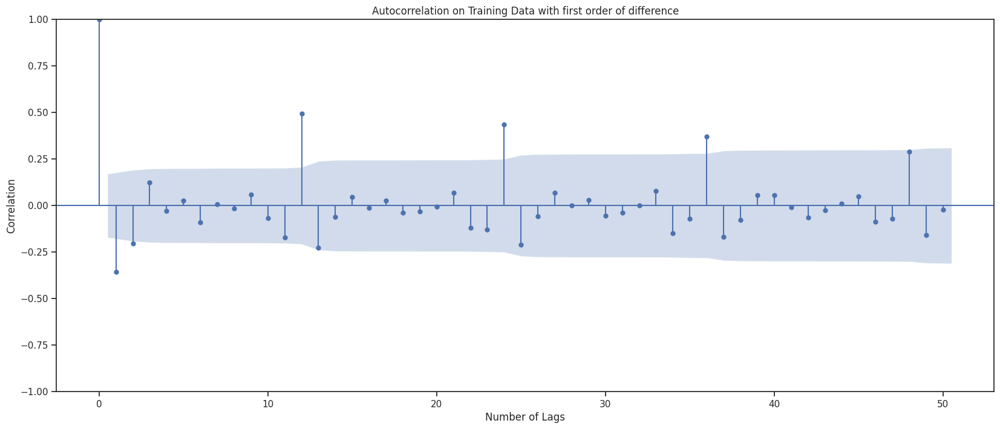

In [217]:
plot_acf(train.diff(),title='Autocorrelation on Training Data with first order of difference',missing='drop',lags=50)
plt.xlabel('Number of Lags')
plt.ylabel('Correlation')
plt.show()

### PACF plot

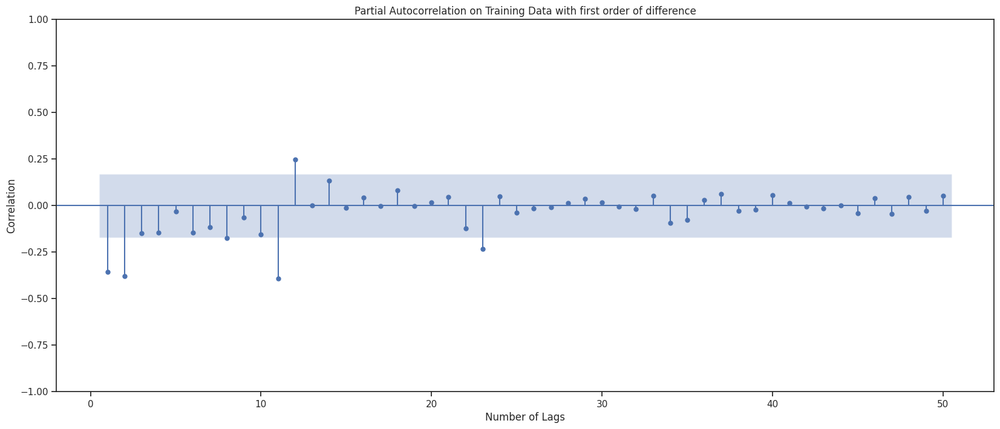

In [218]:
plot_pacf(train.diff().dropna(),title='Partial Autocorrelation on Training Data with first order of difference',lags=50,zero=False,method='ywmle')
plt.xlabel('Number of Lags')
plt.ylabel('Correlation')
plt.show()

We see that our ACF plot at the seasonal interval (12) does not taper off quickly. So, we go ahead and take a seasonal differencing of the original series. Before that let us look at the original series.

Text(0, 0.5, 'Units Sold')

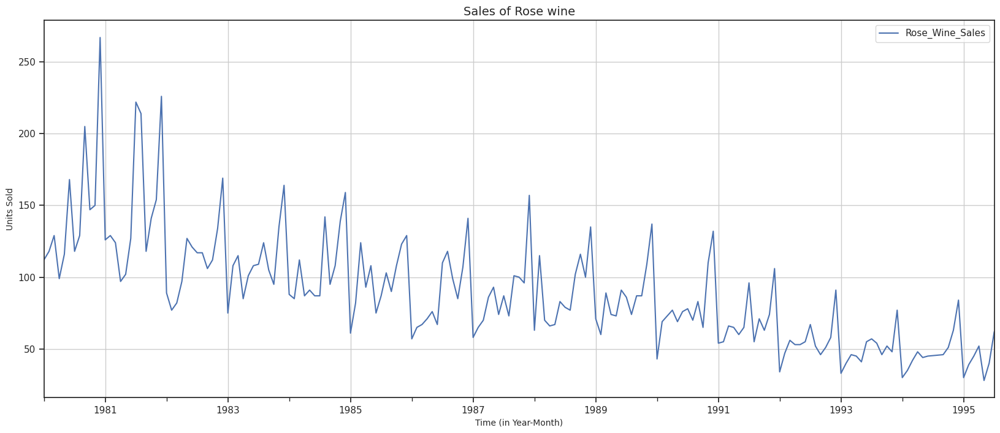

In [219]:
#Original Time Series
rcParams['figure.figsize'] = 20,8
df.plot(grid=True);
plt.title('Sales of Rose wine', fontsize=14)
plt.xlabel('Time (in Year-Month)',fontsize=10)
plt.ylabel('Units Sold',fontsize=10)

Text(0, 0.5, 'Wine Units Sold')

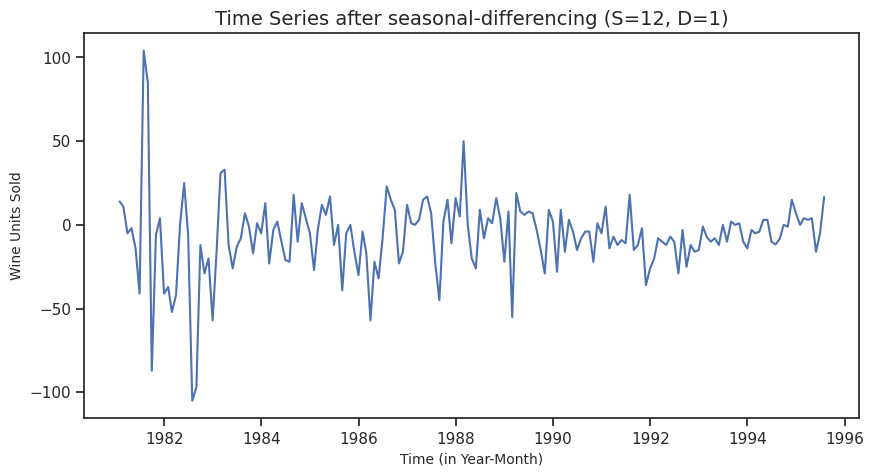

In [220]:
#Time series with seasonal differencing (S=12, D=1)
plt.figure(figsize=(10,5))
plt.plot(df['Rose_Wine_Sales'].diff(12).dropna())
plt.title ('Time Series after seasonal-differencing (S=12, D=1)',fontsize=14);
plt.xlabel('Time (in Year-Month)',fontsize=10)
plt.ylabel('Wine Units Sold',fontsize=10)

Text(0, 0.5, 'Wine Units Sold')

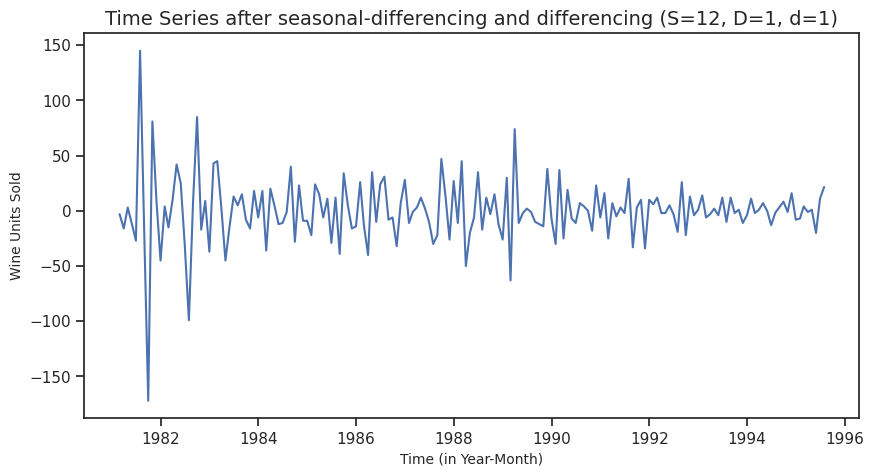

In [221]:
#Time series with seasonal differencing followed by normal differencing (S=12, D=1, d=1)
plt.figure(figsize=(10,5))
plt.plot((df['Rose_Wine_Sales'].diff(12).dropna()).diff().dropna())
plt.title ('Time Series after seasonal-differencing and differencing (S=12, D=1, d=1)',fontsize=14);
plt.xlabel('Time (in Year-Month)',fontsize=10)
plt.ylabel('Wine Units Sold',fontsize=10)

In [222]:
#Testing stationarity
dftest = adfuller((df['Rose_Wine_Sales'].diff(12).dropna()).diff().dropna(),regression='ct')
print('DF test statistic is %3.3f' %dftest[0])
print('DF test p-value is' ,dftest[1])
print('Number of lags used' ,dftest[2])

DF test statistic is -4.551
DF test p-value is 0.0012457307793127912
Number of lags used 11


Let us look at the ACF and the PACF plots once more with seasonal and normal differencing on train data

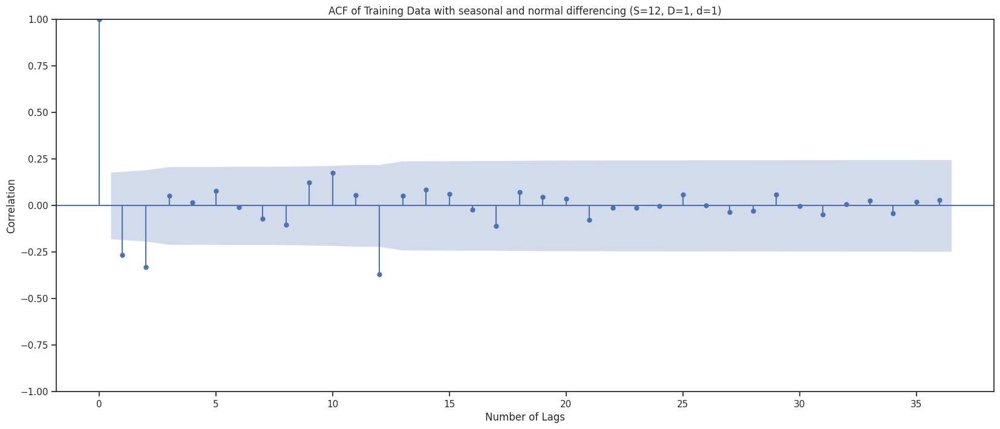

In [223]:
plot_acf((train['Rose_Wine_Sales'].diff(12).dropna()).diff().dropna(),title='ACF of Training Data with seasonal and normal differencing (S=12, D=1, d=1)',lags=36)
plt.xlabel('Number of Lags')
plt.ylabel('Correlation')
plt.show()

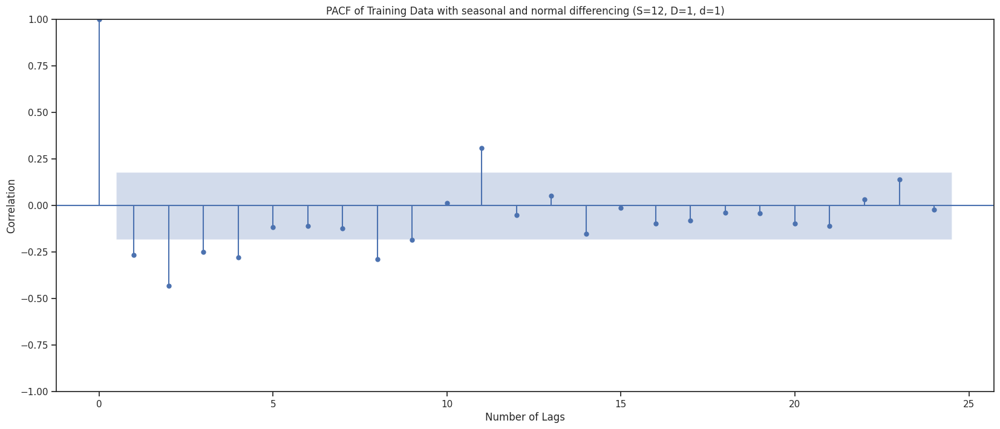

In [224]:
plot_pacf((train['Rose_Wine_Sales'].diff(12).dropna()).diff().dropna(),title='PACF of Training Data with seasonal and normal differencing (S=12, D=1, d=1)',lags=24)
plt.xlabel('Number of Lags')
plt.ylabel('Correlation')
plt.show()

- Here we have taken alpha = 0.05 and seasonal period as 12.


- From the PACF plot it can be seen that till lag 4 is significant before cut-off, so AR term ‘p = 4’ is chosen. At seasonal lag of 12, it cuts off, so keep seasonal AR ‘P = 0’.


- From ACF plot, lag 1 and 2 are significant before it cuts off, so lets keep MA term ‘q = 2’ and at seasonal lag of 12, a significant lag is apparent and no seaonal lags are apparent at lags 24, 36 or afterwards, so lets keep ‘Q = 1'.


- The final selected terms for SARIMA model is (4, 1, 2)x(0, 1, 1, 12), as inferred from the ACF and PACF plots.

In [225]:
import statsmodels.api as sm

manual_SARIMA = sm.tsa.statespace.SARIMAX(train['Rose_Wine_Sales'],
                                order=(4,1,2),
                                seasonal_order=(0, 1, 1, 12),
                                enforce_stationarity=False,
                                enforce_invertibility=False)
results_manual_SARIMA = manual_SARIMA.fit(maxiter=1000)
print(results_manual_SARIMA.summary())

                                      SARIMAX Results                                       
Dep. Variable:                      Rose_Wine_Sales   No. Observations:                  132
Model:             SARIMAX(4, 1, 2)x(0, 1, [1], 12)   Log Likelihood                -446.102
Date:                              Sat, 03 May 2025   AIC                            908.203
Time:                                      07:47:57   BIC                            929.358
Sample:                                  01-31-1980   HQIC                           916.774
                                       - 12-31-1990                                         
Covariance Type:                                opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.8046      0.119     -6.778      0.000      -1.037      -0.572
ar.L2          0.03

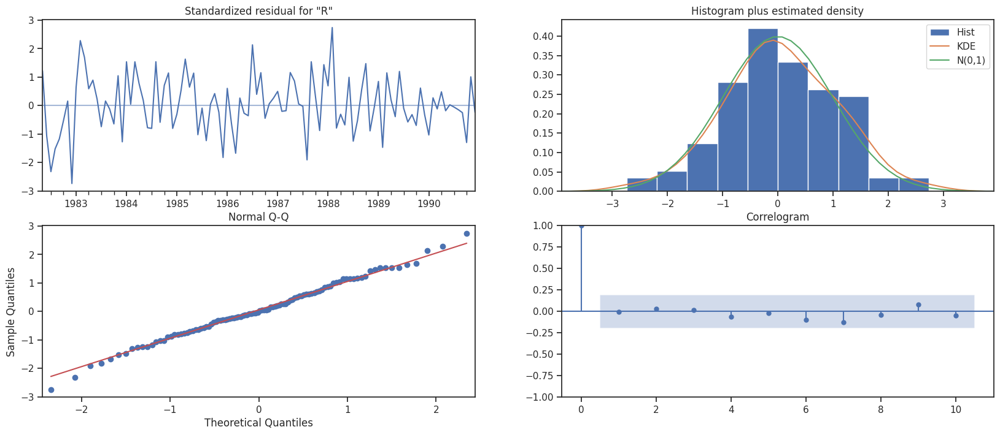

In [226]:
results_manual_SARIMA.plot_diagnostics()
plt.show()

#### Predict on the Test Set using this model and evaluate the model.

In [227]:
predicted_manual_SARIMA = results_manual_SARIMA.get_forecast(steps=len(test))

In [228]:
predicted_manual_SARIMA.predicted_mean

,predicted_mean
1991-01-31,47.471764
1991-02-28,63.350018
1991-03-31,65.513285
1991-04-30,67.317182
1991-05-31,61.756416
1991-06-30,72.816609
1991-07-31,71.513832
1991-08-31,67.808638
1991-09-30,77.918588
1991-10-31,73.748671


Text(0, 0.5, 'Wine Units Sold')

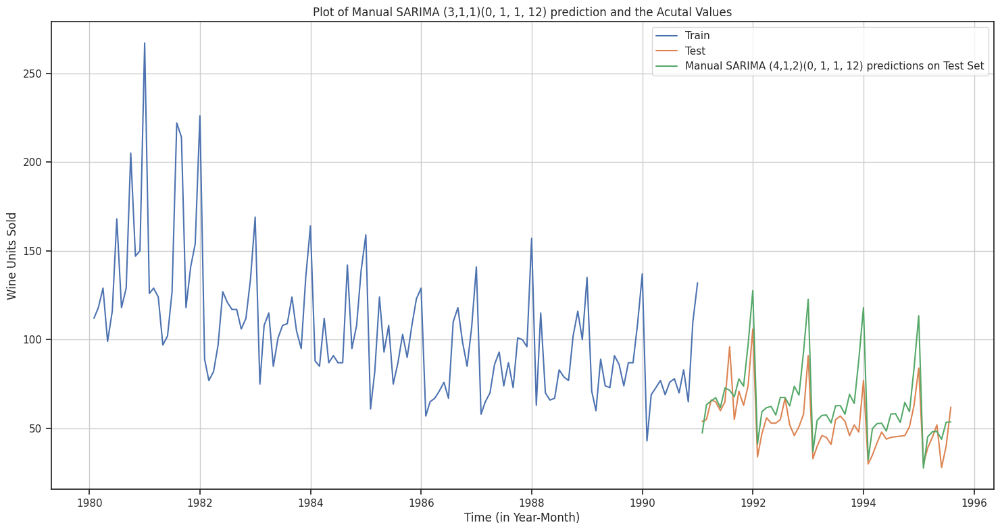

In [229]:
## Plotting on both the Training and Test data

plt.figure(figsize=(18,9))
plt.plot(train['Rose_Wine_Sales'], label='Train')
plt.plot(test['Rose_Wine_Sales'], label='Test')

plt.plot(predicted_manual_SARIMA.predicted_mean, label='Manual SARIMA (4,1,2)(0, 1, 1, 12) predictions on Test Set')

plt.legend(loc='best')
plt.grid();
plt.title('Plot of Manual SARIMA (3,1,1)(0, 1, 1, 12) prediction and the Acutal Values');
plt.xlabel('Time (in Year-Month)')
plt.ylabel('Wine Units Sold')

In [231]:
from sklearn.metrics import mean_squared_error

rmse = mean_squared_error(test['Rose_Wine_Sales'],predicted_manual_SARIMA.predicted_mean) ** 0.5  # Calculate MSE and then take the square root to get RMSE
mape = mean_absolute_percentage_error(test['Rose_Wine_Sales'],predicted_manual_SARIMA.predicted_mean)
print('RMSE:',rmse,'\nMAPE:',mape)

RMSE: 15.907182350411736 
MAPE: 23.71261553502886


In [232]:
temp_resultsDf = pd.DataFrame({'Test RMSE': rmse,'MAPE':mape}
                           ,index=['Manual SARIMA (4, 1, 2)(0, 1, 1, 12)'])


resultsDf_2 = pd.concat([resultsDf_2,temp_resultsDf])

resultsDf_2

,Test RMSE,MAPE
"Auto ARIMA (2,1,3)",36.816915,75.846855
"Auto SARIMA (3,1,1)(3,0,2,12)",18.881849,75.846855
"Manual ARIMA(2,1,2)",36.870991,75.846855
"Manual SARIMA (4, 1, 2)(0, 1, 1, 12)",15.907182,23.712616


## 8. Build a table (create a data frame) with all the models built along with their corresponding parameters and the respective RMSE values on the test data.

In [233]:
#Combining the tables which contained the exponential smoothing models and ARIMA/SARIMA into one
resultsDf_Final = pd.concat([resultsDf,resultsDf_2])

resultsDf_Final

,Test RMSE,MAPE
Linear Regression,15.268887,NaN
Naive Model,79.718576,NaN
Simple Average,53.460367,NaN
Simple Average,53.460367,NaN
2 point TMA,11.529278,NaN
4 point TMA,14.451376,NaN
6 point TMA,14.566262,NaN
9 point TMA,14.727596,NaN
"Alpha=0.0987,SimpleExponentialSmoothing",37.592007,NaN
"Alpha=1.49e-08, Beta=7.389e-09, Double Exponential Smoothing",15.270901,NaN


In [234]:
resultsDf_Final.sort_values(by='MAPE',ascending=True)

,Test RMSE,MAPE
"Manual SARIMA (4, 1, 2)(0, 1, 1, 12)",15.907182,23.712616
"Auto ARIMA (2,1,3)",36.816915,75.846855
"Auto SARIMA (3,1,1)(3,0,2,12)",18.881849,75.846855
"Manual ARIMA(2,1,2)",36.870991,75.846855
Linear Regression,15.268887,NaN
Naive Model,79.718576,NaN
Simple Average,53.460367,NaN
Simple Average,53.460367,NaN
2 point TMA,11.529278,NaN
4 point TMA,14.451376,NaN


In [235]:
resultsDf_Final.sort_values(by='Test RMSE',ascending=True)

,Test RMSE,MAPE
"Alpha=0.2,Beta=0.85,Gamma=0.15,Triple Exponential Smoothing",10.279876,NaN
2 point TMA,11.529278,NaN
4 point TMA,14.451376,NaN
6 point TMA,14.566262,NaN
9 point TMA,14.727596,NaN
Linear Regression,15.268887,NaN
"Alpha=1.49e-08, Beta=7.389e-09, Double Exponential Smoothing",15.270901,NaN
"Manual SARIMA (4, 1, 2)(0, 1, 1, 12)",15.907182,23.712616
"Auto SARIMA (3,1,1)(3,0,2,12)",18.881849,75.846855
"Alpha=0.064,Beta=0.053,Gamma=0.0,Triple Exponential Smoothing",19.112866,NaN


## 9. Based on the model-building exercise, build the most optimum model(s) on the complete data and predict 12 months into the future with appropriate confidence intervals/bands.

From the above results we can see that Triple exponential model is the optimum model followed by Trailing moving average models. However lets take TES and Manual SARIMA and predict for the future.

Text(0, 0.5, 'Wine Units Sold')

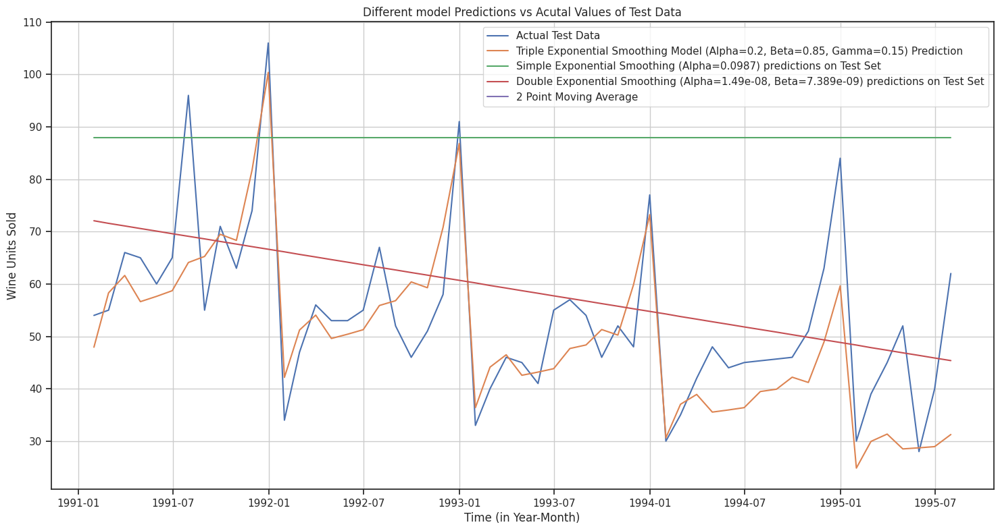

In [236]:
## Plotting on training data

plt.figure(figsize=(18,9))
plt.plot(test['Rose_Wine_Sales'], label='Actual Test Data')

plt.plot(TES_test['predict', 0.2,0.85,0.15], label='Triple Exponential Smoothing Model (Alpha=0.2, Beta=0.85, Gamma=0.15) Prediction')

plt.plot(SES_test['predict'], label='Simple Exponential Smoothing (Alpha=0.0987) predictions on Test Set')

plt.plot(DES_test['predict'], label='Double Exponential Smoothing (Alpha=1.49e-08, Beta=7.389e-09) predictions on Test Set')

plt.plot(MovingAverage['Trailing_2'][-1:len(test)], label='2 Point Moving Average')

plt.legend(loc='best')
plt.grid();
plt.title('Different model Predictions vs Acutal Values of Test Data');
plt.xlabel('Time (in Year-Month)')
plt.ylabel('Wine Units Sold')

Text(0, 0.5, 'Wine Units Sold')

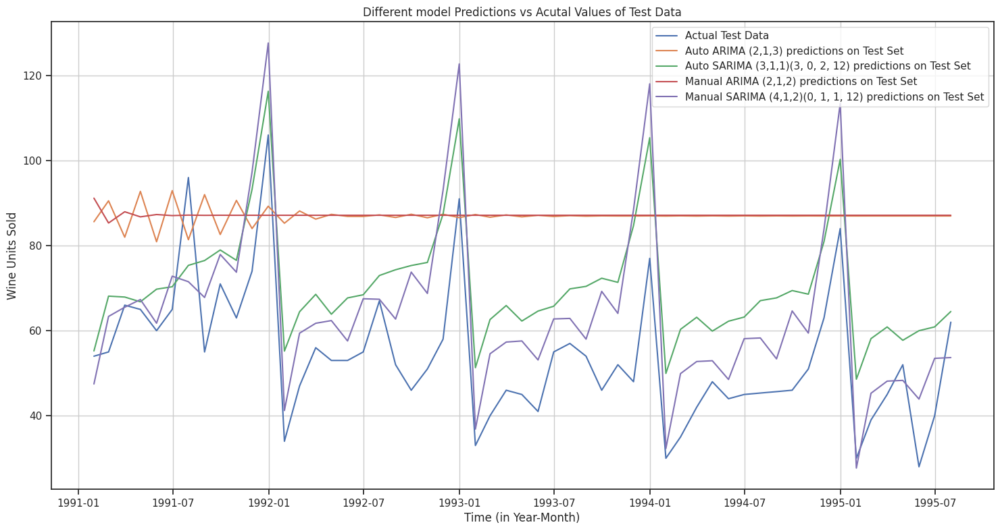

In [237]:
## Plotting on both the Training data

plt.figure(figsize=(18,9))
plt.plot(test['Rose_Wine_Sales'], label='Actual Test Data')

plt.plot(predicted_auto_ARIMA, label='Auto ARIMA (2,1,3) predictions on Test Set')

plt.plot(predicted_auto_SARIMA.predicted_mean, label='Auto SARIMA (3,1,1)(3, 0, 2, 12) predictions on Test Set')

plt.plot(predicted_manual_ARIMA, label='Manual ARIMA (2,1,2) predictions on Test Set')

plt.plot(predicted_manual_SARIMA.predicted_mean, label='Manual SARIMA (4,1,2)(0, 1, 1, 12) predictions on Test Set')


plt.legend(loc='best')
plt.grid();
plt.title('Different model Predictions vs Acutal Values of Test Data');
plt.xlabel('Time (in Year-Month)')
plt.ylabel('Wine Units Sold')

Text(0, 0.5, 'Wine Units Sold')

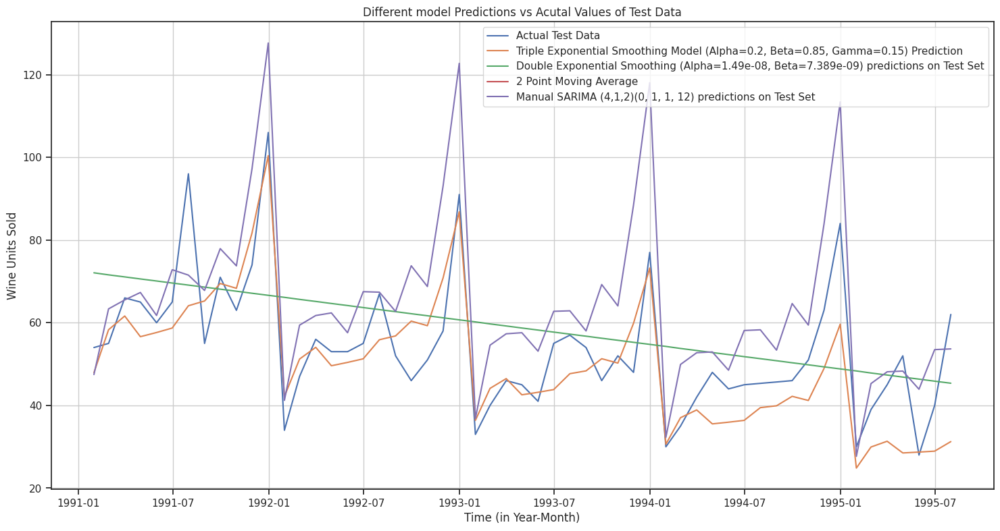

In [238]:
## Plotting on both the Training data

plt.figure(figsize=(18,9))
plt.plot(test['Rose_Wine_Sales'], label='Actual Test Data')

plt.plot(TES_test['predict', 0.2,0.85,0.15], label='Triple Exponential Smoothing Model (Alpha=0.2, Beta=0.85, Gamma=0.15) Prediction')

plt.plot(DES_test['predict'], label='Double Exponential Smoothing (Alpha=1.49e-08, Beta=7.389e-09) predictions on Test Set')

plt.plot(MovingAverage['Trailing_2'][-1:len(test)], label='2 Point Moving Average')

plt.plot(predicted_manual_SARIMA.predicted_mean, label='Manual SARIMA (4,1,2)(0, 1, 1, 12) predictions on Test Set')


plt.legend(loc='best')
plt.grid();
plt.title('Different model Predictions vs Acutal Values of Test Data');
plt.xlabel('Time (in Year-Month)')
plt.ylabel('Wine Units Sold')

## Optimum Model - Triple Exponential Smoothing Model (Alpha=0.2, Beta=0.85, Gamma=0.15)

Text(0, 0.5, 'Wine Units Sold')

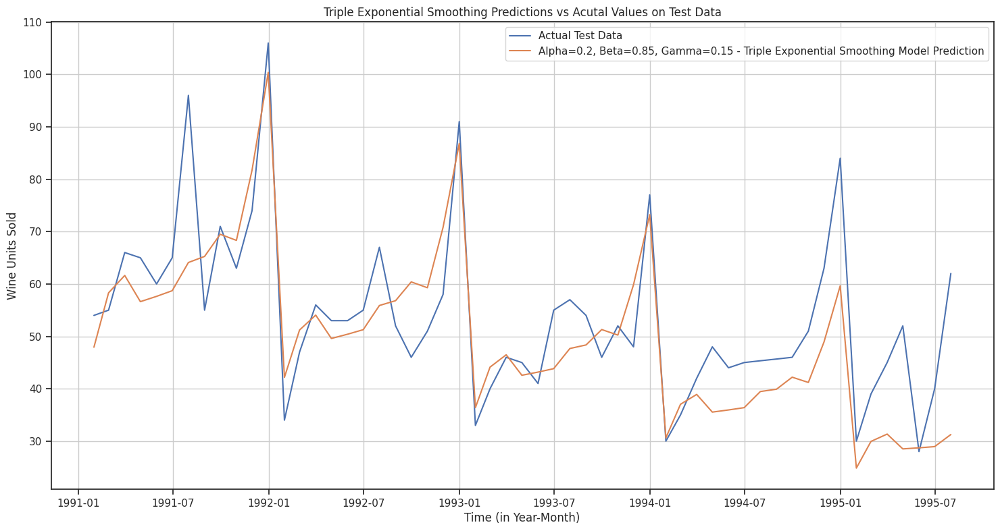

In [239]:
## Plotting on both the Training data

plt.figure(figsize=(18,9))
plt.plot(test['Rose_Wine_Sales'], label='Actual Test Data')

plt.plot(TES_test['predict', 0.2,0.85,0.15], label='Alpha=0.2, Beta=0.85, Gamma=0.15 - Triple Exponential Smoothing Model Prediction')

plt.legend(loc='best')
plt.grid();
plt.title('Triple Exponential Smoothing Predictions vs Acutal Values on Test Data');
plt.xlabel('Time (in Year-Month)')
plt.ylabel('Wine Units Sold')

Text(0, 0.5, 'Wine Units Sold')

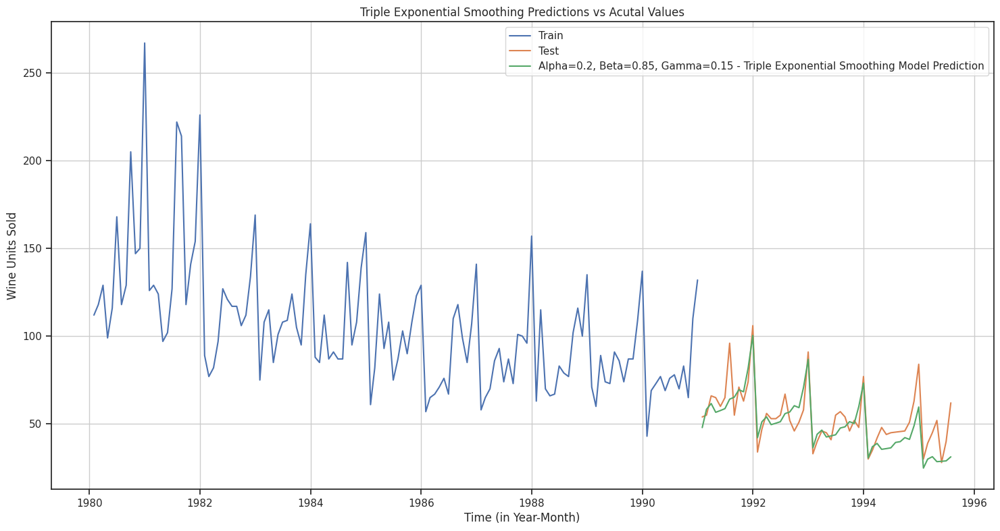

In [240]:
## Plotting on both the Training and Test data

plt.figure(figsize=(18,9))
plt.plot(train['Rose_Wine_Sales'], label='Train')
plt.plot(test['Rose_Wine_Sales'], label='Test')

plt.plot(TES_test['predict', 0.2,0.85,0.15], label='Alpha=0.2, Beta=0.85, Gamma=0.15 - Triple Exponential Smoothing Model Prediction')

plt.legend(loc='best')
plt.grid();
plt.title('Triple Exponential Smoothing Predictions vs Acutal Values');
plt.xlabel('Time (in Year-Month)')
plt.ylabel('Wine Units Sold')

In [241]:
TES_Fullmodel = ExponentialSmoothing(df['Rose_Wine_Sales'],trend='additive',seasonal='multiplicative',freq='M').fit(smoothing_level=0.2, smoothing_trend=0.85, smoothing_seasonal=0.15)

In [242]:
TES_Fullmodel.params

{'smoothing_level': np.float64(0.2),
 'smoothing_trend': np.float64(0.85),
 'smoothing_seasonal': np.float64(0.15),
 'damping_trend': nan,
 'initial_level': np.float64(130.9841576458055),
 'initial_trend': np.float64(-1.6445222874991299),
 'initial_seasons': array([0.87544867, 0.94117829, 1.01714004, 0.77981537, 0.93330824,
        1.09442425, 1.23407777, 1.35952962, 1.18259125, 1.1815483 ,
        1.30127332, 1.91744421]),
 'use_boxcox': False,
 'lamda': None,
 'remove_bias': False}

In [244]:
RMSE_fullmodel = metrics.mean_squared_error(df['Rose_Wine_Sales'],TES_Fullmodel.fittedvalues) ** 0.5  # Calculate MSE and then take the square root to get RMSE

print('RMSE:',RMSE_fullmodel)

RMSE: 20.704457426110576


In [245]:
# Getting the predictions for the 12 months into the future
prediction = TES_Fullmodel.forecast(steps=12)
print('Forecast of next 12 months')
prediction.tail(12)

Forecast of next 12 months


,0
1995-08-31,38.192838
1995-09-30,39.507940
1995-10-31,41.376237
1995-11-30,49.568190
1995-12-31,70.756182
1996-01-31,28.650617
1996-02-29,36.970795
1996-03-31,44.051743
1996-04-30,45.545585
1996-05-31,40.265786


Text(0, 0.5, 'Wine Units Sold')

<Figure size 1800x900 with 0 Axes>

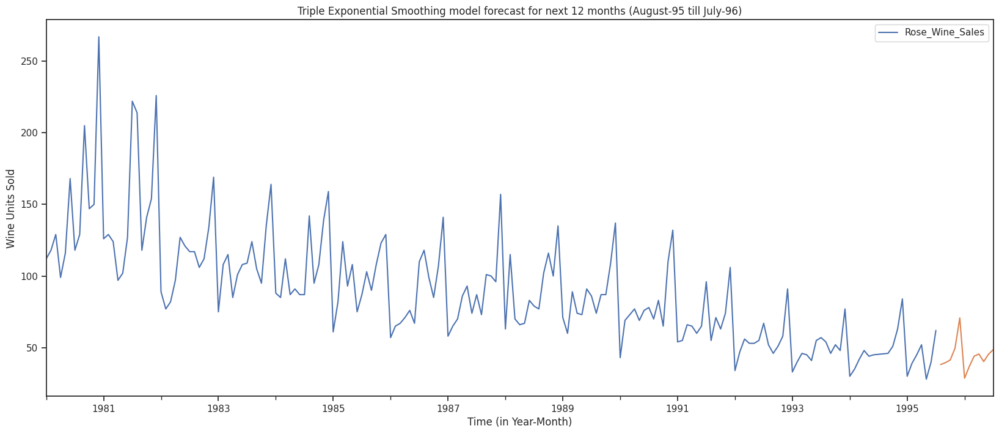

In [246]:
plt.figure(figsize=(18,9))
df.plot()
prediction.plot();
plt.title('Triple Exponential Smoothing model forecast for next 12 months (August-95 till July-96)')
plt.xlabel('Time (in Year-Month)')
plt.ylabel('Wine Units Sold')

In [247]:
#In the below code, we have calculated the upper and lower confidence bands at 95% confidence level
#Here we are taking the multiplier to be 1.96 as we want to plot with respect to a 95% confidence intervals.
predicted_df = pd.DataFrame({'lower_ci':prediction - (1.96*np.std(TES_Fullmodel.resid,ddof=1)),
                          'prediction':prediction,
                          'upper_ci': prediction + (1.96*np.std(TES_Fullmodel.resid,ddof=1))})
predicted_df.head(12)

,lower_ci,prediction,upper_ci
1995-08-31,-2.489646,38.192838,78.875322
1995-09-30,-1.174544,39.507940,80.190424
1995-10-31,0.693753,41.376237,82.058721
1995-11-30,8.885706,49.568190,90.250674
1995-12-31,30.073698,70.756182,111.438666
1996-01-31,-12.031867,28.650617,69.333101
1996-02-29,-3.711689,36.970795,77.653279
1996-03-31,3.369258,44.051743,84.734227
1996-04-30,4.863100,45.545585,86.228069
1996-05-31,-0.416698,40.265786,80.948270


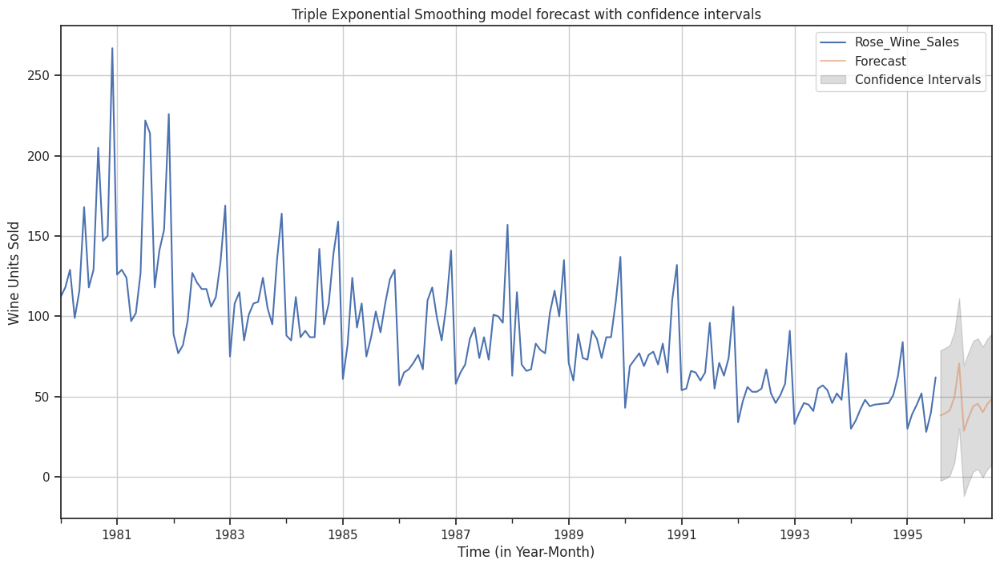

In [248]:
# plot the forecast along with the confidence band

axis = df.plot(label='Actual', figsize=(15,8))
predicted_df['prediction'].plot(ax=axis, label='Forecast', alpha=0.5)
axis.fill_between(predicted_df.index, predicted_df['lower_ci'], predicted_df['upper_ci'], color='k', alpha=.15,label='Confidence Intervals')
plt.title('Triple Exponential Smoothing model forecast with confidence intervals')
plt.xlabel('Time (in Year-Month)')
plt.ylabel('Wine Units Sold')
plt.legend(loc='best')
plt.grid()
plt.show()

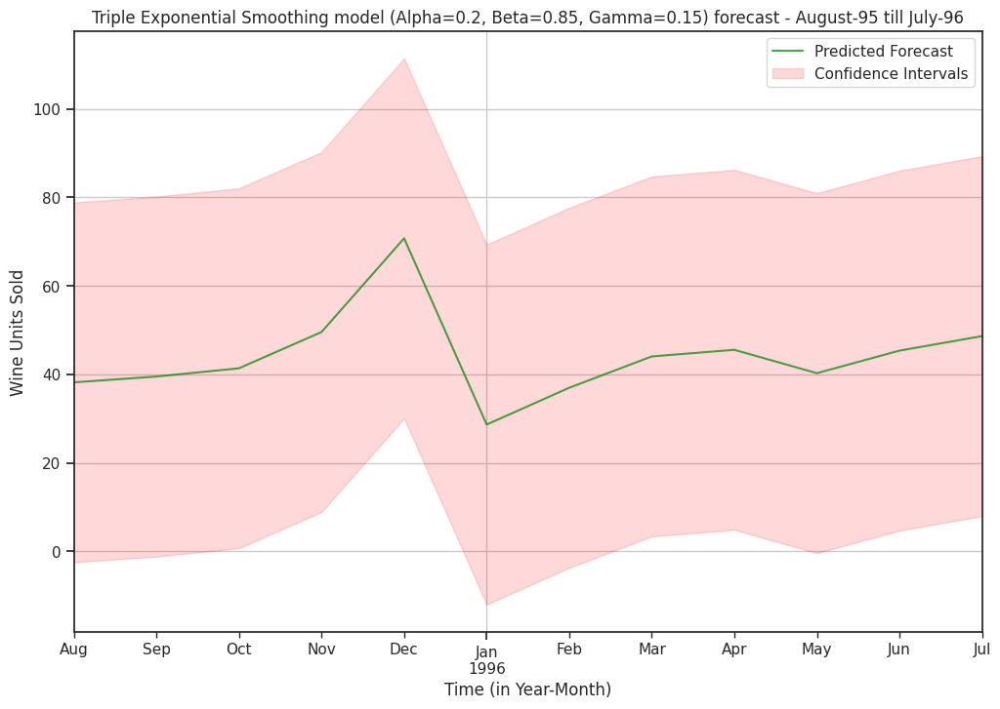

In [249]:
# plot the forecast along with the confidence band
plt.figure(figsize=(12,8))
axis = prediction.plot(color='Green', label='Predicted Forecast', alpha=0.7)
axis.fill_between(predicted_df.index, predicted_df['lower_ci'], predicted_df['upper_ci'], color='Red', alpha=.15, label='Confidence Intervals')
axis.set_title('Triple Exponential Smoothing model (Alpha=0.2, Beta=0.85, Gamma=0.15) forecast - August-95 till July-96')
axis.set_xlabel('Time (in Year-Month)')
axis.set_ylabel('Wine Units Sold')
plt.legend(loc='best')
plt.grid()
plt.show()

## Optimum Model - Manual SARIMA Model (4, 1, 2)(0, 1, 1, 12)

Text(0, 0.5, 'Wine Units Sold')

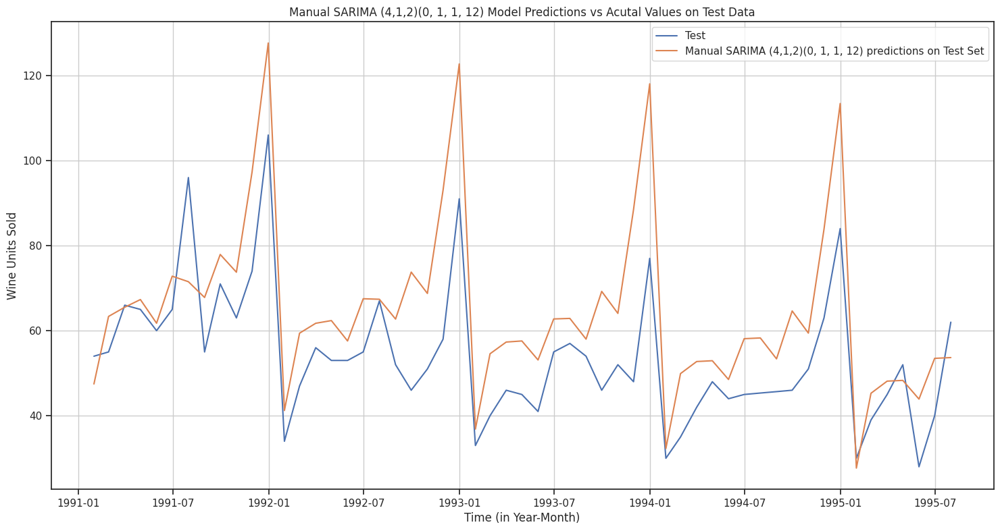

In [250]:
## Plotting on Test data

plt.figure(figsize=(18,9))
plt.plot(test['Rose_Wine_Sales'], label='Test')

plt.plot(predicted_manual_SARIMA.predicted_mean, label='Manual SARIMA (4,1,2)(0, 1, 1, 12) predictions on Test Set')

plt.legend(loc='best')
plt.grid();
plt.title('Manual SARIMA (4,1,2)(0, 1, 1, 12) Model Predictions vs Acutal Values on Test Data');
plt.xlabel('Time (in Year-Month)')
plt.ylabel('Wine Units Sold')

Text(0, 0.5, 'Wine Units Sold')

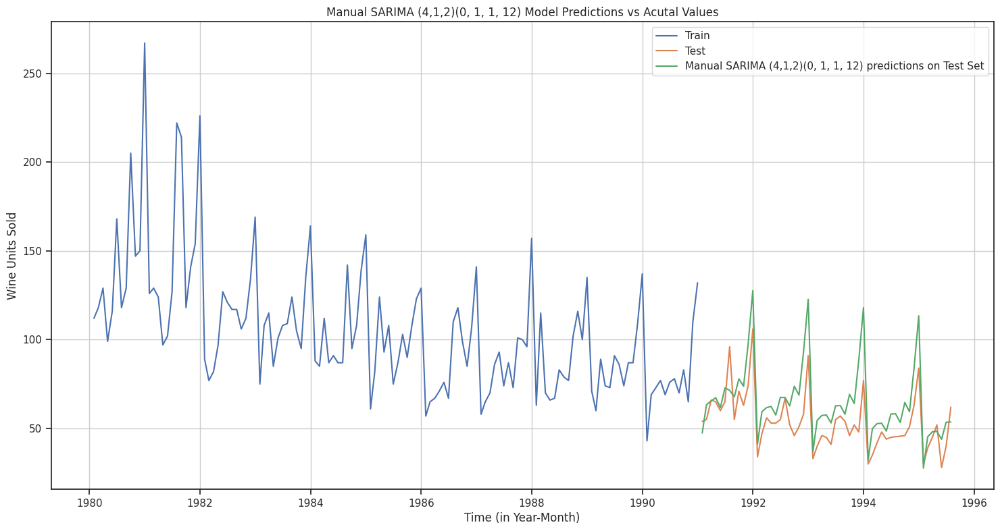

In [251]:
## Plotting on both the Training and Test data

plt.figure(figsize=(18,9))
plt.plot(train['Rose_Wine_Sales'], label='Train')
plt.plot(test['Rose_Wine_Sales'], label='Test')

plt.plot(predicted_manual_SARIMA.predicted_mean, label='Manual SARIMA (4,1,2)(0, 1, 1, 12) predictions on Test Set')

plt.legend(loc='best')
plt.grid();
plt.title('Manual SARIMA (4,1,2)(0, 1, 1, 12) Model Predictions vs Acutal Values');
plt.xlabel('Time (in Year-Month)')
plt.ylabel('Wine Units Sold')

In [252]:
Manual_Sarima_FullModel = sm.tsa.statespace.SARIMAX(df['Rose_Wine_Sales'],
                                order= (4, 1, 2),
                                seasonal_order= (0, 1, 1, 12),
                                enforce_stationarity=False,
                                enforce_invertibility=False)
results_fullmodel_manual_sarima = Manual_Sarima_FullModel.fit(maxiter=1000)
print(results_fullmodel_manual_sarima.summary())

                                      SARIMAX Results                                       
Dep. Variable:                      Rose_Wine_Sales   No. Observations:                  187
Model:             SARIMAX(4, 1, 2)x(0, 1, [1], 12)   Log Likelihood                -658.935
Date:                              Sat, 03 May 2025   AIC                           1333.870
Time:                                      07:51:39   BIC                           1358.421
Sample:                                  01-31-1980   HQIC                          1343.840
                                       - 07-31-1995                                         
Covariance Type:                                opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.8239      0.083     -9.939      0.000      -0.986      -0.661
ar.L2          0.04

In [253]:
predicted_manual_sarima_full_data = results_fullmodel_manual_sarima.get_forecast(steps=12)
predicted_manual_sarima_full_data.summary_frame(alpha=0.05).head()

Rose_Wine_Sales,mean,mean_se,mean_ci_lower,mean_ci_upper
1995-08-31,48.272532,15.053102,18.768994,77.776071
1995-09-30,44.985711,15.830703,13.958104,76.013319
1995-10-31,45.474488,15.889168,14.332292,76.616684
1995-11-30,54.806696,15.899163,23.644909,85.968483
1995-12-31,81.904222,15.913864,50.713623,113.094821


In [254]:
predicted_manual_sarima_df = predicted_manual_sarima_full_data.summary_frame(alpha=0.05)
predicted_manual_sarima_df

Rose_Wine_Sales,mean,mean_se,mean_ci_lower,mean_ci_upper
1995-08-31,48.272532,15.053102,18.768994,77.776071
1995-09-30,44.985711,15.830703,13.958104,76.013319
1995-10-31,45.474488,15.889168,14.332292,76.616684
1995-11-30,54.806696,15.899163,23.644909,85.968483
1995-12-31,81.904222,15.913864,50.713623,113.094821
1996-01-31,25.670657,16.199627,-6.080028,57.421342
1996-02-29,33.894509,16.307731,1.931944,65.857073
1996-03-31,40.047544,16.589672,7.532384,72.562704
1996-04-30,44.382924,16.657674,11.734483,77.031365
1996-05-31,31.338505,16.871987,-1.729982,64.406992


In [256]:
rmse_manual_sarima_full = metrics.mean_squared_error(df['Rose_Wine_Sales'], results_fullmodel_manual_sarima.fittedvalues) ** 0.5  # Calculate MSE and then take the square root to get RMSE
rmse_manual_sarima_full

32.21884877918791

In [257]:
# Getting the predictions for the 12 months into the future
prediction_manual_sarima_full = results_fullmodel_manual_sarima.forecast(steps=12)
prediction_manual_sarima_full.tail(12)

,predicted_mean
1995-08-31,48.272532
1995-09-30,44.985711
1995-10-31,45.474488
1995-11-30,54.806696
1995-12-31,81.904222
1996-01-31,25.670657
1996-02-29,33.894509
1996-03-31,40.047544
1996-04-30,44.382924
1996-05-31,31.338505


Text(0, 0.5, 'Wine Units Sold')

<Figure size 1800x900 with 0 Axes>

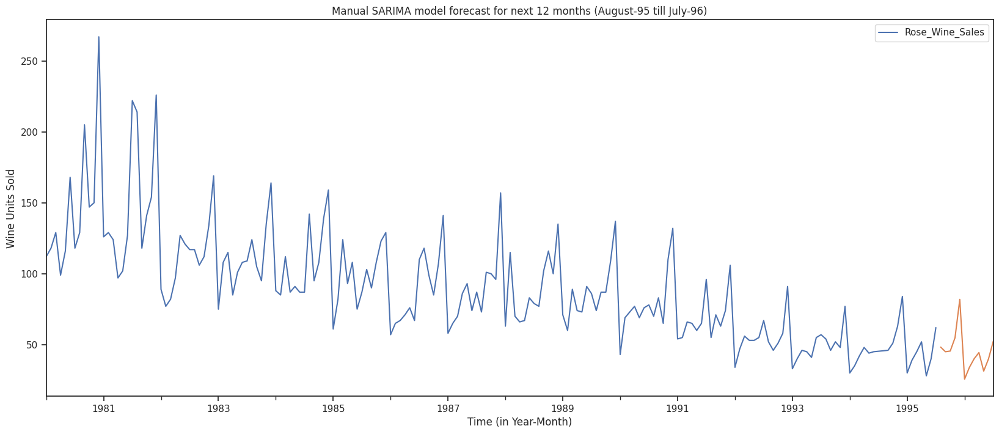

In [258]:
plt.figure(figsize=(18,9))
df.plot()
prediction_manual_sarima_full.plot();
plt.title('Manual SARIMA model forecast for next 12 months (August-95 till July-96)')
plt.xlabel('Time (in Year-Month)')
plt.ylabel('Wine Units Sold')

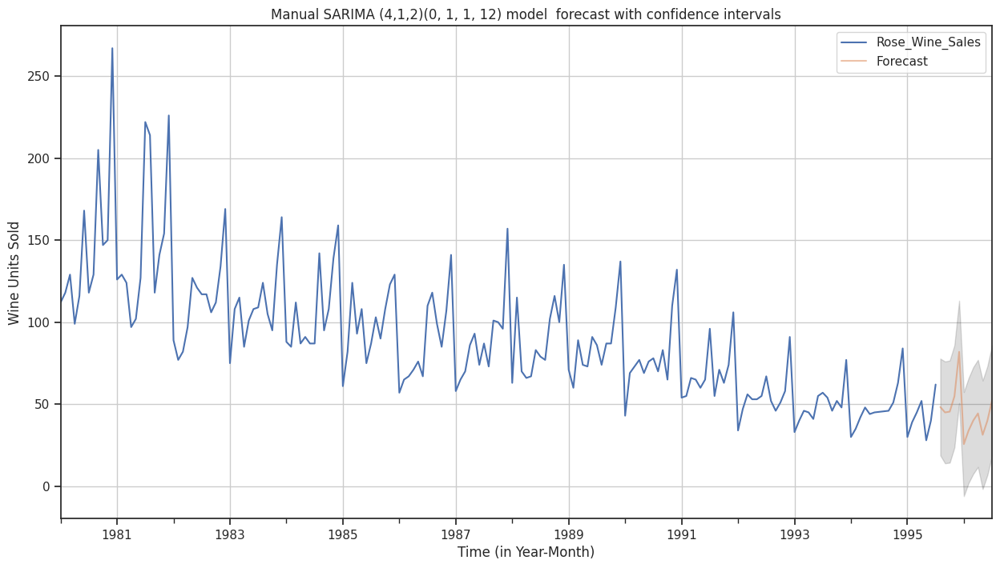

In [259]:
# plot the forecast along with the confidence band

axis = df.plot(label='Actual', figsize=(15,8))
predicted_manual_sarima_df['mean'].plot(ax=axis, label='Forecast', alpha=0.5)
axis.fill_between(predicted_manual_sarima_df.index, predicted_manual_sarima_df['mean_ci_lower'], predicted_manual_sarima_df['mean_ci_upper'], color='k', alpha=.15)
plt.title('Manual SARIMA (4,1,2)(0, 1, 1, 12) model  forecast with confidence intervals')
plt.xlabel('Time (in Year-Month)')
plt.ylabel('Wine Units Sold')
plt.legend(loc='best')
plt.grid()
plt.show()

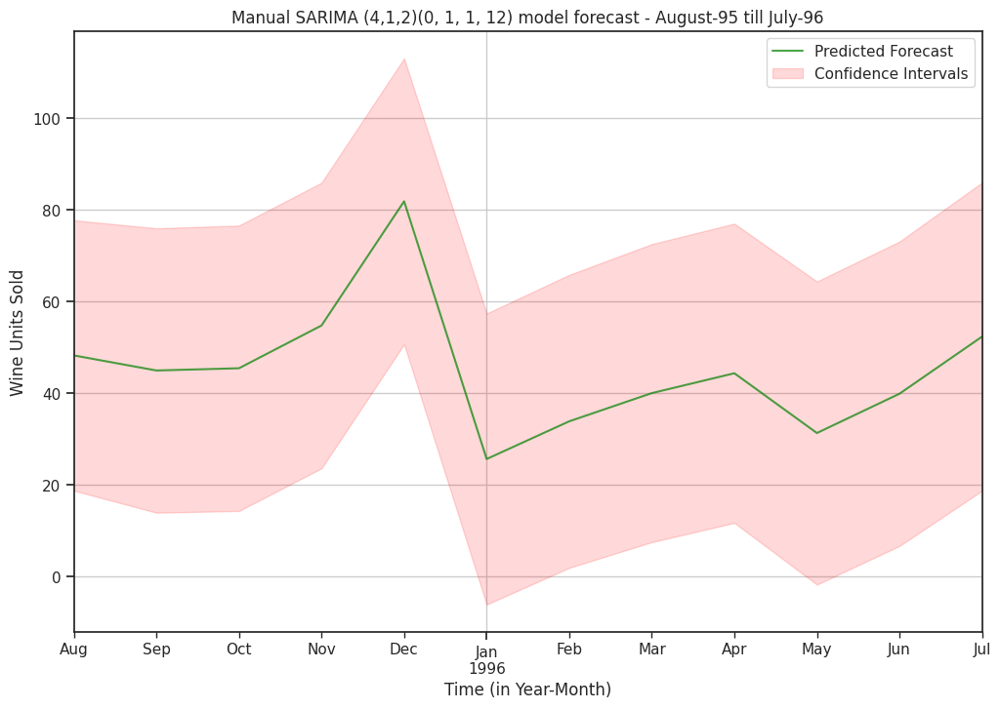

In [260]:
# plot the forecast along with the confidence band
plt.figure(figsize=(12,8))
axis = predicted_manual_sarima_df['mean'].plot(color='Green', label='Predicted Forecast', alpha=0.7)
axis.fill_between(predicted_manual_sarima_df.index, predicted_manual_sarima_df['mean_ci_lower'], predicted_manual_sarima_df['mean_ci_upper'], color='Red', alpha=.15, label='Confidence Intervals')
axis.set_title('Manual SARIMA (4,1,2)(0, 1, 1, 12) model forecast - August-95 till July-96')
axis.set_xlabel('Time (in Year-Month)')
axis.set_ylabel('Wine Units Sold')
plt.legend(loc='best')
plt.grid()
plt.show()

## 10. Comment on the model thus built and report your findings and suggest the measures that the company should be taking for future sales.

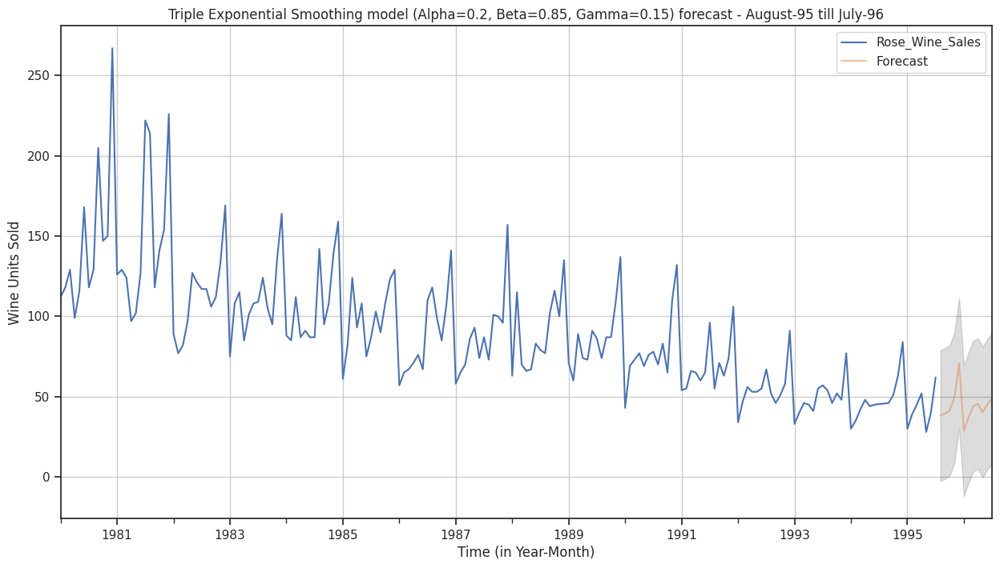

In [261]:
# plot the forecast along with the confidence band

axis = df.plot(label='Actual', figsize=(15,8))
predicted_df['prediction'].plot(ax=axis, label='Forecast', alpha=0.5)
axis.fill_between(predicted_df.index, predicted_df['lower_ci'], predicted_df['upper_ci'], color='k', alpha=.15)
plt.title('Triple Exponential Smoothing model (Alpha=0.2, Beta=0.85, Gamma=0.15) forecast - August-95 till July-96')
plt.xlabel('Time (in Year-Month)')
plt.ylabel('Wine Units Sold')
plt.legend(loc='best')
plt.grid()
plt.show()

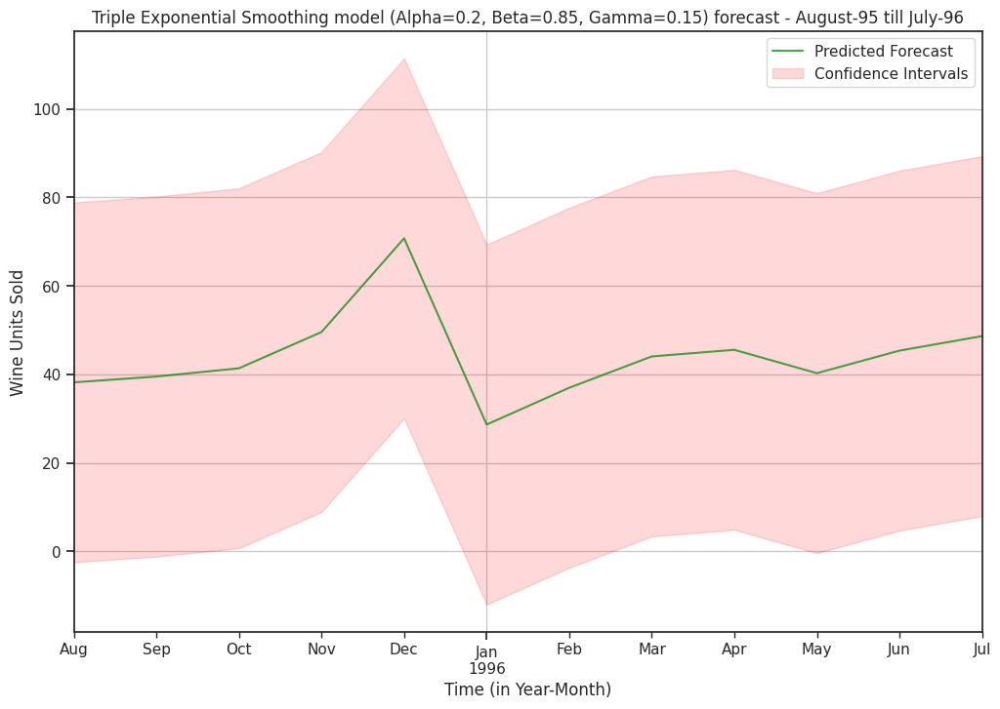

In [262]:
# plot the forecast along with the confidence band
plt.figure(figsize=(12,8))
axis = prediction.plot(color='Green', label='Predicted Forecast', alpha=0.7)
axis.fill_between(predicted_df.index, predicted_df['lower_ci'], predicted_df['upper_ci'], color='Red', alpha=.15, label='Confidence Intervals')
axis.set_title('Triple Exponential Smoothing model (Alpha=0.2, Beta=0.85, Gamma=0.15) forecast - August-95 till July-96')
axis.set_xlabel('Time (in Year-Month)')
axis.set_ylabel('Wine Units Sold')
plt.legend(loc='best')
plt.grid()
plt.show()

In [263]:
TES_Fullmodel.forecast(steps=12)

,0
1995-08-31,38.192838
1995-09-30,39.507940
1995-10-31,41.376237
1995-11-30,49.568190
1995-12-31,70.756182
1996-01-31,28.650617
1996-02-29,36.970795
1996-03-31,44.051743
1996-04-30,45.545585
1996-05-31,40.265786


In [264]:
TES_Fullmodel.forecast(steps=12).describe()

,0
count,12.000000
mean,44.074829
std,10.146316
min,28.650617
25%,39.179164
50%,42.713990
75%,46.320983
max,70.756182


In [265]:
#Calculating the percentage of sales in the last 4 months
(39+41+49+70)/TES_Fullmodel.forecast(steps=12).sum()

np.float64(0.37625405734155626)

We needed to construct an optimum model to forecast the rose wine sales for the next 12 months. The model information, insights and recommendations are as follows.  


Model Insights:

•	The time series in consideration exhibits a declining trend and stable seasonality. When comparing the various models, we can see that Triple Exponential Smoothing and SARIMA models frequently deliver the greatest results. This is due to the fact that these models are excellent at predicting time series that demonstrate trend and seasonality. Apart from these Double Exponential Smoothing and Moving Average Models also tend to perform moderately good.
•	We examine the root mean squared value of the forecast model to assess its performance (RMSE). The model with the lowest RMSE value and characteristics that match the test data is regarded as being a superior model.
•	We observed that Triple Exponential Smoothing model had the lowest RMSE and the characteristics that most closely fit test data. As a result, its regarded as the best model for forecasting.
Historical Insights:
•	The rose wine sales have declined throughout time. Rose wine sales peaked in 1980 & 1981 and fell to their present low position in 1995 (as we have data for only first 7 months).
•	The monthly sales trajectory appears to be exactly the opposite of the yearly plot, with a progressive increase towards the end of each year. January has the lowest wine sales, while December has the highest. From January to August, sales increase gradually, and then they quickly increase after that.
•	The average monthly sales of Rose wine are 90 bottles. More than 50% of the sold units of rose wine fall between 62 and 111. 28 units were sold as the lowest and 267 units as the most. Only 20% of monthly sales that were recorded were for more than 120 units.
•	Around 70 to 75 percent of the units sold are fewer than 100, and 90% of the units sold are less than 150. Only 15% of sales involved more than 50 items. Therefore, it is clear that the bulk of sales were in the range of 50 to 100 units.


Forecast Insights:

•	Based on the forecast made by the Triple Exponential Smoothing model previously presented, the following insights are offered.
•	The forecast calls for average sale of 44 units, down by 45 units from the historical average of 89 units. Thus, we might observe an alarming decrease in average sales by 50%.
•	The prediction for minimum sales volume of 28 units equals the minimum sales volume in the past. Consequently, a no percentage change could be seen in minimum quantity sold.
•	The projection estimates a maximum sales volume of 70 units, which is 197 units fewer than the largest sales volume recorded in the past, which was 267 units. Consequently, a 73% decrease in maximum sales is visible.
•	In comparison to the historical standard deviation of 62 recorded in the past, the forecast's standard deviation is 10 units, or 52 units lower. It's gone down by 83%. This is not anticipated because historical data tends to have less volatility than future data.
•	We can see from the prediction that the months of October, November, and December have increased sales. December is often when the sales are at their highest. There is a startling decline in sales in January following December. The months after January appear to witness a gradual improvement in sales until October, when it jumps sharply.



Recommendations:

•	Records show that the months of September, October, November, and December account for 40% of the total sales forecast. Many festivities take place in these months, and many people travel during this time. One of the most premium types of wine used during festive and event celebrations is rose wine.
•	Wine sales often climb in the final two months of the year as people hurry to buy holiday beverages. For forthcoming occasions like Thanksgiving, Christmas, and New Year's, people typically stock up. The majority of individuals also buy in bulk for holiday gatherings and gift-giving.
•	Many individuals choose wine as their go-to gift when it comes to occasions like parties and gift-giving. Sales of Rose wine rise just before the winter holidays as more collectors purchase these wines as presents or look for vintages to serve at holiday gatherings.
•	This blush wine works nicely with nearly anything, including spicy dishes, sushi, salads, grilled meats, roasts, and rich sauces. It is well renowned for its outdoor-friendly drinking style.
•	The festival seasons may vary depending on where you are geographically, however the most of the celebrations take place in the last four months.
	In these months, promotional offers might be implemented to lower costs and significantly boost revenue.
	To increase sales, we must take advantage of all holiday events and set prices appropriately.
	Many individuals order in bulk to prepare for upcoming festivities, which may result in a high shipping expenditure. Businesses may provide significant discounts or free shipping beyond a certain threshold at these times.
	Giving customers gifts to improve their user experience is one of the greatest marketing strategies to deploy. In order to attract more consumers and increase sales, the company might provide free gifts on orders with significant sales.
	To target various client demographics, the proper marketing campaigns must be run
	Numerous ecommerce campaigns and competitions may be performed to broaden the product's audience and enhance sales.
•	The period from January to June is one of the key challenges for Rose wine sales.
	To identify the elements affecting sales, in-depth market research must be conducted.
	Due to the fact that rose wines are premium category of wine, a market-friendly version of the existing product might be introduced by the company, helping to make up for the drop in sales. Long-term, this may bring in additional clients.
•	There are other key elements that might be driving the sales, despite the present model's ability to closely track the historical sales trend.
	The forecast might be improved by doing in-depth market research on the factors that influence sales and incorporating that information into the model for projection.
